In [ ]:
from google.colab import drive

drive.mount('/content/drive/', force_remount=True)
# !ls "/content/drive/MyDrive/FE_projects/"
# !ls "/content/drive/Shared Drives/FE_projects/"

Mounted at /content/drive/


The data is from FRED-MD:
https://fg-research.com/blog/general/posts/fred-md-overview.html

Follow the links on the page to get to the page with the data:
https://www.stlouisfed.org/research/economists/mccracken/fred-databases

In [ ]:
import pandas as pd
import numpy as np
df = pd.read_csv('/content/drive/MyDrive/FE_projects/2025-03.csv')

#df = pd.read_csv('/content/drive/MyDrive/FE_projects/2003-12.csv')
#df = pd.read_csv('/content/drive/MyDrive/FE_projects/FRED-MD_2015m5.csv')
#df = pd.read_csv("FRED-MD_2015m5.csv")
#df = pd.read_csv('FE_projects/2025-03.csv')
#df

ALSO: Instead of manually testing the series, we can follow the authors' FREDMD's recommendation of how to best make the time series stationary:
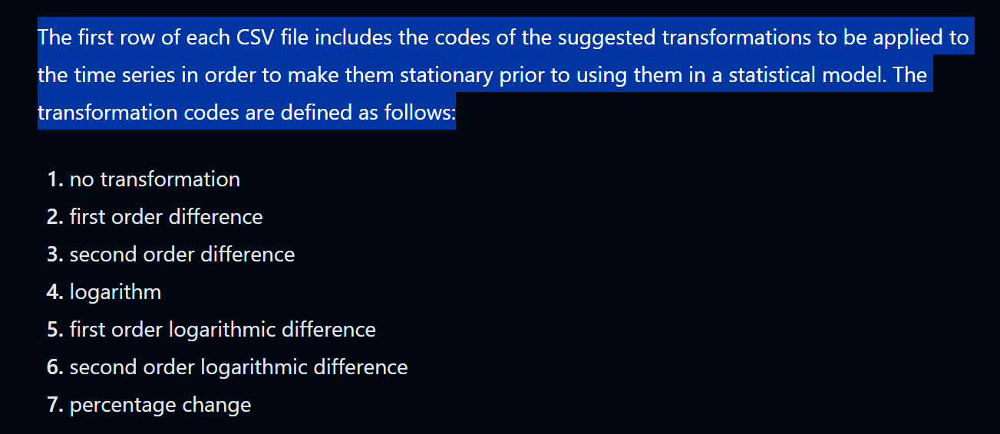

In [ ]:
import os
import pandas as pd
import numpy as np

# define function to transform data according to recommendations
def transform_series(x, tcode):
    if tcode == 1:
        return x
    elif tcode == 2:
        return x.diff()
    elif tcode == 3:
        return x.diff().diff()
    elif tcode == 4:
        return np.log(x)
    elif tcode == 5:
        return np.log(x).diff()
    elif tcode == 6:
        return np.log(x).diff().diff()
    elif tcode == 7:
        return x.pct_change()
    else:
        raise ValueError(f"unknown `tcode` {tcode}")

# define function to remove outliers beyond a threshold
# here: values beyond 3 standard deviations are considered outliers
def remove_outliers(series, threshold=3.0):
    # compute mean and std, skip NaNs
    mean = series.mean()
    std = series.std()
    # mask values where deviation exceeds threshold
    return series.mask((series - mean).abs() > threshold * std)

# define function to apply to different time series
def get_data(filename, transform=True, outlier_threshold=3.0):
    '''
    Define and transform the time series, and optionally remove outliers.

    Parameters
    ----------
    filename : str
        Path to the CSV file containing data and transformation codes.
    transform : bool, optional
        Whether to apply transformations (default True).
    outlier_threshold : float, optional
        Number of standard deviations to use when masking outliers (default 3.0).
    '''

    # load the data, skipping the second row which contains transformation codes
    data = pd.read_csv(filename, skiprows=[1], index_col=0)
    data.columns = [c.upper() for c in data.columns]

    # process the dates
    data = data.loc[pd.notna(data.index), :]
    data.index = pd.date_range(start="1959-01-01", freq="MS", periods=len(data))

    if transform:
        # read transformation codes from the first row
        tcodes = pd.read_csv(filename, nrows=1, index_col=0)
        tcodes.columns = [c.upper() for c in tcodes.columns]

        # apply transformation per series
        data = data.apply(lambda x: transform_series(x, tcodes[x.name].item()))

    # remove outliers if threshold is specified
    if outlier_threshold is not None:
        data = data.apply(lambda x: remove_outliers(x, threshold=outlier_threshold))

    return data


# Using Most Recent Data

In [ ]:
# Remove the first -- second in data frame -- row (which held the tcodes)
# df = get_data("FE_projects/2025-03.csv",transform=True)
df = get_data('/content/drive/MyDrive/FE_projects/2025-03.csv',transform=True)
#df = get_data('2025-03.csv',transform=True)

# make 1960:3 the start to 2014:12
df=df.iloc[12:-2,:]
df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,DTCOLNVHFNM,DTCTHFNM,INVEST,VIXCLSX
1960-01-01,0.003226,0.004661,0.002791,0.016963,0.026606,0.025919,0.024097,0.029021,0.031234,NaN,...,-0.001845,-0.001246,-0.004680,0.007797,-0.009705,NaN,0.004292,-0.011739,-0.013330,NaN
1960-02-01,0.001147,0.000906,0.004361,0.014403,0.003696,-0.008937,-0.005686,-0.003436,-0.011454,-0.013856,...,0.001683,0.000858,-0.004555,0.003853,-0.004750,NaN,0.008268,0.005388,-0.018942,NaN
1960-03-01,0.001877,0.000905,0.014089,-0.028040,-0.001102,-0.009021,-0.003427,-0.001151,0.001151,-0.019967,...,0.001791,-0.001146,-0.000020,NaN,-0.004684,NaN,0.003472,0.000951,0.003490,NaN
1960-04-01,0.003465,0.003612,0.015302,0.009853,0.025903,-0.007956,0.002286,0.001151,0.006882,-0.001188,...,0.004424,0.001523,-0.008949,NaN,0.000000,NaN,0.008678,0.005452,0.024136,NaN
1960-05-01,0.002405,0.002427,-0.020351,-0.031518,-0.015047,-0.001143,0.005692,0.006865,0.005696,0.009459,...,-0.006700,0.000565,0.008949,NaN,0.000000,NaN,-0.004827,-0.002067,0.003798,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-01,0.000066,-0.000117,0.000711,0.000375,-0.001144,0.004869,0.004515,0.007094,0.009218,0.047547,...,-0.002222,-0.000061,-0.002580,0.001376,-0.006110,1.5,-0.001974,-0.000766,0.001457,19.6750
2024-09-01,0.001458,0.000240,0.005257,0.007155,0.008903,-0.004126,-0.005642,-0.008633,-0.001945,0.000040,...,-0.002598,0.000553,0.004137,0.001906,0.004652,2.2,-0.002368,-0.001586,-0.001713,17.6597
2024-10-01,0.003077,0.003231,0.001322,-0.001849,0.005575,-0.003207,-0.007324,-0.011101,-0.006165,-0.029814,...,0.003609,0.000727,-0.003839,-0.005006,-0.002154,0.4,-0.000203,0.001703,-0.000679,19.9478
2024-11-01,0.001798,0.002507,0.004463,0.004270,0.006484,-0.002387,-0.002804,-0.002086,-0.006370,0.014352,...,0.000117,-0.002130,-0.000639,-0.002760,0.003190,1.3,-0.000872,-0.001684,-0.011910,15.9822


# Brief Data Description for Report

Source: FRED-MD: Monthly Data.

FRED-MD is a large macroeconomic database of 134 -- actually only 127 -- monthly U.S.
indicators. It mimicks the coverage of datasets already used in the literature -- e.g. Stock and Watson (2002) but they add three appealing features: They are updated in real-time through the FRED database. They are publicly accessible, facilitating the replication of empirical work. And they relieve the researcher of the task of incorporating data changes and revisions (a task accomplished by the Data Desk at the Federal Reserve Bank of St. Louis.

The FRED-MD dataset includes eight different categories of macroeconomic indicators (see the Appendix for the full list):

Output and Income

Labor Market

Consumption and Orders

Orders and Inventories

Money and Credit

Interest Rates and Exchange Rates

Prices

Stock Market

######


Threats to reproducability:

"The main difficulty is almost entirely due
to changing definitions and data availability. Even with careful selection of variables that meet the
fourth criterion of Stock and Watson (1996), researchers have often had to deal with data revisions
that took place for one reason or another."

Summary of adjustements can be found in the description paper of FRED-MD, page 5.

######

Notes on the paper and the original vs. used data:

Not outlier adjustments have been made to the raw data.

Volatility in Ludvigson and Ng was realized volatility. BIC was used for PCA Analysis.

All of the raw data in xt are standardized prior to estimation.





In [ ]:
# df.columns
df.describe()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,DTCOLNVHFNM,DTCTHFNM,INVEST,VIXCLSX
count,771.000000,767.000000,774.000000,774.000000,770.000000,771.000000,773.000000,773.000000,772.000000,769.000000,...,765.000000,776.000000,769.000000,764.000000,767.000000,558.000000,764.000000,772.000000,773.000000,736.000000
mean,0.002499,0.002529,0.002702,0.002214,0.004699,0.002255,0.001964,0.002017,0.001406,0.001821,...,0.000181,-0.000005,-0.000087,-0.000080,-0.000179,0.049104,-0.000003,-0.000010,-0.000021,18.752843
std,0.004989,0.003825,0.005032,0.010373,0.010874,0.006937,0.007004,0.007721,0.008344,0.019848,...,0.005116,0.001419,0.003437,0.007061,0.003802,3.812776,0.016508,0.009950,0.009623,5.822369
min,-0.027897,-0.015756,-0.020351,-0.032079,-0.039421,-0.025202,-0.025363,-0.025991,-0.028509,-0.087663,...,-0.017240,-0.004619,-0.011757,-0.025510,-0.013565,-11.900000,-0.073316,-0.058434,-0.031430,9.484400
25%,0.000614,0.000299,0.000123,-0.003600,-0.001094,-0.001712,-0.002267,-0.002522,-0.003448,-0.008316,...,-0.002582,-0.000838,-0.002188,-0.003313,-0.002335,-2.300000,-0.006321,-0.003733,-0.005569,14.233375
50%,0.002655,0.002781,0.002547,0.002375,0.004826,0.002450,0.002271,0.002135,0.001649,0.002597,...,0.000048,-0.000061,-0.000013,-0.000015,-0.000013,-0.100000,0.000522,0.000576,0.000432,17.564050
75%,0.004680,0.004849,0.005625,0.008338,0.010709,0.006335,0.006277,0.006903,0.006491,0.012960,...,0.002958,0.000783,0.001926,0.003291,0.002065,2.500000,0.006095,0.004717,0.005663,22.294125
max,0.035836,0.016826,0.025443,0.035435,0.048627,0.030429,0.029290,0.031929,0.031234,0.098229,...,0.017692,0.004444,0.011722,0.026213,0.013419,12.000000,0.073645,0.057177,0.032176,39.247100


# SKIP UNTIL PCA Paper Recreation - FRED-MD: A Monthly Database for Macroeconomic Research



## Balanced Panel

See: https://fg-research.com/blog/general/posts/fred-md-overview.html

In [ ]:
# Remove the first row (which held the tcodes)
df = get_data("/content/drive/MyDrive/FE_projects/FRED-MD_2015m5.csv",transform=True)
df



,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
1959-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1959-02-01,0.004271,0.003989,0.010336,0.007634,0.007310,0.019397,0.013409,0.008625,0.007307,0.005238,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1959-03-01,0.006415,0.007287,0.009476,-0.003055,0.008321,0.014303,0.006035,0.004893,0.000000,0.019389,...,-0.001107,0.000327,0.009346,-0.008147,0.004819,NaN,0.001066,0.004929,0.004138,-0.014792
1959-04-01,0.006074,0.006641,-0.003617,0.019306,0.000616,0.021077,0.014337,0.014546,0.015651,0.006382,...,0.001308,0.001801,-0.004705,0.012203,-0.004890,NaN,-0.002539,0.012134,0.006734,0.024929
1959-05-01,0.005994,0.006824,0.011936,0.007018,0.007803,0.014950,0.008270,0.009584,0.004768,0.020156,...,-0.001711,-0.001891,-0.000021,-0.004090,-0.004819,NaN,0.004646,0.002828,0.002020,-0.015342
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-01,0.005603,0.005059,0.000681,0.005742,-0.008769,-0.000512,-0.005710,-0.007078,-0.005316,-0.004775,...,-0.001709,-0.000803,-0.002306,-0.002822,-0.000510,NaN,0.002062,0.005821,0.008617,0.011412
2015-01-01,0.007940,0.006564,0.001677,0.002140,-0.007720,-0.003360,-0.001748,-0.002898,0.002893,-0.009371,...,-0.011754,-0.000253,0.004611,0.008452,0.002038,NaN,-0.001699,-0.004456,-0.013636,-0.006287
2015-02-01,0.002664,0.002343,-0.000026,0.001305,-0.005320,-0.000649,0.001855,0.002304,0.004490,-0.019711,...,NaN,0.000313,-0.002306,-0.012872,0.002031,NaN,0.003972,-0.000981,-0.000127,-0.002390
2015-03-01,-0.001306,-0.002725,0.002704,NaN,0.011178,-0.003225,-0.004338,-0.002795,-0.000800,0.022243,...,0.000618,0.000204,0.005054,0.018470,-0.000009,NaN,-0.004825,0.006909,0.005037,-0.005955


we actually need to drop the last row, the authors have 675 observations not 676.

Following previous studies, we take 1960:1 as the start of the sample. After losing two observations to data transformation, the panel we use for analysis is for the sample 1960:3 to 2014:12 with 658 observations

In [ ]:
# make 1960:3 the start to 2014:12
df=df.iloc[14:-4,:]
df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
1960-03-01,0.001837,0.000843,0.014064,-0.027752,-0.001102,-0.009018,-0.003426,-0.001148,0.001151,-0.019968,...,0.001748,-0.001040,-0.000020,NaN,-0.004684,NaN,0.001738,0.003472,0.000951,0.003490
1960-04-01,0.003498,0.003585,0.015352,0.009277,0.025903,-0.007960,0.002286,0.001148,0.006880,-0.001185,...,0.004470,0.001514,-0.004474,NaN,0.000000,NaN,-0.001048,0.008678,0.005452,0.024136
1960-05-01,0.002533,0.002559,NaN,-0.031425,-0.015047,-0.001140,0.005691,0.006865,0.005698,0.009456,...,-0.006715,0.000711,0.000000,NaN,0.000000,NaN,0.001035,-0.004827,-0.002067,0.003798
1960-06-01,0.000456,-0.000441,-0.000261,0.008442,-0.001364,-0.012653,-0.011415,-0.011470,-0.006841,-0.010642,...,0.000248,-0.000879,0.000000,-1.142870e-02,0.000000,NaN,0.001027,0.005126,0.007420,-0.009981
1960-07-01,0.001036,0.001101,0.002033,-0.007056,-0.010099,-0.003477,-0.005757,-0.005780,-0.009197,-0.038796,...,0.001785,0.000629,0.000000,7.547206e-03,0.000000,NaN,0.001358,-0.010926,-0.003291,0.032176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-08-01,0.004433,0.004007,0.006546,-0.002216,0.005777,-0.000150,-0.004149,-0.006905,-0.009831,-0.036831,...,-0.006594,0.000279,-0.000467,-1.643091e-07,-0.000004,0.7,-0.003632,0.000220,0.000318,-0.008320
2014-09-01,0.001236,0.001315,0.001581,0.002808,-0.003194,0.007008,0.006520,0.006184,0.009475,-0.002963,...,0.005408,-0.000129,-0.001387,2.830980e-03,-0.002549,2.1,0.000668,0.000937,-0.001237,0.006109
2014-10-01,0.003038,0.003429,0.003830,0.003807,0.004285,-0.000402,0.001347,0.000289,-0.003087,-0.001416,...,-0.001714,0.000124,0.001383,-1.218899e-03,0.002037,2.3,0.001568,-0.007595,-0.003711,-0.004309
2014-11-01,0.005568,0.006340,0.005355,0.004154,0.005121,0.010701,0.015374,0.018260,0.021534,0.035432,...,-0.008026,0.000448,-0.001844,-1.211548e-03,-0.002037,NaN,-0.000597,-0.001849,0.002456,0.001929


In [ ]:
# We Double check the amount of missing observations at the beginning and the end of the sample
sum(df.isna().sum())

# output: 852

1949

In [ ]:
# if df.isna().sum() > 0 has a true entry, drop the respective column
df = df.dropna(axis=1)
print(sum(df.isna().sum()))

# output: 0
# We have our balanced panel without missing values
df.head()

0


,CLAIMSX,PERMIT,PERMITNE,PERMITS
1960-03-01,0.000000,6.861711,5.111988,5.609472
1960-04-01,-0.026938,6.923629,5.241747,5.655992
1960-05-01,-0.104224,6.958448,5.411646,5.710427
1960-06-01,0.029853,6.864848,5.170484,5.652489
1960-07-01,0.220198,6.906755,5.389072,5.590987


we get the exact same dataframe

## Non-Balanced Panel Data for Paper Results
We do not drop the other series and use our EM algorithm instead to fill missing observations

In [ ]:
# Remove the first row (which held the tcodes)
df = get_data("/content/drive/MyDrive/FE_projects/FRED-MD_2015m5.csv",transform=True)
# male 1960:3 the start to 2014:12
df=df.iloc[12:-1,:]
df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
1960-01-01,0.004317,0.005743,0.002754,0.017046,0.026606,0.025915,0.024099,NaN,NaN,NaN,...,-0.001798,-0.001204,-0.004680,0.007797,-0.009705,NaN,-0.002451,0.004292,-0.011739,-0.013330
1960-02-01,0.000669,0.000488,0.004380,0.014596,0.003696,-0.008938,-0.005685,-0.003441,-0.011455,-0.013859,...,0.001649,0.000638,-0.004555,0.003853,-0.004750,NaN,-0.000001,0.008268,0.005388,-0.018942
1960-03-01,0.001837,0.000843,0.014064,-0.027752,-0.001102,-0.009018,-0.003426,-0.001148,0.001151,-0.019968,...,0.001748,-0.001040,-0.000020,NaN,-0.004684,NaN,0.001738,0.003472,0.000951,0.003490
1960-04-01,0.003498,0.003585,0.015352,0.009277,0.025903,-0.007960,0.002286,0.001148,0.006880,-0.001185,...,0.004470,0.001514,-0.004474,NaN,0.000000,NaN,-0.001048,0.008678,0.005452,0.024136
1960-05-01,0.002533,0.002559,NaN,-0.031425,-0.015047,-0.001140,0.005691,0.006865,0.005698,0.009456,...,-0.006715,0.000711,0.000000,NaN,0.000000,NaN,0.001035,-0.004827,-0.002067,0.003798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-11-01,0.005568,0.006340,0.005355,0.004154,0.005121,0.010701,0.015374,0.018260,0.021534,0.035432,...,-0.008026,0.000448,-0.001844,-0.001212,-0.002037,NaN,-0.000597,-0.001849,0.002456,0.001929
2014-12-01,0.005603,0.005059,0.000681,0.005742,-0.008769,-0.000512,-0.005710,-0.007078,-0.005316,-0.004775,...,-0.001709,-0.000803,-0.002306,-0.002822,-0.000510,NaN,0.002062,0.005821,0.008617,0.011412
2015-01-01,0.007940,0.006564,0.001677,0.002140,-0.007720,-0.003360,-0.001748,-0.002898,0.002893,-0.009371,...,-0.011754,-0.000253,0.004611,0.008452,0.002038,NaN,-0.001699,-0.004456,-0.013636,-0.006287
2015-02-01,0.002664,0.002343,-0.000026,0.001305,-0.005320,-0.000649,0.001855,0.002304,0.004490,-0.019711,...,NaN,0.000313,-0.002306,-0.012872,0.002031,NaN,0.003972,-0.000981,-0.000127,-0.002390


## SKIPFurther Analysis

While we provide a csv file with current and historical data, FRED-MD is not a balanced panel
for a number of reasons:

(1) The S&P PE ratio (series 83) is taken from Shiller’s website and is released with roughly a
6-month lag. Hence observations are missing at the end of the sample.

(2) The Michigan Survey of Consumer Sentiment (series 130) is available only quarterly prior to
1977:11, and recent data are available in FRED with a 1-year lag.

(3) The trade-weighted exchange rate (series 101) is available in FRED only through 1973:1, and
we have not found other documented sources with which to splice the series.

(4) Seasonally adjusted housing permits (series 55-59) exist only through 1960:01.

(5) A few Value of Manufacturers’ Orders components such as Nondefense Capital Goods (series
66) and especially Consumer Goods (series 64) have a limited history because of the new
NAICS discussed above.

In [ ]:
tickers = [
    # Group 1: Output and Income
    'RPI', 'W875RX1', 'INDPRO', 'IPFPNSS', 'IPFINAL', 'IPCONGD', 'IPDCONGD',
    'IPNCONGD', 'IPBUSEQ', 'IPMAT', 'IPDMAT', 'IPNMAT', 'IPMANSICS', 'IPB51222s',
    'IPFUELS', 'NAPMPI', 'CUMFNS',

    # Group 2: Labor Market
    'HWI', 'HWIURATIO', 'CLF16OV', 'CE16OV', 'UNRATE', 'UEMPMEAN', 'UEMPLT5',
    'UEMP5TO14', 'UEMP15OV', 'UEMP15T26', 'UEMP27OV', 'CLAIMSx', 'PAYEMS',
    'USGOOD', 'CES1021000001', 'USCONS', 'MANEMP', 'DMANEMP', 'NDMANEMP',
    'SRVPRD', 'USTPU', 'USWTRADE', 'USTRADE', 'USFIRE', 'USGOVT', 'CES0600000007',
    'AWOTMAN', 'AWHMAN', 'NAPMEI', 'CES0600000008', 'CES2000000008',
    'CES3000000008',

    # Group 3: Consumption and Orders
    'HOUST', 'HOUSTNE', 'HOUSTMW', 'HOUSTS', 'HOUSTW', 'PERMIT', 'PERMITNE',
    'PERMITMW', 'PERMITS', 'PERMITW',

    # Group 4: Orders and Inventories
    'DPCERA3M086SBEA', 'CMRMTSPLx', 'RETAILx', 'NAPM', 'NAPMNOI', 'NAPMSDI',
    'NAPMII', 'ACOGNO', 'AMDMNOx', 'ANDENOx', 'AMDMUOx', 'BUSINVx', 'ISRATIOx',
    'UMCSENTx',

    # Group 5: Money and Credit
    'M1SL', 'M2SL', 'M2REAL', 'AMBSL', 'TOTRESNS', 'NONBORRES', 'BUSLOANS',
    'REALLN', 'NONREVSL', 'CONSPI', 'MZMSL', 'DTCOLNVHFNM', 'DTCTHFNM',
    'INVEST',

    # Group 6: Interest Rate and Exchange Rates
    'FEDFUNDS', 'CP3Mx', 'TB3MS', 'TB6MS', 'GS1', 'GS5', 'GS10', 'AAA', 'BAA',
    'COMPAPFFx', 'TB3SMFFM', 'TB6SMFFM', 'T1YFFM', 'T5YFFM', 'T10YFFM',
    'AAAFFM', 'BAAFFM', 'TWEXMMTH', 'EXSZUSx', 'EXJPUSx', 'EXUSUKx', 'EXCAUSx',

    # Group 7: Prices
    'PPIFGS', 'PPIFCG', 'PPIITM', 'PPICRM', 'OILPRICEx', 'PPICMM', 'NAPMPRI',
    'CPIAUCSL', 'CPIAPPSL', 'CPITRNSL', 'CPIMEDSL', 'CUSR0000SAC', 'CUUR0000SAD',
    'CUSR0000SAS', 'CPIULFSL', 'CUUR0000SA0L2', 'CUSR0000SA0L5', 'PCEPI',
    'DDURRG3M086SBEA', 'DNDGRG3M086SBEA', 'DSERRG3M086SBEA',

    # Group 8: Stock Market
    'S&P 500', 'S&P: indust', 'S&P div yield', 'S&P PE ratio'
]

# df = df.iloc[13:-254,:] # to check for the Stock and Watson data
df = df.iloc[15:,1:] # to check for the Stock and Watson data

# # drop from tickers entries that are not in df
#tickers_in_df = [col for col in tickers if col in df.columns] # create new list with only valid tickers

# # drop from df columns that are not in tickets
#df = df.loc[:,tickers_in_df]
df

,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,IPNCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
1961-04-01,0.003765,0.000515,-0.030484,-0.017860,0.020348,0.015266,0.016547,0.023284,0.069999,0.008928,...,-0.002423,0.001719,0.008772,-0.000053,0.009217,NaN,-0.001665,0.006111,0.005728,0.007390
1961-05-01,0.005447,0.006054,0.028491,0.014924,0.015284,0.006971,0.008172,0.011442,0.031387,0.006644,...,0.003694,-0.000862,-0.004415,-0.003656,-0.004640,NaN,0.001281,0.003937,0.001458,0.007509
1961-06-01,0.008310,0.002401,0.017804,0.007407,0.013906,0.010364,0.009262,0.011312,0.032833,0.004407,...,-0.000793,0.000777,-0.000019,0.003578,-0.000021,NaN,-0.000030,0.007342,0.007624,0.014077
1961-07-01,0.002454,-0.003015,-0.020121,-0.000771,0.011441,0.007982,0.006889,0.008960,0.017780,0.004385,...,0.004848,-0.000315,-0.000019,-0.014389,-0.000021,NaN,-0.002279,-0.006533,-0.004779,-0.013104
1961-08-01,0.003991,0.003577,0.035155,0.010962,0.009063,0.006797,0.006842,0.006666,0.002349,0.008714,...,-0.002573,-0.000857,-0.000019,0.010798,-0.000020,NaN,0.002231,-0.001289,0.000983,0.007405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-11-01,0.006340,0.005355,0.004154,0.005121,0.010701,0.015374,0.018260,0.021534,0.035432,0.017482,...,-0.008026,0.000448,-0.001844,-0.001212,-0.002037,NaN,-0.000597,-0.001849,0.002456,0.001929
2014-12-01,0.005059,0.000681,0.005742,-0.008769,-0.000512,-0.005710,-0.007078,-0.005316,-0.004775,-0.005474,...,-0.001709,-0.000803,-0.002306,-0.002822,-0.000510,NaN,0.002062,0.005821,0.008617,0.011412
2015-01-01,0.006564,0.001677,0.002140,-0.007720,-0.003360,-0.001748,-0.002898,0.002893,-0.009371,0.006460,...,-0.011754,-0.000253,0.004611,0.008452,0.002038,NaN,-0.001699,-0.004456,-0.013636,-0.006287
2015-02-01,0.002343,-0.000026,0.001305,-0.005320,-0.000649,0.001855,0.002304,0.004490,-0.019711,0.011354,...,NaN,0.000313,-0.002306,-0.012872,0.002031,NaN,0.003972,-0.000981,-0.000127,-0.002390


In [ ]:
from statsmodels.tsa.stattools import adfuller

def perform_adf_test(series):
    result = adfuller(series)
    return result[0], result[1]  # Return ADF statistic and p-value

adf_results = {}
for col in df.columns:
    try:
        adf_statistic, p_value = perform_adf_test(df[col].dropna())
        adf_results[col] = {'ADF Statistic': adf_statistic, 'p-value': p_value}
    except Exception as e:
      print(f"Error processing column {col}: {e}")
      adf_results[col] = {'ADF Statistic': None, 'p-value': None}

adf_results_df = pd.DataFrame.from_dict(adf_results, orient='index')
adf_results_df

,ADF Statistic,p-value
W875RX1,-5.091880,1.455573e-05
DPCERA3M086SBEA,-4.978407,2.448380e-05
CMRMTSPLX,-6.105286,9.617652e-08
RETAILX,-5.303687,5.380166e-06
INDPRO,-8.721443,3.376980e-14
...,...,...
UMCSENTX,-16.452932,2.369049e-29
MZMSL,-9.148896,2.720237e-15
DTCOLNVHFNM,-14.727788,2.689099e-27
DTCTHFNM,-8.314139,3.719995e-13


In [ ]:
adf_results_df.loc['USGOVT']

,USGOVT
ADF Statistic,-3.261701
p-value,0.016680


In [ ]:
non_stationary_data = adf_results_df[adf_results_df['p-value']>0.5].index.tolist()
df[non_stationary_data] = np.log(df[non_stationary_data]).diff()
df = df.iloc[:,1:]

In [ ]:
# second time
adf_results = {}
for col in df.columns:
    try:
        adf_statistic, p_value = perform_adf_test(df[col].dropna())
        adf_results[col] = {'ADF Statistic': adf_statistic, 'p-value': p_value}
    except Exception as e:
      print(f"Error processing column {col}: {e}")
      adf_results[col] = {'ADF Statistic': None, 'p-value': None}

adf_results_df = pd.DataFrame.from_dict(adf_results, orient='index')
non_stationary_data = adf_results_df[adf_results_df['p-value']>0.05].index.tolist()
non_stationary_data

['AWHMAN', 'HOUSTNE', 'HOUSTMW', 'PERMITNE', 'PERMITMW']

In [ ]:
df[non_stationary_data] = df[non_stationary_data].diff()
# df = df.iloc[13:,:]

<ipython-input-46-644989d25542>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[non_stationary_data] = df[non_stationary_data].diff()


In [ ]:
# third time
adf_results = {}
for col in df.columns:
    try:
        adf_statistic, p_value = perform_adf_test(df[col].dropna())
        adf_results[col] = {'ADF Statistic': adf_statistic, 'p-value': p_value}
    except Exception as e:
      print(f"Error processing column {col}: {e}")
      adf_results[col] = {'ADF Statistic': None, 'p-value': None}

adf_results_df = pd.DataFrame.from_dict(adf_results, orient='index')
non_stationary_data = adf_results_df[adf_results_df['p-value']>0.05].index.tolist()

non_stationary_data

[]

In [ ]:
df[non_stationary_data] = df[non_stationary_data].diff()
# df = df.iloc[13:,:]

In [ ]:
adf_statistic, p_value = perform_adf_test(df['USGOVT'].dropna())
adf_statistic, p_value

(np.float64(-3.2617006361601657), np.float64(0.016679701144898813))

In [ ]:
# Already done above
# df = df.iloc[15:,:]

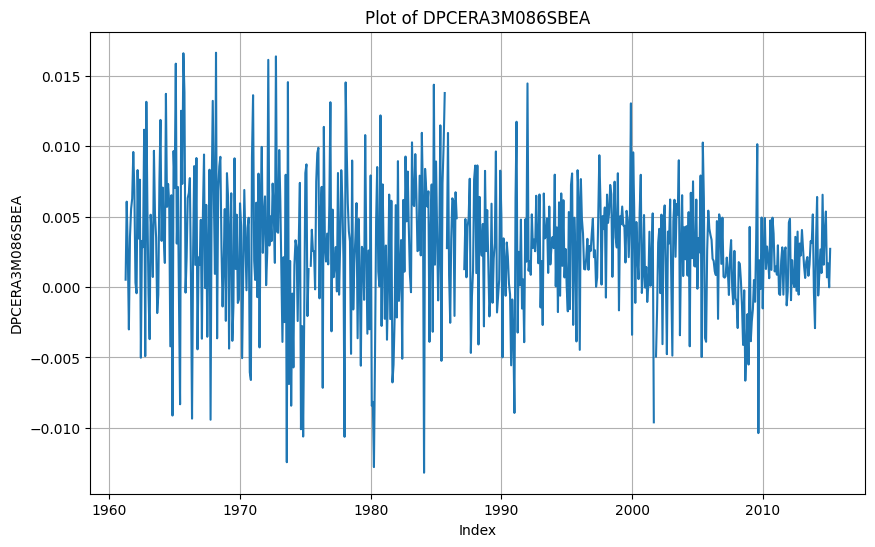

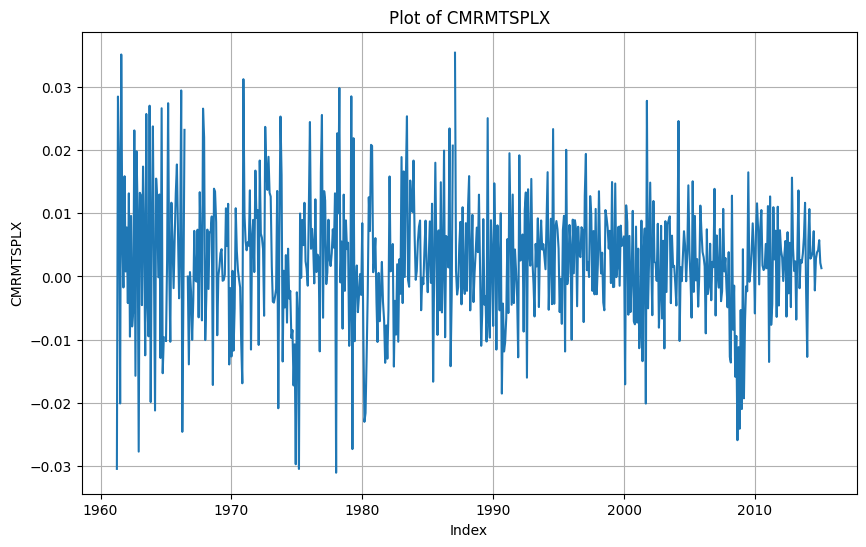

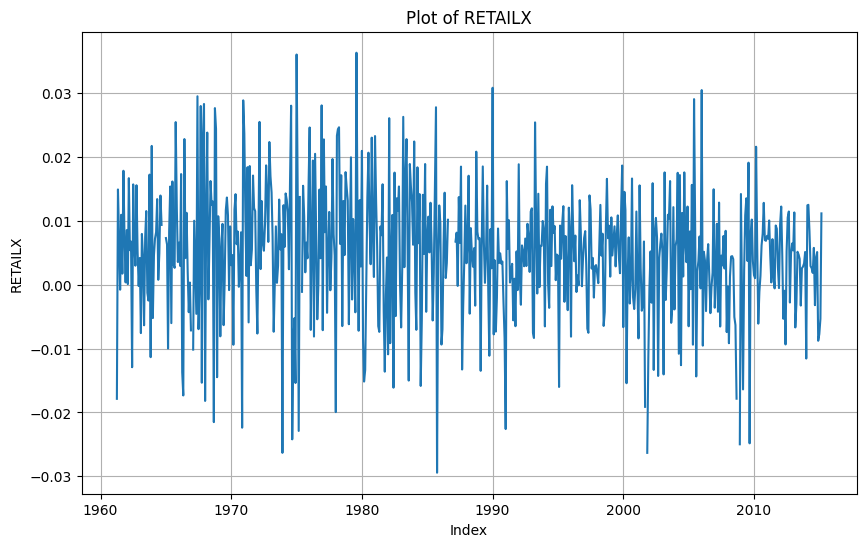

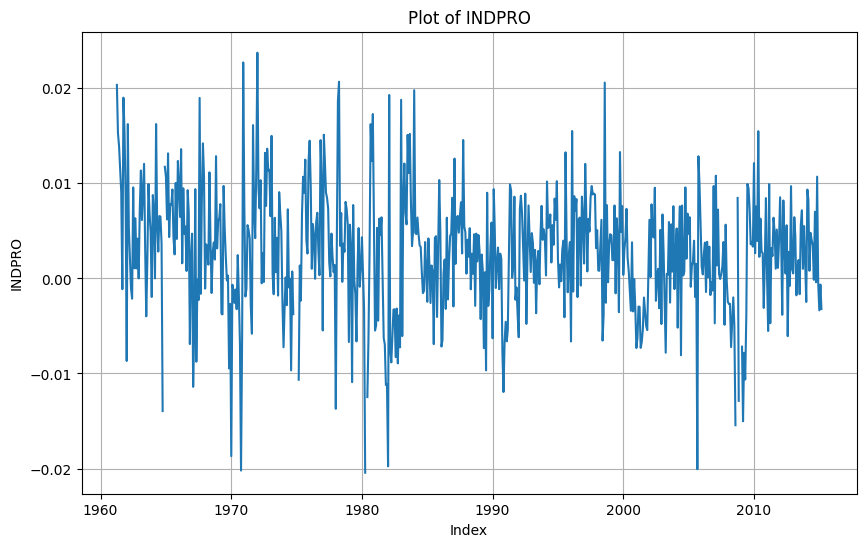

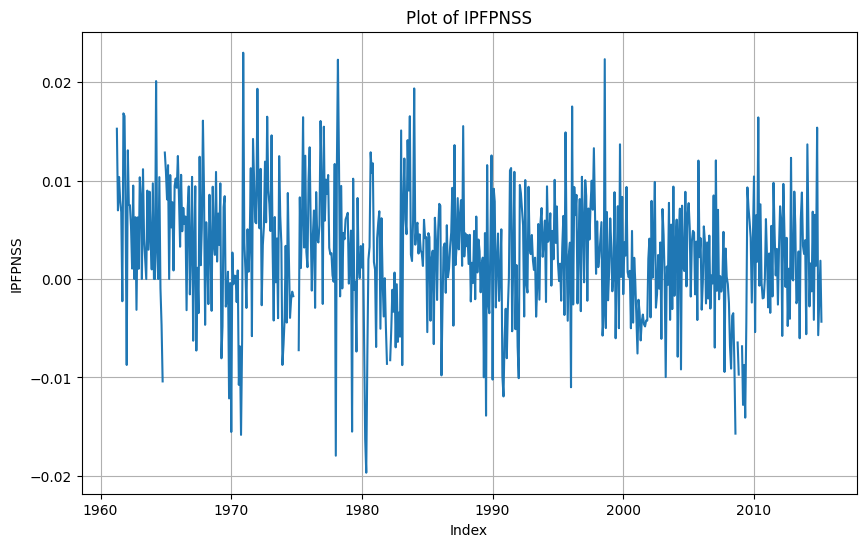

...

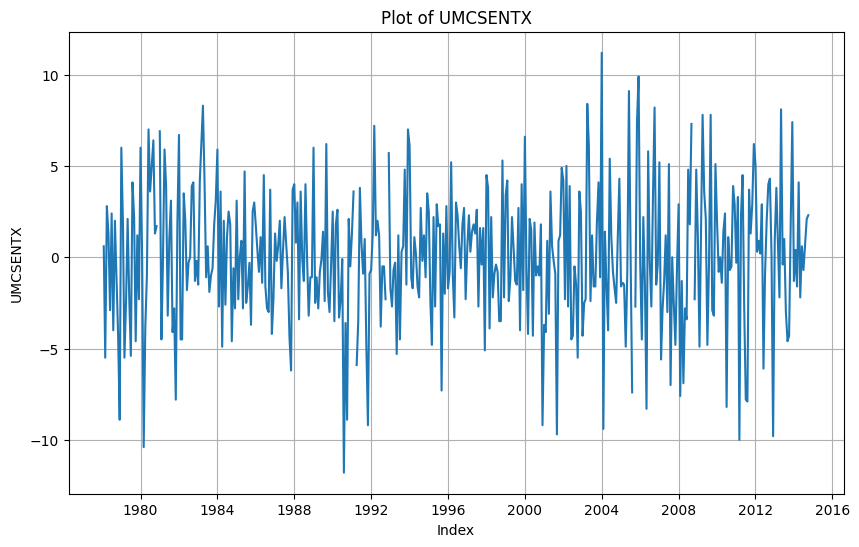

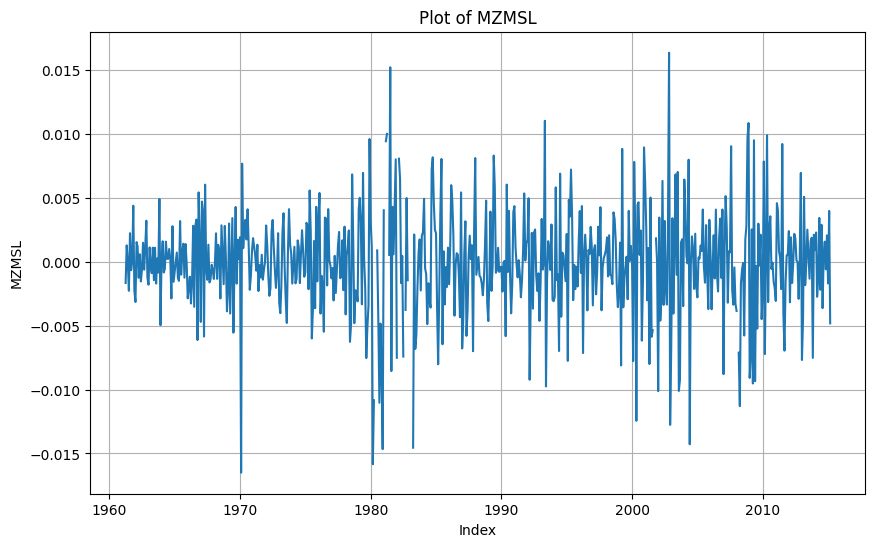

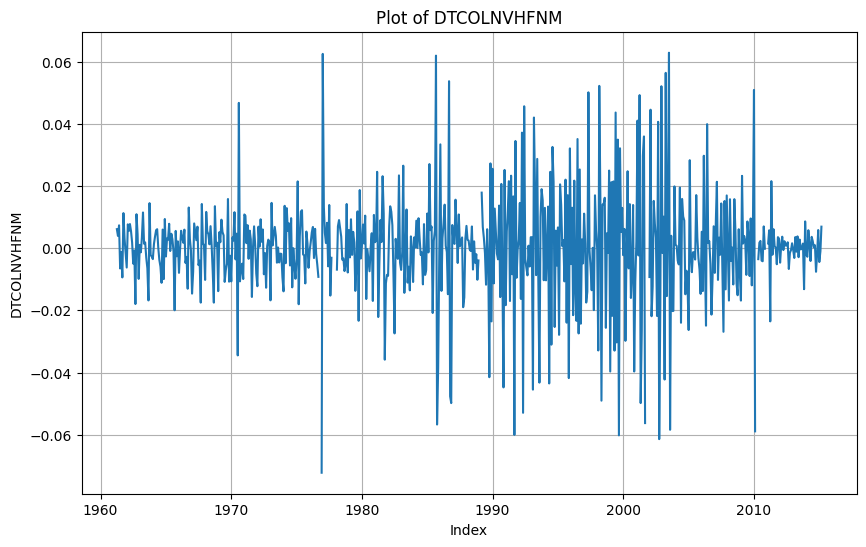

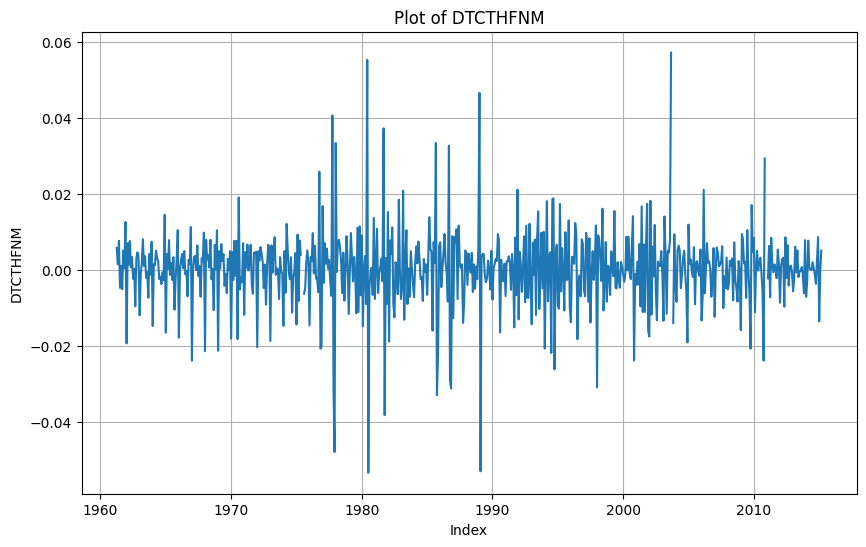

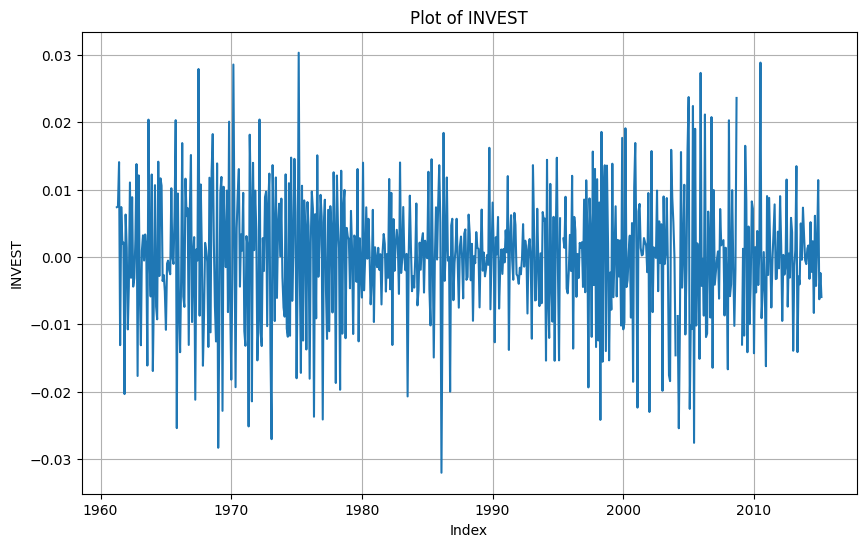

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
for col in df.columns:
    plt.figure(figsize=(10, 6))  # Adjust figure size if needed
    plt.plot(df[col])
    plt.title(f'Plot of {col}')
    plt.xlabel('Index')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()

data description and basic algorithm discusses in the Stock and Watson paper can be found at: https://s3.amazonaws.com/real.stlouisfed.org/wp/2015/2015-012.pdf

Criterion for choosing number of factors in factor models on page 7:
We want to have a sense of whether the number of factors is sensitive to the
vintage of data used. Hence, for our purpose, which criterion we use is not so important provided
that the same criterion is used throughout. We use the P Cp criteria developed in Bai and Ng
(2002), which is a generalization of Mallow’s Cp criteria for large dimensional panels

Alternatively, can check the largest eigenvalues or choose the number based on the best model fit.

-----------------------------------------------

There are, however, 22
series that have the idiosyncratic component explaining 90% of the variation. The ten series with the
largest idiosyncratic component are ’realln’,’busloans’,’claimsx’, ’cpiappsl’, ’ipfuels’, ’dtcolnvhfnm’,
’cuur0000sad’,’dtcthfnm’, ’ddurrg3m086sbea’, ’cpimedsl’, ’invest’. A case can be made to drop
these series from the panel; as discussed in Boivin and Ng (2006), noisy data can worsen the
quality of the factor estimates

----------------------------------------------

Alternatively, a balanced panel of 130 series dating from 1960:1 to 2014:12 can
be formed by dropping series 64, 66, 101, and 130

In [ ]:
# We manually overwrite and take F.D. of USGOVT even though uniit root presence was rejected.
# df['USGOVT'] = np.log(df['USGOVT']).diff()
# df['USGOVT']

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
#@markdown First code (initialised with means for the missing values)
# def em_dynamic_pca(data, n_factors, max_iter=100, tol=1e-6):
#   """ Estimate dynamic factors via PCA using an EM algorithm to impute missing values.
#   Parameters:
#     data : pd.DataFrame or 2D numpy array
#         Data matrix with rows as time observations and columns as variables.
#         Missing values should be np.nan.
#     n_factors : int
#         The number of principal components (factors) to extract.
#     max_iter : int, optional (default=100)
#         Maximum number of iterations for the EM algorithm.
#     tol : float, optional (default=1e-6)
#         Convergence threshold based on the change in imputed missing values.

#   Returns:
#     factors : ndarray
#         The estimated factor time series (scores).
#     loadings : ndarray
#         The estimated loadings matrix.
#     X_filled : ndarray
#         The data matrix after imputation (in standardized scale).
#   """
#   # Convert input data to a numpy array if it is a DataFrame.
#   if isinstance(data, pd.DataFrame):
#       X = data.values.copy()
#   else:
#       X = np.array(data, copy=True)

#   # Store the indices of missing entries for use during the iterations.
#   missing_idx = np.isnan(X)

#   # Standardize the data: compute the mean and std using non-missing values.
#   means = np.nanmean(X, axis=0)
#   stds = np.nanstd(X, axis=0)

#   # Demean and standardize. (After this, non-missing entries have mean 0 and unit variance.)
#   X_standardized = (X - means) / stds

#   # Initialize missing entries with 0 (the unconditional mean on the standardized scale).
#   X_filled = X_standardized.copy()
#   X_filled[missing_idx] = 0.0

#   # Initialize variables for the EM algorithm
#   diff = np.inf
#   iter_count = 0

#   while diff > tol and iter_count < max_iter:
#       iter_count += 1

#       # --- E-step: factor extraction via PCA ---
#       pca = PCA(n_components=n_factors)
#       # The PCA works on the current filled data matrix
#       factors = pca.fit_transform(X_filled)   # shape: (n_samples, n_factors)
#       loadings = pca.components_.T              # shape: (n_variables, n_factors)

#       # --- M-step: reconstruct the data using the estimated factors ---
#       X_hat = np.dot(factors, loadings.T)   # reconstructed matrix in standardized units

#       # Compute change over missing entries to check for convergence.
#       # We compare only the imputed values as these are updated.
#       prev_imputed = X_filled[missing_idx]
#       new_imputed = X_hat[missing_idx]
#       diff = np.linalg.norm(new_imputed - prev_imputed)

#       # Update only the missing entries.
#       X_filled[missing_idx] = new_imputed

#       # Optionally, you can print the iteration progress.
#       # print(f"Iteration {iter_count}: diff = {diff:.6f}")

#   # (At this point, the algorithm has converged and X_filled holds the updated data in standardized units.)
#   # Factors and loadings are estimated from the last PCA run.

#   # If desired, you could transform the imputed data back to original scale:
#   X_reconstructed = X_filled * stds + means

#   return factors, loadings, X_filled, X_reconstructed

# # remove transformation row and date column for now
# df_subset = df.iloc[1:, 1:]

# # Set the number of factors according to your model specification
# n_factors = 8

# # Run the EM dynamic PCA routine
# factors, loadings, X_filled_std, X_filled_original = em_dynamic_pca(df_subset, n_factors)

# # Display the results.
# print("Estimated Factors (first 5 observations):")
# print(factors[:5])
# print("\nEstimated Loadings:")
# print(loadings)


change to conditional demeaning?

# PCA

In [ ]:
import numpy as np
import pandas as pd
from numpy.linalg import svd, norm
import warnings

def standardize_dataframe(df):
    """
    Standardizes the DataFrame by subtracting the mean and dividing by the standard
    deviation for each column. The mean and std are computed ignoring NaN values.

    Parameters:
      df : pandas DataFrame with time series data (rows are time, columns are variables)

    Returns:
      standardized_df : pandas DataFrame with standardized values
      stats_df        : DataFrame containing the mean and std for each column
    """
    # Calculate column-wise mean and standard deviation ignoring NaNs
    means = df.mean(skipna=True)
    stds = df.std(skipna=True)

    # Apply standardization: (x - mean) / std, preserving NaNs
    standardized_df = df.subtract(means).divide(stds)

    # Optionally, return the computed means and stds for later re-transformation if needed.
    stats_df = pd.DataFrame({'mean': means, 'std': stds})
    return standardized_df, stats_df

def initialize_balanced_panel(X):
    # Identify columns with no missing values
    balanced_cols = np.where(np.sum(np.isnan(X), axis=0) == 0)[0]
    if len(balanced_cols) == 0:
        warnings.warn("No fully balanced series found. Falling back to simple mean imputation.")
        return None, None
    X_balanced = X[:, balanced_cols]
    return X_balanced, balanced_cols

def em_dynamic_factor_balanced_init(df, num_factors, tol=1e-4, max_iter=100, return_estimated_X=False):
    """
    EM algorithm for dynamic factor analysis using initial estimates derived from a balanced panel.

    Parameters:
      df          : pandas DataFrame with shape (T, N); missing values should be np.nan.
      num_factors : integer, number of factors to extract.
      tol         : convergence tolerance.
      max_iter    : maximum number of iterations.

    Returns:
      F           : (T x num_factors) factor estimates (numpy array)
      Lambda      : (N x num_factors) loading estimates (numpy array)
      X_imputed   : Completed data matrix used in the final iteration.
    """
    # Convert DataFrame to numpy array (rows: time, columns: series)
    X = df.values.astype(float)  # shape: (T, N)
    T, N = X.shape

    # Create indicator matrix where 1 = observed, 0 = missing
    indicator = (~np.isnan(X)).astype(float)

    # --- Initialization using a balanced subset ---
    X_balanced, balanced_cols = initialize_balanced_panel(X)

    if X_balanced is not None:
        # Perform SVD/PCA on the balanced panel
        U_bal, s_bal, Vt_bal = svd(X_balanced, full_matrices=False)
        num_factors_init = np.min([num_factors, X_balanced.shape[1]])
        F_init = U_bal[:, :num_factors_init] * s_bal[:num_factors_init]  # (T x num_factors)
        Lambda_balanced = Vt_bal[:num_factors_init, :].T  # loadings for the balanced series (len(balanced_cols) x num_factors)

        # Estimate loadings for each series in the full dataset via OLS over available observations:
        Lambda_init = np.zeros((N, num_factors_init))
        for i in range(N):
            obs_idx = indicator[:, i].astype(bool)
            if np.sum(obs_idx) >= num_factors_init:  # Ensure enough observations
                F_obs = F_init[obs_idx, :]
                X_obs = X[obs_idx, i]
                # Solve the least squares problem F_obs * lambda_i = X_obs
                if np.linalg.matrix_rank(F_obs) == num_factors_init:
                    Lambda_init[i, :] = np.linalg.lstsq(F_obs, X_obs, rcond=None)[0]
                else:
                    Lambda_init[i, :] = 0
            else:
                Lambda_init[i, :] = 0

        # For missing entries, initialize using the product of the estimated loadings and factors.
        X_imputed = X.copy()
        for i in range(N):
            missing_idx = ~indicator[:, i].astype(bool)
            if np.any(missing_idx):
                # Impute as: X_hat = F_init * lambda_i
                X_imputed[missing_idx, i] = F_init[missing_idx, :].dot(Lambda_init[i, :])
    else:
        # Fall back to simple imputation if no balanced panel available.
        X_imputed = np.where(np.isnan(X), 0, X)
        Lambda_init = None
        F_init = None

    # --- EM algorithm iteration ---
    for it in range(max_iter):
        # M-step: Compute SVD on the imputed full data
        U, s, Vt = svd(X_imputed, full_matrices=False)
        F = U[:, :num_factors] * s[:num_factors]       # Factors (T x num_factors)
        Lambda = Vt[:num_factors, :].T                    # Loadings (N x num_factors)

        # Reconstruct the data matrix using the factor model.
        X_hat = F.dot(Lambda.T)

        # E-step: Update only the missing entries in the data matrix.
        X_new = X.copy()
        X_new[~indicator.astype(bool)] = X_hat[~indicator.astype(bool)]

        # Check convergence based on relative change of imputed values.
        if norm(X_new - X_imputed) / norm(X_imputed) < tol:
            print(f'Converged in {it+1} iterations.')
            X_imputed = X_new.copy()
            break

        X_imputed = X_new.copy()

    if return_estimated_X:
        return F, Lambda, X_imputed, X_hat
    else:
        return F, Lambda, X_imputed

In [ ]:
# df_subset = df.iloc[:,1:].reset_index(drop=True)
# standardized_df, stats = standardize_dataframe(df_subset)
standardized_df, stats = standardize_dataframe(df)

num_factors = 3
F, Lambda, X_complete = em_dynamic_factor_balanced_init(standardized_df, num_factors)

Converged in 52 iterations.


In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error

def compute_bic(X, n_components):
    """
    Computes the Bayesian Information Criterion (BIC) for a given number of components in PCA.

    Parameters:
    X (numpy array or pandas DataFrame): The data matrix (observations x features)
    n_components (int): Number of principal components to retain

    Returns:
    float: The BIC score for the chosen number of components
    """
    # Step 1: Perform PCA
    F, Lambda, X_complete, X_reconstructed = em_dynamic_factor_balanced_init(X, n_components, return_estimated_X=True)

    # Step 3: Calculate the residual sum of squares (RSS)
    rss = np.sum((X_complete - X_reconstructed) ** 2)

    # Step 4: Calculate the BIC
    n_samples, n_features = X_complete.shape
    n_parameters = n_components * n_features + n_components

    bic = n_samples * np.log(rss / n_samples) + n_parameters * (n_features+n_samples) * np.log(np.min([n_samples, n_features])) / (n_samples*n_features)
    return bic

def select_optimal_components(X, max_components=20):
    """
    Select the optimal number of PCA components based on the BIC criterion.

    Parameters:
    X (numpy array or pandas DataFrame): The data matrix (observations x features)
    max_components (int): Maximum number of components to test

    Returns:
    int: The optimal number of components based on BIC
    """
    bic_values = []

    for n_components in range(1, max_components + 1):
        bic = compute_bic(X, n_components)
        bic_values.append(bic)

    # Select the number of components that minimizes BIC
    optimal_components = np.argmin(bic_values) + 1  # +1 because we start from 1 component
    return optimal_components, bic_values


optimal_components, bic_values = select_optimal_components(standardized_df, max_components=10)

print(f"Optimal number of components: {optimal_components}")


Converged in 19 iterations.
Converged in 74 iterations.
Converged in 52 iterations.


KeyboardInterrupt: 

In [ ]:
X_complete.shape

(648, 132)

In [ ]:
bic_values

[np.float64(3051.8557909147926),
 np.float64(3004.2171827899556),
 np.float64(2958.3539624081773),
 np.float64(2918.8774660184517),
 np.float64(2886.9806728323642),
 np.float64(2853.3330078817776),
 np.float64(2828.138969743878),
 np.float64(2805.9917775687823),
 np.float64(2784.432539753004),
 np.float64(2766.272252430166)]

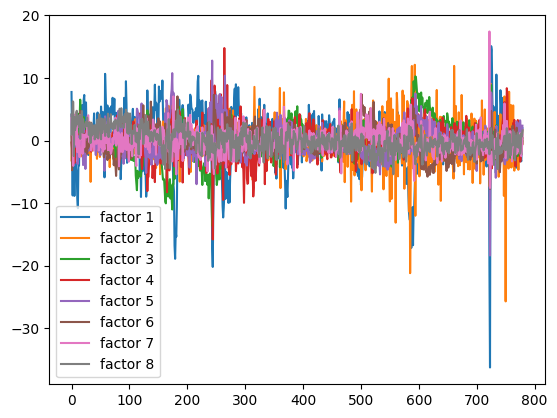

In [ ]:
# removing the first transformation row significantly improve the graphs!
import matplotlib.pyplot as plt
plt.plot(F[:,0], label='factor 1')
plt.plot(F[:,1], label='factor 2')
plt.plot(F[:,2], label='factor 3')
plt.plot(F[:,3], label='factor 4')
plt.plot(F[:,4], label='factor 5')
plt.plot(F[:,5], label='factor 6')
plt.plot(F[:,6], label='factor 7')
plt.plot(F[:,7], label='factor 8')
plt.legend();

In [ ]:
import statsmodels.api as sm

def compute_R2_values(X, factors):
  """ For each original variable (each column of X), run a regression on an increasing number of factors and store the R² value for each regression.
    Parameters:
    X       : numpy array (T x N), standardized data (each column is a series)
    factors : numpy array (T x r), estimated factor time series

  Returns:
    R2_matrix : numpy array (N x r), where each row i contains:
                [R2_i(1), R2_i(2), ..., R2_i(r)]
                with R2_i(k) = R² when series i is regressed on the first k factors.
  """
  T, N = X.shape
  r = factors.shape[1]
  R2_matrix = np.zeros((N, r))

  # Loop over each series (each variable i)
  for i in range(N):
      y = X[:, i]
      # For each increment k=1,..,r, run regression on the first k factors
      for k in range(1, r+1):
          X_k = factors[:, :k]
          X_k_const = sm.add_constant(X_k)
          model = sm.OLS(y, X_k_const).fit()
          R2_matrix[i, k-1] = model.rsquared
  return R2_matrix

def compute_incremental_R2(R2_matrix):
  """ Compute the incremental R² (mR2) for each series and then average across all series.
  For each series i, define:
    mR2_i(1) = R2_i(1)
    and for k >= 2,
    mR2_i(k) = R2_i(k) - R2_i(k-1)

  Also compute the average importance of factor-k over all series:
    mR2(k) = (1/N) * sum_{i=1}^{N} mR2_i(k)

  Parameters:
    R2_matrix : numpy array (N x r) with cumulative R² values

  Returns:
    mR2_individual: numpy array (N x r) of incremental R² for each series
    mR2_average   : numpy array (1 x r) of the average incremental R² for each factor
  """
  N, r = R2_matrix.shape
  mR2_individual = np.zeros((N, r))
  mR2_individual[:, 0] = R2_matrix[:, 0]

  for k in range(1, r):
      mR2_individual[:, k] = R2_matrix[:, k] - R2_matrix[:, k-1]

  mR2_average = np.mean(mR2_individual, axis=0)
  return mR2_individual, mR2_average

In [ ]:
# Compute the cumulative R² for each series as factors are added.
R2_matrix = compute_R2_values(X_complete, F)

# Then compute the incremental R² (mR²) for each factor for each series and the average across series.
mR2_individual, mR2_average = compute_incremental_R2(R2_matrix)

series_names = df.columns.tolist()

# Optionally, create column labels for the factors
factor_labels = [f'Factor_{i+1}' for i in range(num_factors)]

# Create a DataFrame from the mR2_individual array with the desired indices and columns
mR2_df = pd.DataFrame(mR2_individual, index=series_names, columns=factor_labels)

In [ ]:
mR2_df

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
DPCERA3M086SBEA,0.083913,0.052037,3.703373e-07,0.021802,0.031803,0.042516,0.016618,0.036138
CMRMTSPLX,0.217747,0.056842,3.276107e-03,0.012366,0.082671,0.007764,0.003534,0.005845
RETAILX,0.098443,0.010907,4.386263e-02,0.023575,0.052875,0.020481,0.024468,0.037404
INDPRO,0.643385,0.070955,7.160727e-03,0.002032,0.118841,0.054623,0.014437,0.001221
IPFPNSS,0.568503,0.064746,2.620796e-03,0.000052,0.177191,0.050702,0.021899,0.000108
...,...,...,...,...,...,...,...,...
UMCSENTX,0.000560,0.035021,6.800946e-04,0.002345,0.000005,0.129276,0.172820,0.014516
MZMSL,0.009362,0.010425,5.628536e-04,0.090363,0.004349,0.028175,0.006220,0.000357
DTCOLNVHFNM,0.001557,0.000066,7.719176e-05,0.004727,0.003538,0.001723,0.000016,0.016772
DTCTHFNM,0.000850,0.000061,1.419403e-03,0.002269,0.000012,0.003253,0.000832,0.007081


"Factor 1 explains 0.159 of the variation in
the data and can be interpreted as a real activity/employment factor since the mRi(1) associated with the industrial production and employment series are close to 0.7"

In [ ]:
mR2_df.sort_values(by='Factor_1', ascending=False).head(10)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
IPMANSICS,0.748463,0.002592,0.065046,0.005833,0.091474,0.008185,0.017509,0.000669
INDPRO,0.719906,0.008767,0.067085,0.002524,0.103738,0.008701,0.025994,0.000025
CUMFNS,0.687229,0.003479,0.111692,0.001949,0.084481,0.006725,0.015281,0.010861
IPFPNSS,0.676135,0.001972,0.055994,0.008723,0.123303,0.016692,0.035789,0.002443
USGOOD,0.657540,0.016422,0.003107,0.000909,0.008917,0.148214,0.000283,0.000043
PAYEMS,0.654908,0.010259,0.017114,0.013785,0.006569,0.113142,0.011792,0.017393
MANEMP,0.619790,0.016406,0.000160,0.001174,0.000657,0.159481,0.002225,0.001268
IPDMAT,0.596722,0.002870,0.059225,0.002393,0.051985,0.000586,0.012201,0.018912
DMANEMP,0.595716,0.017322,0.001241,0.004005,0.001332,0.150697,0.004079,0.000222
IPFINAL,0.589346,0.001876,0.060125,0.008404,0.154779,0.019414,0.050837,0.001764


In [ ]:
mR2_df.sort_values(by='Factor_2', ascending=False).head(10)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
CUSR0000SAC,0.023011,0.811150,0.002435,0.000239,0.008078,0.002470,0.007122,0.006390
CUSR0000SA0L2,0.026352,0.785391,0.003121,0.000259,0.007046,0.002423,0.007554,0.002448
DNDGRG3M086SBEA,0.018684,0.782328,0.001523,0.000319,0.013964,0.003473,0.005780,0.005509
CPIAUCSL,0.029456,0.767726,0.002070,0.000536,0.006974,0.003742,0.004044,0.001709
PCEPI,0.022912,0.725890,0.000765,0.000065,0.006756,0.007678,0.002074,0.000552
CPITRNSL,0.028429,0.724755,0.003060,0.000015,0.004739,0.001104,0.003527,0.005339
CUSR0000SA0L5,0.033310,0.715240,0.001482,0.000325,0.006588,0.006864,0.004956,0.001598
CPIULFSL,0.031473,0.696174,0.001758,0.000791,0.004066,0.001943,0.000741,0.000514
WPSFD49502,0.005947,0.514560,0.001472,0.000089,0.020198,0.003907,0.000852,0.005281
WPSFD49207,0.006024,0.491919,0.001169,0.000018,0.018754,0.003586,0.000766,0.004053


In [ ]:
mR2_df.sort_values(by='Factor_3', ascending=False).head(10)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
AAAFFM,0.000598,0.008005,0.607987,0.003835,0.192154,0.005744,0.012604,0.024647
BAAFFM,0.012386,0.004897,0.602928,0.002323,0.150169,0.016483,0.007828,0.026776
T10YFFM,0.005813,0.011804,0.572005,0.004899,0.240849,0.009776,0.013445,0.003203
T5YFFM,0.017277,0.015475,0.498027,0.004253,0.291573,0.022051,0.018811,0.000467
TB6SMFFM,0.059560,0.026404,0.366617,0.040684,0.332847,0.000009,0.010896,0.014981
TB3SMFFM,0.049437,0.021152,0.366029,0.034094,0.278605,0.002367,0.004898,0.006315
HOUST,0.259002,0.004168,0.315104,0.102721,0.151709,0.125127,0.015365,0.003091
T1YFFM,0.077809,0.027079,0.291663,0.041466,0.342204,0.012094,0.015496,0.027032
HOUSTS,0.199163,0.004691,0.253208,0.060337,0.130118,0.077759,0.005461,0.055082
PERMIT,0.236778,0.002338,0.243141,0.074226,0.197521,0.103151,0.011236,0.040064


In [ ]:
mR2_df.sort_values(by='Factor_4', ascending=False).head(10)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
GS5,0.100004,4.098409e-03,0.034534,0.604903,0.006789,0.054709,0.030873,0.000131
GS1,0.164468,3.464294e-04,0.037495,0.598601,0.011148,0.042479,0.037355,0.008544
GS10,0.062917,8.217784e-03,0.029554,0.559547,0.004976,0.059676,0.020364,0.000750
TB6MS,0.171350,1.746677e-03,0.037118,0.535104,0.012000,0.035031,0.039617,0.015609
AAA,0.039483,1.949590e-03,0.053016,0.508057,0.001553,0.032677,0.002629,0.003857
BAA,0.021720,7.305605e-06,0.100783,0.449687,0.000405,0.007492,0.012874,0.008572
CP3MX,0.169657,6.990992e-03,0.056658,0.425714,0.003344,0.012072,0.006681,0.021267
TB3MS,0.158431,1.563319e-03,0.029501,0.425047,0.014690,0.029817,0.054495,0.017307
FEDFUNDS,0.183315,8.499036e-07,0.052722,0.165106,0.000853,0.000785,0.021600,0.026561
S&P DIV YIELD,0.000049,1.047226e-02,0.067440,0.142917,0.003648,0.028514,0.460885,0.001809


In [ ]:
mR2_df.sort_values(by='Factor_5', ascending=False).head(10)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
T1YFFM,0.077809,0.027079,0.291663,0.041466,0.342204,0.012094,0.015496,0.027032
TB6SMFFM,0.059560,0.026404,0.366617,0.040684,0.332847,0.000009,0.010896,0.014981
T5YFFM,0.017277,0.015475,0.498027,0.004253,0.291573,0.022051,0.018811,0.000467
TB3SMFFM,0.049437,0.021152,0.366029,0.034094,0.278605,0.002367,0.004898,0.006315
T10YFFM,0.005813,0.011804,0.572005,0.004899,0.240849,0.009776,0.013445,0.003203
PERMIT,0.236778,0.002338,0.243141,0.074226,0.197521,0.103151,0.011236,0.040064
AAAFFM,0.000598,0.008005,0.607987,0.003835,0.192154,0.005744,0.012604,0.024647
PERMITW,0.195998,0.001781,0.236299,0.082261,0.179523,0.129472,0.014765,0.026416
HOUSTW,0.209186,0.001593,0.236803,0.091885,0.169412,0.122897,0.016423,0.018860
COMPAPFFX,0.002790,0.022313,0.173941,0.040406,0.159322,0.000700,0.034327,0.140568


In [ ]:
mR2_df.sort_values(by='Factor_6', ascending=False).head(10)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
AWHMAN,0.049056,0.013291,0.012898,3.190306e-02,0.023976,0.312388,3.190342e-05,0.058587
CES0600000007,0.068273,0.011776,0.011543,2.373377e-02,0.007438,0.304180,1.113763e-04,0.036312
UEMP15OV,0.128832,0.021260,0.004354,1.436726e-03,0.066171,0.207164,1.101751e-03,0.018599
NDMANEMP,0.355257,0.007204,0.000097,3.272181e-07,0.004794,0.167333,3.175735e-03,0.034692
UEMP27OV,0.058580,0.015410,0.020266,1.599975e-06,0.065162,0.161006,5.880192e-07,0.004895
MANEMP,0.619790,0.016406,0.000160,1.174196e-03,0.000657,0.159481,2.224947e-03,0.001268
DMANEMP,0.595716,0.017322,0.001241,4.004595e-03,0.001332,0.150697,4.078892e-03,0.000222
USGOOD,0.657540,0.016422,0.003107,9.087796e-04,0.008917,0.148214,2.833013e-04,0.000043
BUSINVX,0.065517,0.000013,0.217423,2.481006e-03,0.004561,0.146808,6.755530e-03,0.001089
PERMITW,0.195998,0.001781,0.236299,8.226123e-02,0.179523,0.129472,1.476454e-02,0.026416


In [ ]:
mR2_df.sort_values(by='Factor_7', ascending=False).head(10)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
S&P 500,0.004442,0.012427,0.047319,0.122539,0.003984,0.010839,0.532149,0.000221
S&P DIV YIELD,0.000049,0.010472,0.067440,0.142917,0.003648,0.028514,0.460885,0.001809
S&P PE RATIO,0.006160,0.006509,0.071371,0.108981,0.002614,0.069027,0.421044,0.005358
UMCSENTX,0.000167,0.000599,0.013192,0.002176,0.029847,0.016605,0.251186,0.035102
DPCERA3M086SBEA,0.139097,0.000043,0.023062,0.041032,0.000763,0.035084,0.115128,0.041224
RETAILX,0.197492,0.044154,0.005351,0.021703,0.012231,0.015731,0.110671,0.018672
ISRATIOX,0.273706,0.041591,0.084118,0.007309,0.033814,0.079852,0.073848,0.000266
CMRMTSPLX,0.310728,0.003605,0.041843,0.020117,0.023724,0.017372,0.066097,0.000396
HWIURATIO,0.203998,0.011229,0.025707,0.000270,0.039793,0.034947,0.065964,0.035253
TB3MS,0.158431,0.001563,0.029501,0.425047,0.014690,0.029817,0.054495,0.017307


In [ ]:
mR2_df.sort_values(by='Factor_8', ascending=False).head(10)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
TWEXAFEGSMTHX,0.002066,0.038174,0.005576,0.129151,0.002577,0.002733,0.003064,0.524677
EXSZUSX,0.005481,0.015870,0.002107,0.112294,0.000883,0.004203,0.009249,0.199692
PERMITS,0.106042,0.000577,0.112183,0.020712,0.124191,0.035991,0.000727,0.190091
EXUSUKX,0.000097,0.023233,0.000175,0.065073,0.003606,0.000158,0.008055,0.180858
USGOVT,0.019201,0.002524,0.051887,0.018604,0.004260,0.001271,0.000018,0.177099
COMPAPFFX,0.002790,0.022313,0.173941,0.040406,0.159322,0.000700,0.034327,0.140568
ACOGNO,0.252457,0.152115,0.008560,0.104043,0.100328,0.033860,0.019236,0.132703
EXJPUSX,0.000235,0.000452,0.013212,0.095959,0.002465,0.001407,0.005925,0.131147
SRVPRD,0.391914,0.001350,0.041319,0.029951,0.004653,0.065300,0.039453,0.074851
HOUSTNE,0.152481,0.002491,0.207042,0.101575,0.046119,0.072884,0.015026,0.072025


In [ ]:
mR2_average

array([0.15319066, 0.0693986 , 0.06486898, 0.05129792, 0.03785591,
       0.03736064, 0.02964878, 0.02605197])

In [ ]:
sum(mR2_average)

np.float64(0.46967347416674116)

Using the same transformations as the paper nearly gives us identical results, slight differences remain presumably due to NAs not being removed yet.

very close to R^2 of actually paper. The first factor explained 0.159 of the variation in the paper of the authors, by us 0.155. but our second factor is a bit off.

"Factor 2 contributes to 0.069
of the variation in the data and is dominated by forward-looking variables such as term interest rate spreads and inventories. Factor 3 has an mR2(3) of 0.066 and its explanatory power is concentrated on price variables and hence can be interpreted as an inflation factor. Factors 4 and 5 are a mix of housing and interest rate variables. Like Factor 1, Factor 6 concentrates on real/employment
variables. Factor 7 has explanatory power for stock market variables while factor 8 has explanatory power for exchange rates"

#### SKIP So, the previous code does not really give the same result, so let's just do a PCA on a balanced dataset

In [ ]:
import numpy as np
import pandas as pd
from numpy.linalg import svd

def pca_on_balanced_panel(df, num_factors=3):
    """
    Extracts the balanced panel (columns with no missing values) from df,
    standardizes the data, and performs PCA via SVD to extract factors and loadings.

    Parameters:
      df          : pandas DataFrame with shape (T, N) where each column is a variable.
      num_factors : integer specifying the number of factors to extract.

    Returns:
      factors     : numpy array of shape (T, num_factors) containing the factor estimates.
      loadings    : numpy array of shape (N_balanced, num_factors) containing the loading estimates.
      balanced_cols : list of column names representing the balanced panel.
    """
    # Identify the columns (series) with no missing observations.
    balanced_cols = [col for col in df.columns if df[col].notnull().all()]
    if len(balanced_cols) == 0:
        raise ValueError("No fully observed (balanced) columns were found in the dataset.")

    # Create a subset with the balanced panel.
    df_balanced = df[balanced_cols]

    # Standardize the data: for each variable subtract the mean and divide by standard deviation.
    df_balanced_std = (df_balanced - df_balanced.mean()) / df_balanced.std()

    # Convert the standardized data to a numpy array.
    # Note: rows = time observations, columns = balanced series.
    X = df_balanced_std.values  # shape: (T, N_balanced)

    # Run SVD to perform PCA.
    # X = U * s * Vt, where the columns of U are the left singular vectors.
    U, s, Vt = svd(X, full_matrices=False)

    # Compute the factor estimates as the first num_factors principal components.
    # Multiply U by the singular values s (for the selected factors) to obtain the factor scores.
    factors = U[:, :num_factors] * s[:num_factors]

    # The loadings are given by the rows of Vt.T corresponding to the first num_factors.
    loadings = Vt[:num_factors, :].T  # shape: (N_balanced, num_factors)

    return factors, loadings, balanced_cols


In [ ]:
num_factors = 8  # Example: extracting three factors.
factors, loadings, balanced_cols = pca_on_balanced_panel(df, num_factors)

print("Shape of factor estimates (T x num_factors):", factors.shape)
print("Shape of loading estimates (N_balanced x num_factors):", loadings.shape)

Shape of factor estimates (T x num_factors): (648, 3)
Shape of loading estimates (N_balanced x num_factors): (3, 3)


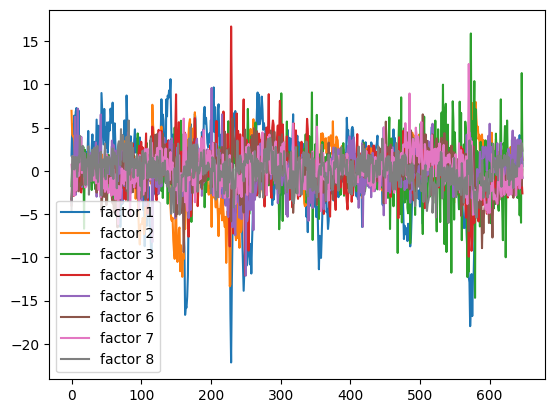

In [ ]:
plt.plot(F[:,0], label='factor 1')
plt.plot(F[:,1], label='factor 2')
plt.plot(F[:,2], label='factor 3')
plt.plot(F[:,3], label='factor 4')
plt.plot(F[:,4], label='factor 5')
plt.plot(F[:,5], label='factor 6')
plt.plot(F[:,6], label='factor 7')
plt.plot(F[:,7], label='factor 8')
plt.legend();

In [ ]:
balanced_cols = [col for col in df.columns if df[col].notnull().all()]
if len(balanced_cols) == 0:
    raise ValueError("No fully observed (balanced) columns were found in the dataset.")

# Create a subset with the balanced panel.
df_balanced = df[balanced_cols]

In [ ]:
# Compute the cumulative R² for each series as factors are added.
R2_matrix = compute_R2_values(df_balanced.to_numpy(), factors)

# Then compute the incremental R² (mR²) for each factor for each series and the average across series.
mR2_individual, mR2_average = compute_incremental_R2(R2_matrix)

series_names = df_balanced.columns.tolist()

# Optionally, create column labels for the factors
factor_labels = [f'Factor_{i+1}' for i in range(num_factors)]

# Create a DataFrame from the mR2_individual array with the desired indices and columns
mR2_df = pd.DataFrame(mR2_individual, index=series_names, columns=factor_labels)

print(mR2_average)

ValueError: Shape of passed values is (3, 3), indices imply (3, 8)

It did not change a lot... idk what is the problem then

From the descriptive paper: Factor 1 explains 0.159 of the variation in
the data and can be interpreted as a real activity/employment factor since the mRi(1) associated
with the industrial production and employment series are close to 0.7. Factor 2 contributes to 0.069
of the variation in the data and is dominated by forward-looking variables such as term interest rate
spreads and inventories. Factor 3 has an mR2
(3) of 0.066 and its explanatory power is concentrated
on price variables and hence can be interpreted as an inflation factor. Factors 4 and 5 are a mix
of housing and interest rate variables. Like Factor 1, Factor 6 concentrates on real/employment
variables. Factor 7 has explanatory power for stock market variables while factor 8 has explanatory
power for exchange rates.

# SKIP Regressions with above factors

# Regression with S&P 500 data?

We follow Ludvigson and Ng (2007) and aim to forecast excess returns and volatility, in this case for the S&P 500. Using the previously estimated factors

In [ ]:
# Checking Data availability of tickers:
# pip install yfinance pandas
import yfinance as yf
import pandas as pd
import numpy as np
import time

# 1) Define the tickers
SPX_TICKER  = "^GSPC"   # S&P 500 index
TBILL_TICKER = "^IRX"   # CBOE 13‑Week T‑Bill (^IRX gives the annualized % yield)
WMT_TICKER = "WMT"

tickers = [SPX_TICKER, TBILL_TICKER, WMT_TICKER]

print("Maximum price data history is:\n")
for ticker in tickers:
    price_history = yf.Ticker(ticker).history(period='max')
    print(f"{ticker} max price: {price_history['Close'].max()}")
    print("\nMinimum price data history is:\n")
    print(f"{ticker}: {price_history.index.min}")
    time.sleep(1)

In [ ]:
# 2) Download history
#    Adjust start/end as needed
data = yf.download(
    [SPX_TICKER, TBILL_TICKER, WMT_TICKER],
    start="1973-01-01",
    end="2025-03-31",
    progress=False
)

# 3) Keep only the Adj Close columns
df_stocks = data["Close"].rename(columns={
    SPX_TICKER: "SPX_Close",
    WMT_TICKER: "WMT_Close",
    TBILL_TICKER: "Tbill_Yield"
})

# 4) Convert T‑bill from % to daily log‐yield
#    IRX is quoted as a percent annual rate, so:
df_stocks["Tbill_Yield"] = df_stocks["Tbill_Yield"] / 100            # → decimal annual rate
df_stocks["rf_daily"]    = np.log1p(df_stocks["Tbill_Yield"] / 252)   # assume 252 trading days

# 5) Compute daily SPX log‐return and excess‐return
df_stocks["spx_ret"]     = np.log(df_stocks["SPX_Close"]).diff()
df_stocks["spx_exret"]   = df_stocks["spx_ret"] - df_stocks["rf_daily"]
# same fore walmart WMT
df_stocks["wmt_ret"]     = np.log(df_stocks["WMT_Close"]).diff()
df_stocks["wmt_exret"]   = df_stocks["wmt_ret"] - df_stocks["rf_daily"]

# 6) Long Sample mean of daily excess return
Rbar = df_stocks["spx_exret"].mean()
Rbar_WMT = df_stocks["wmt_exret"].mean()

# 7) Squared Deviations will be the variance
df_stocks["sq_dev"] = (df_stocks["spx_exret"] - Rbar)**2
df_stocks["sq_dev_WMT"]= (df_stocks["wmt_exret"] - Rbar_WMT)**2

# 8) We aggregate to Monthly volatility from daily
# Sum daily numbers, then take the square-root
monthly_vol = (
    df_stocks["sq_dev"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)    # √[ Σ (…) ]
      .rename("VOL")
)
monthly_vol_wmt = (
    df_stocks["sq_dev_WMT"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)    # √[ Σ (…) ]
      .rename("VOL")
)

# 9) Monthly Panel
monthly = pd.DataFrame({
    "SPX_exret": df_stocks["spx_exret"].resample("ME").sum(),
    "WMT_exret": df_stocks["wmt_exret"].resample("ME").sum(),
    "Tbill_Yield": df_stocks["Tbill_Yield"].resample("ME").mean(),
    "VOL": monthly_vol,
    "VOL_WMT": monthly_vol_wmt
})

# remove day from date
monthly.index = monthly.index.to_period('M')
monthly

Analysing APPL - only run the one above or this one below, not both as they overwrite each other

In [ ]:
# 2) Download history
#    Adjust start/end as needed
data = yf.download(
    [TBILL_TICKER, "AAPL"],
    start="1981-01-01",
    end="2025-03-31",
    progress=False
)

# 3) Keep only the Adj Close columns
df_stocks = data["Close"].rename(columns={
    "AAPL": "AAPL_Close",
    TBILL_TICKER: "Tbill_Yield"
})

# 4) Convert T‑bill from % to daily log‐yield
#    IRX is quoted as a percent annual rate, so:
df_stocks["Tbill_Yield"] = df_stocks["Tbill_Yield"] / 100            # → decimal annual rate
df_stocks["rf_daily"]    = np.log1p(df_stocks["Tbill_Yield"] / 252)   # assume 252 trading days

# 5) Compute daily SPX log‐return and excess‐return
# same fore walmart WMT
df_stocks["aapl_ret"]     = np.log(df_stocks["AAPL_Close"]).diff()
df_stocks["aapl_exret"]   = df_stocks["aapl_ret"] - df_stocks["rf_daily"]

# 6) Long Sample mean of daily excess return
Rbar_aapl = df_stocks["aapl_exret"].mean()

# 7) Squared Deviations will be the variance
df_stocks["sq_dev_aapl"]= (df_stocks["aapl_exret"] - Rbar_aapl)**2

# 8) We aggregate to Monthly volatility from daily
# Sum daily numbers, then take the square-root
monthly_vol_aapl = (
    df_stocks["sq_dev_aapl"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)    # √[ Σ (…) ]
      .rename("VOL")
)

# 9) Monthly Panel
monthly = pd.DataFrame({
    "AAPL_exret": df_stocks["aapl_exret"].resample("ME").sum(),
    "Tbill_Yield": df_stocks["Tbill_Yield"].resample("ME").mean(),
    "VOL_AAPL": monthly_vol_aapl
})

# remove day from date
monthly.index = monthly.index.to_period('M')
monthly

we merge our dataframes

In [ ]:
factors_df = pd.DataFrame(F, columns=[f"Factor_{i+1}" for i in range(8)])
factors_df.index = df.index
factors_df.index = factors_df.index.to_period('M')
factors_df

In [ ]:
# Concatenate the factors DataFrame with the original DataFrame
# Reset the index of the original DataFrame to align with the factors
# df_merged = pd.concat([monthly, factors_df], axis=1)
# df_merged = df_merged.dropna(subset=['Factor_1', 'SPX_exret'])
# df_merged

## OLD SKIP to SOLUTION: Simple Regression

## 1 step ahead forecast
- To Do: do not only compare to AR(1) & factor with 1 lag, test more lags and different specifications
- In Ludvigson & Ng (2007):

**Overall** - taking monthly data, we see worse performance of the factor model compared to just a simple AR(1). In ludvigson and Ng (2007) quarterly data is used with quarterly forecasting, perhaps doing that would also show better factor model performance?

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

def forecast_analysis(df_merged, ret_var, vol_var, factor_cols, h):
    # 1) Prepare leads and lags
    df = df_merged.copy()
    df["ret_lead"] = df[ret_var].shift(-h)
    df["vol_lead"] = df[vol_var].shift(-h)
    df["ret_t"]   = df[ret_var]
    df["vol_t"]   = df[vol_var]

    # 2) Drop missing
    df_ret = df[["ret_lead","ret_t"] + factor_cols].dropna()
    df_vol = df[["vol_lead","vol_t","Factor_1"]].dropna()

    # 3) Train/Test split (80/20)
    n_ret = len(df_ret)
    n_vol = len(df_vol)
    split_ret = int(0.8 * n_ret)
    split_vol = int(0.8 * n_vol)

    train_ret = df_ret.iloc[:split_ret]
    test_ret  = df_ret.iloc[split_ret:]
    train_vol = df_vol.iloc[:split_vol]
    test_vol  = df_vol.iloc[split_vol:]

    # 4) RETURN FORECASTS

    # 4a) Factor‐Augmented Model: ret_lead ~ const + ret_t + Factor_1…Factor_8
    X_tr_fac    = sm.add_constant(train_ret[["ret_t"] + factor_cols])
    X_te_fac    = sm.add_constant(test_ret[["ret_t"] + factor_cols])
    y_tr_ret    = train_ret["ret_lead"]
    y_te_ret    = test_ret["ret_lead"]
    fac_mod     = sm.OLS(y_tr_ret, X_tr_fac).fit()
    y_hat_fac   = fac_mod.predict(X_te_fac)
    resid_fac   = y_te_ret - y_hat_fac
    rmse_fac    = np.sqrt((resid_fac**2).mean())
    llf_fac     = fac_mod.llf

    # 4b) AR(1) Benchmark: ret_lead ~ const + ret_t
    X_tr_ar1  = sm.add_constant(train_ret[["ret_t"]])
    X_te_ar1  = sm.add_constant(test_ret[["ret_t"]])
    ar1_mod   = sm.OLS(y_tr_ret, X_tr_ar1).fit()
    y_hat_ar1 = ar1_mod.predict(X_te_ar1)
    resid_ar1 = y_te_ret - y_hat_ar1
    rmse_ar1  = np.sqrt((resid_ar1**2).mean())
    llf_ar1   = ar1_mod.llf

    # Print diagnostics
    print(f"Return Factor Model: RMSE={rmse_fac:.4f}, Log‐Lik={llf_fac:.2f}")
    print(f"Return AR(1) Model:   RMSE={rmse_ar1:.4f}, Log‐Lik={llf_ar1:.2f}")

    # 5) VOLATILITY FORECASTS

    # 5a) Factor‐Augmented Model: vol_lead ~ const + vol_t + Factor_1
    Xv_tr_fac  = sm.add_constant(train_vol[["vol_t","Factor_1"]])
    Xv_te_fac  = sm.add_constant(test_vol[["vol_t","Factor_1"]])
    yv_tr      = train_vol["vol_lead"]
    yv_te      = test_vol["vol_lead"]
    vfac_mod   = sm.OLS(yv_tr, Xv_tr_fac).fit()
    y_hat_vf   = vfac_mod.predict(Xv_te_fac)
    resid_vf   = yv_te - y_hat_vf
    rmse_vf    = np.sqrt((resid_vf**2).mean())
    llf_vf     = vfac_mod.llf

    # 5b) AR(1) Benchmark: vol_lead ~ const + vol_t
    Xv_tr_ar1  = sm.add_constant(train_vol[["vol_t"]])
    Xv_te_ar1  = sm.add_constant(test_vol[["vol_t"]])
    var1_mod   = sm.OLS(yv_tr, Xv_tr_ar1).fit()
    y_hat_v1   = var1_mod.predict(Xv_te_ar1)
    resid_v1   = yv_te - y_hat_v1
    rmse_v1    = np.sqrt((resid_v1**2).mean())
    llf_v1     = var1_mod.llf

    print(f"Volatility Factor Model: RMSE={rmse_vf:.4f}, Log‐Lik={llf_vf:.2f}")
    print(f"Volatility AR(1) Model:   RMSE={rmse_v1:.4f}, Log‐Lik={llf_v1:.2f}")

    # 6) PLOTS

    # Return residuals
    plt.figure()
    plt.plot(resid_fac.index.to_timestamp(), resid_fac)
    plt.title("Return Residuals — Factor Model")
    plt.xlabel("Date"); plt.ylabel("Residual")
    plt.show()

    # Return forecasts vs actual
    plt.figure()
    plt.plot(y_te_ret.index.to_timestamp(), y_te_ret,    "o-", label="Actual")
    plt.plot(y_te_ret.index.to_timestamp(), y_hat_fac,   "x--", label="Factor")
    plt.plot(y_te_ret.index.to_timestamp(), y_hat_ar1,  "^--", label="AR(1)")
    plt.title(f"{h}‑Step Return Forecast vs Actual")
    plt.xlabel("Date"); plt.ylabel("Excess Return"); plt.legend()
    plt.show()

    # Volatility residuals
    plt.figure()
    plt.plot(resid_vf.index.to_timestamp(), resid_vf)
    plt.title("Volatility Residuals — Factor Model")
    plt.xlabel("Date"); plt.ylabel("Residual")
    plt.show()

    # Volatility forecasts vs actual
    plt.figure()
    plt.plot(yv_te.index.to_timestamp(), yv_te,    "o-", label="Actual")
    plt.plot(yv_te.index.to_timestamp(), y_hat_vf, "x--", label="Factor")
    plt.plot(yv_te.index.to_timestamp(), y_hat_v1, "^--", label="AR(1)")
    plt.title(f"{h}‑Step Volatility Forecast vs Actual")
    plt.xlabel("Date"); plt.ylabel("Realized Volatility"); plt.legend()
    plt.show()

    # 7) Risk‑Return Regression (Eq. 7 from Ludvigson & Ng)

    # Align predictions
    m_hat = y_hat_fac
    s_hat = y_hat_vf
    idx   = m_hat.index.intersection(s_hat.index)
    m_hat = pd.Series(m_hat.values, index=y_te_ret.index).loc[idx]
    s_hat = pd.Series(s_hat.values, index=yv_te.index).loc[idx]

    rr_df = pd.DataFrame({
        "m_hat":     m_hat,
        "m_hat_lag": m_hat.shift(1),
        "s_hat":     s_hat,
        "s_hat_lag": s_hat.shift(1)
    }).dropna()

    X_rr = sm.add_constant(rr_df[["s_hat","s_hat_lag","m_hat_lag"]])
    y_rr = rr_df["m_hat"]
    rr_mod = sm.OLS(y_rr, X_rr).fit() # fit
    hac_res = rr_mod.get_robustcov_results(cov_type='HAC', maxlags=12) #HAC errors
    # print("\nRisk‐Return Regression (h=1) Summary:\n")
    # print(rr_mod.summary())
    print("\nHAC Errors:\n")
    print(hac_res.summary())

In [ ]:
# 1-Step Ahead Forecast, AR(1) & Factor Models
h = 1
factor_cols = [f"Factor_{i}" for i in range(1,9)]
forecast_analysis(df_merged, "SPX_exret", "VOL", factor_cols, h)

Repeat for Walmart

In [ ]:
# 1-Step Ahead Forecast, AR(1) & Factor Models
forecast_analysis(df_merged, "WMT_exret", "VOL_WMT", factor_cols, h=1)

AAPL - but the factor model still performs worse than AR

In [ ]:
forecast_analysis(df_merged, "AAPL_exret", "VOL_AAPL", factor_cols, h=1)

## We try normalising the factors

Using Pre processing from sklean

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

def forecast_analysis_standardise(df_merged, ret_var, vol_var, factor_cols, h):
    # 1) Prepare leads and lags
    df = df_merged.copy()
    df["ret_lead"] = df[ret_var].shift(-(h-1))
    df["vol_lead"] = df[vol_var].shift(-(h-1))
    df["ret_t"]   = df[ret_var].shift(1)
    df["vol_t"]   = df[vol_var].shift(1)

    # 2) Drop missing
    df_ret = df[["ret_lead","ret_t"] + factor_cols].dropna()
    df_vol = df[["vol_lead","vol_t"] + factor_cols].dropna()

    # 3) Train/Test split (80/20)
    split_ret = int(0.8 * len(df_ret))
    split_vol = int(0.8 * len(df_vol))

    train_ret = df_ret.iloc[:split_ret].copy()
    test_ret  = df_ret.iloc[split_ret:].copy()
    train_vol = df_vol.iloc[:split_vol].copy()
    test_vol  = df_vol.iloc[split_vol:].copy()

    # 3.1) PREPROCESSING: Standardize X and y
    scaler_X_ret = StandardScaler()
    scaler_y_ret = StandardScaler()
    scaler_X_vol = StandardScaler()
    scaler_y_vol = StandardScaler()

    X_ret_train = train_ret[["ret_t"] + factor_cols]
    X_ret_test  = test_ret[["ret_t"] + factor_cols]
    X_vol_train = train_vol[["vol_t"] + factor_cols]
    X_vol_test  = test_vol[["vol_t"] + factor_cols]

    X_ret_tr_s = pd.DataFrame(
        scaler_X_ret.fit_transform(X_ret_train),
        index=X_ret_train.index,
        columns=X_ret_train.columns)
    X_ret_te_s = pd.DataFrame(
        scaler_X_ret.transform(X_ret_test),
        index=X_ret_test.index,
        columns=X_ret_test.columns)

    X_vol_tr_s = pd.DataFrame(
        scaler_X_vol.fit_transform(X_vol_train),
        index=X_vol_train.index,
        columns=X_vol_train.columns)
    X_vol_te_s = pd.DataFrame(
        scaler_X_vol.transform(X_vol_test),
        index=X_vol_test.index,
        columns=X_vol_test.columns)

    y_ret_tr_s = scaler_y_ret.fit_transform(train_ret[["ret_lead"]]).ravel()
    y_ret_te_s = scaler_y_ret.transform(test_ret[["ret_lead"]]).ravel()
    y_vol_tr_s = scaler_y_vol.fit_transform(train_vol[["vol_lead"]]).ravel()
    y_vol_te_s = scaler_y_vol.transform(test_vol[["vol_lead"]]).ravel()

    # 4) RETURN FORECASTS

    # 4a) Factor Model
    X_tr_fac    = sm.add_constant(X_ret_tr_s)
    X_te_fac    = sm.add_constant(X_ret_te_s)
    fac_mod     = sm.OLS(y_ret_tr_s, X_tr_fac).fit()
    y_hat_fac_s = fac_mod.predict(X_te_fac)
    y_hat_fac   = scaler_y_ret.inverse_transform(
                      y_hat_fac_s.to_numpy().reshape(-1,1)
                  ).ravel()
    resid_fac   = test_ret["ret_lead"] - y_hat_fac
    rmse_fac    = np.sqrt((resid_fac**2).mean())
    llf_fac     = fac_mod.llf

    # 4b) AR(1) Benchmark
    X_tr_ar1    = sm.add_constant(X_ret_tr_s[["ret_t"]])
    X_te_ar1    = sm.add_constant(X_ret_te_s[["ret_t"]])
    ar1_mod     = sm.OLS(y_ret_tr_s, X_tr_ar1).fit()
    y_hat_ar1_s = ar1_mod.predict(X_te_ar1)
    y_hat_ar1   = scaler_y_ret.inverse_transform(
                      y_hat_ar1_s.to_numpy().reshape(-1,1)
                  ).ravel()
    resid_ar1   = test_ret["ret_lead"] - y_hat_ar1
    rmse_ar1    = np.sqrt((resid_ar1**2).mean())
    llf_ar1     = ar1_mod.llf

    print(f"Return Factor Model: RMSE={rmse_fac:.4f}, Log-Lik={llf_fac:.2f}")
    print(f"Return AR(1) Model:   RMSE={rmse_ar1:.4f}, Log-Lik={llf_ar1:.2f}")

    # 5) VOLATILITY FORECASTS

    # 5a) Factor Model
    Xv_tr_fac  = sm.add_constant(X_vol_tr_s)
    Xv_te_fac  = sm.add_constant(X_vol_te_s)
    vfac_mod   = sm.OLS(y_vol_tr_s, Xv_tr_fac).fit()
    y_hat_vf_s = vfac_mod.predict(Xv_te_fac)
    y_hat_vf   = scaler_y_vol.inverse_transform(
                      y_hat_vf_s.to_numpy().reshape(-1,1)
                  ).ravel()
    resid_vf   = test_vol["vol_lead"] - y_hat_vf
    rmse_vf    = np.sqrt((resid_vf**2).mean())
    llf_vf     = vfac_mod.llf

    # 5b) AR(1) Benchmark
    Xv_tr_ar1  = sm.add_constant(X_vol_tr_s[["vol_t"]])
    Xv_te_ar1  = sm.add_constant(X_vol_te_s[["vol_t"]])
    var1_mod   = sm.OLS(y_vol_tr_s, Xv_tr_ar1).fit()
    y_hat_v1_s = var1_mod.predict(Xv_te_ar1)
    y_hat_v1   = scaler_y_vol.inverse_transform(
                      y_hat_v1_s.to_numpy().reshape(-1,1)
                  ).ravel()
    resid_v1   = test_vol["vol_lead"] - y_hat_v1
    rmse_v1    = np.sqrt((resid_v1**2).mean())
    llf_v1     = var1_mod.llf

    print(f"Vol Factor Model: RMSE={rmse_vf:.4f}, Log-Lik={llf_vf:.2f}")
    print(f"Vol AR(1) Model:   RMSE={rmse_v1:.4f}, Log-Lik={llf_v1:.2f}")

    # ... (plots and Risk-Return section unchanged) ...
    # 6) PLOTS (unchanged; showing residuals & forecasts in original scale)
    plt.figure()
    plt.plot(resid_fac.index.to_timestamp(), resid_fac, label="Residual")
    plt.title("Return Residuals — Factor Model")
    plt.xlabel("Date"); plt.ylabel("Residual")
    plt.show()

    plt.figure()
    plt.plot(test_ret.index.to_timestamp(), test_ret["ret_lead"],    "o-", label="Actual")
    plt.plot(test_ret.index.to_timestamp(), y_hat_fac,   "x--", label="Factor")
    plt.plot(test_ret.index.to_timestamp(), y_hat_ar1,  "^--", label="AR(1)")
    plt.title(f"{h}-Step Return Forecast vs Actual")
    plt.xlabel("Date"); plt.ylabel("Excess Return"); plt.legend()
    plt.show()

    plt.figure()
    plt.plot(resid_vf.index.to_timestamp(), resid_vf, label="Residual")
    plt.title("Volatility Residuals — Factor Model")
    plt.xlabel("Date"); plt.ylabel("Residual")
    plt.show()

    plt.figure()
    plt.plot(test_vol.index.to_timestamp(), test_vol["vol_lead"],    "o-", label="Actual")
    plt.plot(test_vol.index.to_timestamp(), y_hat_vf, "x--", label="Factor")
    plt.plot(test_vol.index.to_timestamp(), y_hat_v1, "^--", label="AR(1)")
    plt.title(f"{h}-Step Volatility Forecast vs Actual")
    plt.xlabel("Date"); plt.ylabel("Realized Volatility"); plt.legend()
    plt.show()

    # 7) Risk-Return Regression (Eq. 7 from Ludvigson & Ng) — remains unchanged
    m_hat = pd.Series(y_hat_fac, index=test_ret.index)
    s_hat = pd.Series(y_hat_vf,  index=test_vol.index)
    idx   = m_hat.index.intersection(s_hat.index)
    rr_df = pd.DataFrame({
        "m_hat":     m_hat.loc[idx],
        "m_hat_lag": m_hat.loc[idx].shift(1),
        "s_hat":     s_hat.loc[idx],
        "s_hat_lag": s_hat.loc[idx].shift(1)
    }).dropna()

    X_rr  = sm.add_constant(rr_df[["s_hat","s_hat_lag","m_hat_lag"]])
    y_rr  = rr_df["m_hat"]
    rr_mod = sm.OLS(y_rr, X_rr).fit()
    hac_res = rr_mod.get_robustcov_results(cov_type='HAC', maxlags=12)
    print("\nHAC Errors:\n")
    print(hac_res.summary())

In [ ]:
factor_cols = df_merged.columns[5:].to_list()
forecast_analysis_standardise(df_merged, "SPX_exret", "VOL", factor_cols, h=1)

## TO-DO: SOLUTION! We predict the factor at t+1 to then use it to predict our y at t+1

As in Ludvigson and Ng (2007) we use an AR(1) to predict our factors. Below code should be corrected to be running.

In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error

# assume factors_df is your original DataFrame, indexed by a DatetimeIndex

# 1) TRAIN/TEST SPLIT (80/20 by time)
n = len(factors_df)
n_train = int(n * 0.8)
train_df = factors_df.iloc[:n_train]
test_df  = factors_df.iloc[n_train:]

# containers
rmse_dict = {}
models    = {}

# 2) FIT AR(1), FORECAST TEST, COMPUTE RMSE
for col in factors_df.columns:
    # fit on train
    y_train = train_df[col].dropna()
    model   = AutoReg(y_train, lags=1, old_names=False).fit()
    models[col] = model   # save for later

    # build one-step predictions on test:
    #  pred_t = intercept + phi * y_(t-1)
    # use the full series shifted by 1
    full = pd.concat([y_train, test_df[col]])
    preds = model.params['const'] + model.params[col + '.L1'] * full.shift(1)
    preds = preds.loc[test_df.index]

    # compute RMSE
    rmse = np.sqrt(mean_squared_error(test_df[col], preds))
    rmse_dict[col] = rmse

    coef_dict = {}
    for col, model in models.items():
        params = model.params
        coef_dict[col] = {
          'intercept': params['const'],
          'phi':        params[f'{col}.L1']
        }

coef_df = pd.DataFrame.from_dict(coef_dict, orient='index')
print("\nAR(1) Coefficients for each factor:\n")
print(coef_df)

# show test RMSEs
rmse_df = pd.Series(rmse_dict, name='AR1_test_RMSE')
print(rmse_df)

# 3) ONE-STEP FORECASTS FROM 1980-01 ONWARD USING TRAINED MODELS
start = '1980-01'
slice_df = factors_df.loc[start:]

forecast_df = pd.DataFrame(index=slice_df.index, columns=slice_df.columns)

for col, model in models.items():
    params = model.params
    phi    = params[col + '.L1']
    c      = params['const']

    # forecast[t] = c + phi * actual[t-1]
    forecast_df[col] = c + phi * slice_df[col].shift(1)

# 4) UNIFIED DATAFRAME
#    join the original factors and their forecasts side by side
#    suffix forecasts with '_AR1'
forecast_df = forecast_df.add_suffix('_AR1')
unified_df  = pd.concat([slice_df, forecast_df], axis=1)

unified_df

ToDo: Let's compare the AR(1) coefficients of our factors to the one's of ludvigson and Ng (2007). Overall due to the different time frame, we get quite different results.

1 step ahead predictions:
We first merge DataFrames, then define our function and run the regression

In [ ]:
monthly

In [ ]:
# Concatenate the factors DataFrame with the original DataFrame
# Reset the index of the original DataFrame to align with the factors
df_merged = pd.concat([monthly, unified_df], axis=1)
df_merged = df_merged.dropna(subset=['Factor_1', 'SPX_exret'])
df_merged

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

def forecast_analysis(df_merged, ret_var, vol_var, factor_cols_pred, h=1):
    df = df_merged.copy()

    # 1) Prepare leads and lags for Y
    df["ret_lead"] = df[ret_var].shift(-h)
    df["vol_lead"] = df[vol_var].shift(-h)
    df["ret_t"]   = df[ret_var]
    df["vol_t"]   = df[vol_var]

    # 2) Drop missing
    df_ret = df[["ret_lead","ret_t"] + factor_cols_pred].dropna()
    df_vol = df[["vol_lead","vol_t"] + factor_cols_pred].dropna()

    # 3) Train/Test split (80/20)
    split_ret = int(0.8 * len(df_ret))
    split_vol = int(0.8 * len(df_vol))

    train_ret = df_ret.iloc[:split_ret]
    test_ret  = df_ret.iloc[split_ret:]
    train_vol = df_vol.iloc[:split_vol]
    test_vol  = df_vol.iloc[split_vol:]

    # 4a) Return: Factor-Augmented
    X_tr_fac = sm.add_constant(train_ret[["ret_t"] + factor_cols_pred])
    X_te_fac = sm.add_constant(test_ret[["ret_t"] + factor_cols_pred])
    y_tr_ret = train_ret["ret_lead"]
    y_te_ret = test_ret["ret_lead"]

    fac_mod   = sm.OLS(y_tr_ret, X_tr_fac).fit()
    y_hat_fac = fac_mod.predict(X_te_fac)
    rmse_fac  = np.sqrt(((y_te_ret - y_hat_fac)**2).mean())
    print(f"Return Factor Model: RMSE={rmse_fac:.4f}")

    # 4b) Return: AR(1) benchmark
    X_tr_ar1  = sm.add_constant(train_ret[["ret_t"]])
    X_te_ar1  = sm.add_constant(test_ret[["ret_t"]])
    ar1_mod   = sm.OLS(y_tr_ret, X_tr_ar1).fit()
    y_hat_ar1 = ar1_mod.predict(X_te_ar1)
    rmse_ar1  = np.sqrt(((y_te_ret - y_hat_ar1)**2).mean())
    print(f"Return AR(1) Model:   RMSE={rmse_ar1:.4f}")

    # 5a) Volatility: Factor-Augmented
    Xv_tr_fac = sm.add_constant(train_vol[["vol_t"] + factor_cols_pred])
    Xv_te_fac = sm.add_constant(test_vol[["vol_t"] + factor_cols_pred])
    yv_tr     = train_vol["vol_lead"]
    yv_te     = test_vol["vol_lead"]

    vfac_mod  = sm.OLS(yv_tr, Xv_tr_fac).fit()
    y_hat_vf  = vfac_mod.predict(Xv_te_fac)
    rmse_vf   = np.sqrt(((yv_te - y_hat_vf)**2).mean())
    print(f"Volatility Factor Model: RMSE={rmse_vf:.4f}")

    # 5b) Volatility: AR(1) benchmark
    Xv_tr_ar1 = sm.add_constant(train_vol[["vol_t"]])
    Xv_te_ar1 = sm.add_constant(test_vol[["vol_t"]])
    var1_mod  = sm.OLS(yv_tr, Xv_tr_ar1).fit()
    y_hat_v1  = var1_mod.predict(Xv_te_ar1)
    rmse_v1   = np.sqrt(((yv_te - y_hat_v1)**2).mean())
    print(f"Volatility AR(1) Model:   RMSE={rmse_v1:.4f}")

    # 6) (Optional) Plotting as before...
    #    e.g. plt.plot(test_ret.index, y_te_ret, ...)
    #    -- same code, just replace factor series with your predictions --

    # 7) Risk-Return regression (Eq. 7):
    m_hat = pd.Series(y_hat_fac.values, index=y_te_ret.index)
    s_hat = pd.Series(y_hat_vf.values,  index=yv_te.index)
    rr_df = pd.DataFrame({
        "m_hat":     m_hat,
        "m_hat_lag": m_hat.shift(1),
        "s_hat":     s_hat,
        "s_hat_lag": s_hat.shift(1)
    }).dropna()

    X_rr = sm.add_constant(rr_df[["s_hat","s_hat_lag","m_hat_lag"]])
    y_rr = rr_df["m_hat"]
    rr_mod = sm.OLS(y_rr, X_rr).fit(cov_type='HAC', cov_kwds={'maxlags':12})
    print("\nRisk-Return HAC-corrected summary:\n")
    print(rr_mod.summary())

Adjust the `ret_var` and `vol_var` accordingly to the variables we want to forecast

In [ ]:
# 1) Define your predicted‐factor column list:
factor_pred_cols = [f"Factor_{i}_AR1" for i in range(1,9)]

# 2) Call the analysis:
forecast_analysis(
    df_merged=df_merged,
    ret_var="SPX_exret",
    vol_var="VOL",
    factor_cols_pred=factor_pred_cols,
    h=1
)

3-step ahead forecast

In [ ]:
# 2) Call the analysis:
forecast_analysis(
    df_merged=df_merged,
    ret_var="SPX_exret",
    vol_var="VOL",
    factor_cols_pred=factor_pred_cols,
    h=3
)

In [ ]:
# 2) Call the analysis:
forecast_analysis(
    df_merged=df_merged,
    ret_var="SPX_exret",
    vol_var="VOL",
    factor_cols_pred=factor_pred_cols,
    h=6
)

In [ ]:
# 2) Call the analysis:
forecast_analysis(
    df_merged=df_merged,
    ret_var="SPX_exret",
    vol_var="VOL",
    factor_cols_pred=factor_pred_cols,
    h=9
)

In [ ]:
# 2) Call the analysis:
forecast_analysis(
    df_merged=df_merged,
    ret_var="SPX_exret",
    vol_var="VOL",
    factor_cols_pred=factor_pred_cols,
    h=12
)

## OLD:Extension (WIP)

### 3 step ahead forecast

In [ ]:
forecast_analysis(df_merged, "SPX_exret", "VOL", factor_cols, h=3)
forecast_analysis(df_merged, "WMT_exret", "VOL_WMT", factor_cols, h=3)

### 6 step ahead forecast

In [ ]:
forecast_analysis(df_merged, "SPX_exret", "VOL", factor_cols, h=6)
forecast_analysis(df_merged, "WMT_exret", "VOL_WMT", factor_cols, h=6)

### 12-step ahead forecast

In [ ]:
forecast_analysis(df_merged, "SPX_exret", "VOL", factor_cols, h=12)
forecast_analysis(df_merged, "WMT_exret", "VOL_WMT", factor_cols, h=12)

### WIP

In [ ]:
import statsmodels.api as sm

# --- PARAMETERS ---
horizons    = [1, 6, 12]               # months ahead
factor_cols = [f"Factor_{i}" for i in range(1,9)]
max_lags    = 12

# results storage
results = []

for h in horizons:
    df = df_merged.copy()
    # 1) Create h‑month leads
    df["ret_lead"] = df["SPX_exret"].shift(-h)
    df["vol_lead"] = df["VOL"].shift(-h)
    # 2) Make up to max_lags of lags for y_t
    for i in range(max_lags):
        df[f"ret_lag_{i}"] = df["SPX_exret"].shift(i)
        df[f"vol_lag_{i}"] = df["VOL"].shift(i)
    # 3) Drop all rows with any NaN in the columns we’ll use
    ret_cols = ["ret_lead"] + [f"ret_lag_{i}" for i in range(max_lags)] + factor_cols
    vol_cols = ["vol_lead"] + [f"vol_lag_{i}" for i in range(max_lags)] + ["Factor_1"]
    df_ret = df[ret_cols].dropna()
    df_vol = df[vol_cols].dropna()

    # 4) Train/test split (80/20)
    split_ret = int(len(df_ret)*0.8)
    split_vol = int(len(df_vol)*0.8)

    # -- RETURN FORECASTS --
    train_ret = df_ret.iloc[:split_ret]
    test_ret  = df_ret.iloc[split_ret:]
    y_train   = train_ret["ret_lead"]
    y_test    = test_ret["ret_lead"]

    # (a) Factor model: const + ret_t + 8 factors
    X_tr_f = sm.add_constant(train_ret[["ret_lag_0"] + factor_cols].rename(columns={"ret_lag_0":"ret_t"}))
    X_te_f = sm.add_constant(test_ret[ ["ret_lag_0"] + factor_cols].rename(columns={"ret_lag_0":"ret_t"}))
    fac_mod = sm.OLS(y_train, X_tr_f).fit()
    y_hat_fac = fac_mod.predict(X_te_f)
    rmse_fac = np.sqrt(((y_test - y_hat_fac)**2).mean())

    # (b) AR(1) benchmark
    X_tr_1 = sm.add_constant(train_ret[["ret_lag_0"]].rename(columns={"ret_lag_0":"ret_t"}))
    X_te_1 = sm.add_constant(test_ret[ ["ret_lag_0"]].rename(columns={"ret_lag_0":"ret_t"}))
    ar1_mod = sm.OLS(y_train, X_tr_1).fit()
    y_hat_ar1 = ar1_mod.predict(X_te_1)
    rmse_ar1  = np.sqrt(((y_test - y_hat_ar1)**2).mean())

    # (c) AR(p) with p by BIC
    bic_list = []
    for p in range(1, max_lags+1):
        cols_p = [f"ret_lag_{i}" for i in range(p)]
        tmp = train_ret[["ret_lead"] + cols_p].dropna()
        y_tmp = tmp["ret_lead"]
        X_tmp = sm.add_constant(tmp[cols_p])
        m = sm.OLS(y_tmp, X_tmp).fit()
        bic_list.append((p, m.bic))
    p_opt, bic_opt = min(bic_list, key=lambda x: x[1])

    # Fit AR(p_opt) on train, forecast on test
    cols_opt = [f"ret_lag_{i}" for i in range(p_opt)]
    X_tr_p  = sm.add_constant(train_ret[cols_opt])
    X_te_p  = sm.add_constant(test_ret[cols_opt])
    ar_pmod = sm.OLS(y_train, X_tr_p).fit()
    y_hat_p = ar_pmod.predict(X_te_p)
    rmse_p  = np.sqrt(((y_test - y_hat_p)**2).mean())

    # -- VOLATILITY FORECASTS (mirror the above but using vol_…) --
    train_vol = df_vol.iloc[:split_vol]
    test_vol  = df_vol.iloc[split_vol:]
    yv_tr     = train_vol["vol_lead"]
    yv_te     = test_vol["vol_lead"]

    # (a) “Factor” model for vol: const + vol_t + Factor_1
    Xv_tr_f = sm.add_constant(train_vol[["vol_lag_0","Factor_1"]].rename(columns={"vol_lag_0":"vol_t"}))
    Xv_te_f = sm.add_constant(test_vol[ ["vol_lag_0","Factor_1"]].rename(columns={"vol_lag_0":"vol_t"}))
    vfac_mod = sm.OLS(yv_tr, Xv_tr_f).fit()
    yhat_vf  = vfac_mod.predict(Xv_te_f)
    rmse_vf  = np.sqrt(((yv_te - yhat_vf)**2).mean())

    # (b) AR(1) on vol
    Xv_tr_1 = sm.add_constant(train_vol[["vol_lag_0"]].rename(columns={"vol_lag_0":"vol_t"}))
    Xv_te_1 = sm.add_constant(test_vol[ ["vol_lag_0"]].rename(columns={"vol_lag_0":"vol_t"}))
    var1_mod = sm.OLS(yv_tr, Xv_tr_1).fit()
    yhat_v1  = var1_mod.predict(Xv_te_1)
    rmse_v1  = np.sqrt(((yv_te - yhat_v1)**2).mean())

    # (c) AR(p_opt) on vol
    bic_v = []
    for p in range(1, max_lags+1):
        cols_p = [f"vol_lag_{i}" for i in range(p)]
        tmp = train_vol[["vol_lead"] + cols_p].dropna()
        mv = sm.OLS(tmp["vol_lead"], sm.add_constant(tmp[cols_p])).fit()
        bic_v.append((p, mv.bic))
    pv_opt, bicv_opt = min(bic_v, key=lambda x: x[1])

    cols_vopt = [f"vol_lag_{i}" for i in range(pv_opt)]
    Xv_tr_p   = sm.add_constant(train_vol[cols_vopt])
    Xv_te_p   = sm.add_constant(test_vol[cols_vopt])
    varp_mod  = sm.OLS(yv_tr, Xv_tr_p).fit()
    yhat_vp   = varp_mod.predict(Xv_te_p)
    rmse_vp   = np.sqrt(((yv_te - yhat_vp)**2).mean())

    # --- COLLECT ---
    results.append({
        "horizon(m)":   h,
        # return
        "RMSE_ret_fac":  rmse_fac,
        "RMSE_ret_AR1":  rmse_ar1,
        "RMSE_ret_ARp":  rmse_p,
        "p_opt_ret":     p_opt,
        # vol
        "RMSE_vol_fac":  rmse_vf,
        "RMSE_vol_AR1":  rmse_v1,
        "RMSE_vol_ARp":  rmse_vp,
        "p_opt_vol":     pv_opt
    })

# --- SUMMARISE ---
results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))

# Ridge and Lasso Regressions

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

In [ ]:
df_regu = get_data('/content/drive/MyDrive/FE_projects/2025-03.csv',transform=True)
df_regu

#from 1973-01-01to 2025-03-31

df_regu = df_regu.loc['1973-01-01':'2025-03-31']
df_regu


In [ ]:
# Checking Data availability of tickers:
import yfinance as yf
import pandas as pd
import numpy as np

# 1) Define the tickers
SPX_TICKER  = "^GSPC"   # S&P 500 index
TBILL_TICKER = "^IRX"   # CBOE 13‑Week T‑Bill (^IRX gives the annualized % yield)
WMT_TICKER = "WMT"

# 2) Download history
#    Adjust start/end as needed
data = yf.download(
    [SPX_TICKER, TBILL_TICKER, WMT_TICKER],
    start="1973-01-01",
    end="2025-03-31",
    progress=False
)

# 3) Keep only the Adj Close columns
df_stocks = data["Close"].rename(columns={
    SPX_TICKER: "SPX_Close",
    WMT_TICKER: "WMT_Close",
    TBILL_TICKER: "Tbill_Yield"
})

# 4) Convert T‑bill from % to daily log‐yield
#    IRX is quoted as a percent annual rate, so:
df_stocks["Tbill_Yield"] = df_stocks["Tbill_Yield"] / 100            # → decimal annual rate
df_stocks["rf_daily"]    = np.log1p(df_stocks["Tbill_Yield"] / 252)   # assume 252 trading days

# 5) Compute daily SPX log‐return and excess‐return
df_stocks["spx_ret"]     = np.log(df_stocks["SPX_Close"]).diff()
df_stocks["spx_exret"]   = df_stocks["spx_ret"] - df_stocks["rf_daily"]
# same fore walmart WMT
df_stocks["wmt_ret"]     = np.log(df_stocks["WMT_Close"]).diff()
df_stocks["wmt_exret"]   = df_stocks["wmt_ret"] - df_stocks["rf_daily"]

# 6) Long Sample mean of daily excess return
Rbar = df_stocks["spx_exret"].mean()
Rbar_WMT = df_stocks["wmt_exret"].mean()

# 7) Squared Deviations will be the variance
df_stocks["sq_dev"] = (df_stocks["spx_exret"] - Rbar)**2
df_stocks["sq_dev_WMT"]= (df_stocks["wmt_exret"] - Rbar_WMT)**2

# 8) We aggregate to Monthly volatility from daily
# Sum daily numbers, then take the square-root
monthly_vol = (
    df_stocks["sq_dev"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)    # √[ Σ (…) ]
      .rename("VOL")
)
monthly_vol_wmt = (
    df_stocks["sq_dev_WMT"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)    # √[ Σ (…) ]
      .rename("VOL")
)

# 9) Monthly Panel
monthly = pd.DataFrame({
    "SPX_exret": df_stocks["spx_exret"].resample("ME").sum(),
    "WMT_exret": df_stocks["wmt_exret"].resample("ME").sum(),
    "Tbill_Yield": df_stocks["Tbill_Yield"].resample("ME").mean(),
    "VOL": monthly_vol,
    "VOL_WMT": monthly_vol_wmt
})

# remove day from date
monthly.index = monthly.index.to_period('M')
monthly

In [ ]:
df_regu.index = pd.to_datetime(df_regu.index).to_period('M')

In [ ]:
df_regu

In [ ]:
df_regu = pd.merge(df_regu, monthly, left_index=True, right_index=True, how='left')

In [ ]:
df_regu = df_regu.dropna()
df_regu

In [ ]:
!pip install stargazer

In [ ]:
# Summary Statistics for the whole data frame:
import stargazer
from stargazer.stargazer import Stargazer

dependent_vars = ['SPX_exret', 'WMT_exret', 'Tbill_Yield', 'VOL', 'VOL_WMT']
summary_all = df_regu.describe().transpose().round(3)

summary_dep = summary_all.loc[dependent_vars]
summary_exp = summary_all.drop(index=dependent_vars)

def escape_latex(name):
    return name.replace('_', r'\_').replace('%', r'\%').replace('&', r'\&')

summary_dep.index = summary_dep.index.map(escape_latex)
summary_exp.index = summary_exp.index.map(escape_latex)

latex_dep = summary_dep.to_latex(column_format='lrrrrrrrr', float_format="%.3f", caption="Summary Statistics: Dependent Variables")
latex_exp = summary_exp.to_latex(column_format='lrrrrrrrr', float_format="%.3f", caption="Summary Statistics: Explanatory Variables")



In [ ]:
from IPython.display import display, Latex
display(Latex(latex_dep))
display(Latex(latex_exp))

In [ ]:
# we want to collapse predictors from the original FRED-MD data set to predict returns and volatility

monthly.columns
targets = ['SPX_exret', 'WMT_exret', 'Tbill_Yield', 'VOL', 'VOL_WMT']
excluded_cols = targets
predictor_cols = [col for col in df_regu.columns if col not in excluded_cols]


In [ ]:
split_idx = int(0.8 * len(df_regu))
train_df = df_regu.iloc[:split_idx]
test_df = df_regu.iloc[split_idx:]

In [ ]:
results = {}

horizons = [1, 6, 12]

for target in targets:
    print(f"\n--- Forecasting {target} ---")

    X_train = train_df[predictor_cols]
    y_train = train_df[target]


    X_test = test_df[predictor_cols]
    y_test = test_df[target]

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    X_test_scaled = scaler_X.transform(X_test)

    y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1,1)).ravel()
    y_test_scaled = scaler_y.transform(y_test.values.reshape(-1,1)).ravel()
    alphas = np.logspace(-4, 4, 100)

    lasso = LassoCV(alphas=alphas, cv=5).fit(X_train_scaled, y_train_scaled)
    ridge = RidgeCV(alphas=alphas).fit(X_train_scaled, y_train_scaled)

    # 1,6,12 step ahead forecasts
    forecasts_lasso = {}
    forecasts_ridge = {}

    for h in horizons:

        y_pred_lasso_scaled = lasso.predict(X_test_scaled)
        y_pred_ridge_scaled = ridge.predict(X_test_scaled)

        y_pred_lasso = scaler_y.inverse_transform(y_pred_lasso_scaled.reshape(-1,1)).ravel()
        y_pred_ridge = scaler_y.inverse_transform(y_pred_ridge_scaled.reshape(-1,1)).ravel()

        actual = y_test[h-1:].reset_index(drop=True)
        pred_lasso = pd.Series(y_pred_lasso, index=y_test.index).shift(h-1).dropna().reset_index(drop=True)
        pred_ridge = pd.Series(y_pred_ridge, index=y_test.index).shift(h-1).dropna().reset_index(drop=True)

        rmse_lasso = np.sqrt(mean_squared_error(actual, pred_lasso))
        rmse_ridge = np.sqrt(mean_squared_error(actual, pred_ridge))

        forecasts_lasso[h] = (pred_lasso, actual, rmse_lasso)
        forecasts_ridge[h] = (pred_ridge, actual, rmse_ridge)

        print(f"  Horizon {h}: Lasso RMSE={rmse_lasso:.4f}, Ridge RMSE={rmse_ridge:.4f}")


    results[target] = {
        "lasso": forecasts_lasso,
        "ridge": forecasts_ridge,
        "model_lasso": lasso,
        "model_ridge": ridge
    }


In [ ]:
# Define new plotting function that saves PNGs
def plot_forecasts(pred, actual, title, filename):
    plt.figure(figsize=(10,6))
    plt.plot(actual.index, actual, label="Actual", marker='o')
    plt.plot(pred.index, pred, label="Forecast", marker='x')
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.close()

os.makedirs("FE_projects_collabs\forecast_plots", exist_ok=True)

# Loop and save plots for each target and horizon
for target in targets:
    for h in horizons:
        pred_lasso, actual_lasso, _ = results[target]["lasso"][h]
        pred_ridge, actual_ridge, _ = results[target]["ridge"][h]

        file_lasso = f"forecast_plots/{target}_lasso_h{h}.png"
        file_ridge = f"forecast_plots/{target}_ridge_h{h}.png"

        plot_forecasts(pred_lasso, actual_lasso, f"{target} — Lasso Forecast (h={h})", file_lasso)
        plot_forecasts(pred_ridge, actual_ridge, f"{target} — Ridge Forecast (h={h})", file_ridge)

In [ ]:
# Plotting function
def plot_forecasts(pred, actual, title):
    plt.figure(figsize=(10,6))
    plt.plot(actual.index, actual, label="Actual", marker='o')
    plt.plot(pred.index, pred, label="Forecast", marker='x')
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

# Example: plot for each target and each horizon
for target in targets:
    for h in horizons:
        pred_lasso, actual_lasso, _ = results[target]["lasso"][h]
        pred_ridge, actual_ridge, _ = results[target]["ridge"][h]

        plot_forecasts(pred_lasso, actual_lasso, f"{target} — Lasso Forecast (h={h})")
        plot_forecasts(pred_ridge, actual_ridge, f"{target} — Ridge Forecast (h={h})")


Still to do:

Data description
Check tomorrow the forecasts for 6 and 12
Do AR(1) with Factors in Prediction again
Describe Results --> RMSE comparision

# Winsorized Data Analysis - FINAL OUTPUT

In [ ]:
import pandas as pd
import numpy as np
# Remove the first -- second in data frame -- row (which held the tcodes)
# df = get_data("FE_projects/2025-03.csv",transform=True)
df = get_data('/content/drive/MyDrive/FE_projects/2025-03.csv',transform=True)
#df = get_data('2025-03.csv',transform=True)

# make 1960:3 the start to 2014:12
df=df.iloc[12:-2,:]
df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,DTCOLNVHFNM,DTCTHFNM,INVEST,VIXCLSX
1960-01-01,0.003226,0.004661,0.002791,0.016963,0.026606,0.025919,0.024097,0.029021,0.031234,NaN,...,-0.001845,-0.001246,-0.004680,0.007797,-0.009705,NaN,0.004292,-0.011739,-0.013330,NaN
1960-02-01,0.001147,0.000906,0.004361,0.014403,0.003696,-0.008937,-0.005686,-0.003436,-0.011454,-0.013856,...,0.001683,0.000858,-0.004555,0.003853,-0.004750,NaN,0.008268,0.005388,-0.018942,NaN
1960-03-01,0.001877,0.000905,0.014089,-0.028040,-0.001102,-0.009021,-0.003427,-0.001151,0.001151,-0.019967,...,0.001791,-0.001146,-0.000020,NaN,-0.004684,NaN,0.003472,0.000951,0.003490,NaN
1960-04-01,0.003465,0.003612,0.015302,0.009853,0.025903,-0.007956,0.002286,0.001151,0.006882,-0.001188,...,0.004424,0.001523,-0.008949,NaN,0.000000,NaN,0.008678,0.005452,0.024136,NaN
1960-05-01,0.002405,0.002427,-0.020351,-0.031518,-0.015047,-0.001143,0.005692,0.006865,0.005696,0.009459,...,-0.006700,0.000565,0.008949,NaN,0.000000,NaN,-0.004827,-0.002067,0.003798,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-01,0.000066,-0.000117,0.000711,0.000375,-0.001144,0.004869,0.004515,0.007094,0.009218,0.047547,...,-0.002222,-0.000061,-0.002580,0.001376,-0.006110,1.5,-0.001974,-0.000766,0.001457,19.6750
2024-09-01,0.001458,0.000240,0.005257,0.007155,0.008903,-0.004126,-0.005642,-0.008633,-0.001945,0.000040,...,-0.002598,0.000553,0.004137,0.001906,0.004652,2.2,-0.002368,-0.001586,-0.001713,17.6597
2024-10-01,0.003077,0.003231,0.001322,-0.001849,0.005575,-0.003207,-0.007324,-0.011101,-0.006165,-0.029814,...,0.003609,0.000727,-0.003839,-0.005006,-0.002154,0.4,-0.000203,0.001703,-0.000679,19.9478
2024-11-01,0.001798,0.002507,0.004463,0.004270,0.006484,-0.002387,-0.002804,-0.002086,-0.006370,0.014352,...,0.000117,-0.002130,-0.000639,-0.002760,0.003190,1.3,-0.000872,-0.001684,-0.011910,15.9822


In [ ]:
# Winsorize AAPL_exret and VOL_AAPL at the 1st and 99th percentiles
for col in df.columns:
    lower = df[col].quantile(0.01)
    upper = df[col].quantile(0.99)
    df[col] = df[col].clip(lower, upper)
df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,DTCOLNVHFNM,DTCTHFNM,INVEST,VIXCLSX
1960-01-01,0.003226,0.004661,0.002791,0.016963,0.026606,0.019826,0.018965,0.020382,0.021165,NaN,...,-0.001845,-0.001246,-0.004680,0.007797,-0.009705,NaN,0.004292,-0.011739,-0.013330,NaN
1960-02-01,0.001147,0.000906,0.004361,0.014403,0.003696,-0.008937,-0.005686,-0.003436,-0.011454,-0.013856,...,0.001683,0.000858,-0.004555,0.003853,-0.004750,NaN,0.008268,0.005388,-0.018942,NaN
1960-03-01,0.001877,0.000905,0.014089,-0.028040,-0.001102,-0.009021,-0.003427,-0.001151,0.001151,-0.019967,...,0.001791,-0.001146,-0.000020,NaN,-0.004684,NaN,0.003472,0.000951,0.003490,NaN
1960-04-01,0.003465,0.003612,0.015302,0.009853,0.025903,-0.007956,0.002286,0.001151,0.006882,-0.001188,...,0.004424,0.001523,-0.008823,NaN,0.000000,NaN,0.008678,0.005452,0.023681,NaN
1960-05-01,0.002405,0.002427,-0.011193,-0.028256,-0.015047,-0.001143,0.005692,0.006865,0.005696,0.009459,...,-0.006700,0.000565,0.008949,NaN,0.000000,NaN,-0.004827,-0.002067,0.003798,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-01,0.000066,-0.000117,0.000711,0.000375,-0.001144,0.004869,0.004515,0.007094,0.009218,0.047547,...,-0.002222,-0.000061,-0.002580,0.001376,-0.006110,1.5,-0.001974,-0.000766,0.001457,19.6750
2024-09-01,0.001458,0.000240,0.005257,0.007155,0.008903,-0.004126,-0.005642,-0.008633,-0.001945,0.000040,...,-0.002598,0.000553,0.004137,0.001906,0.004652,2.2,-0.002368,-0.001586,-0.001713,17.6597
2024-10-01,0.003077,0.003231,0.001322,-0.001849,0.005575,-0.003207,-0.007324,-0.011101,-0.006165,-0.029814,...,0.003609,0.000727,-0.003839,-0.005006,-0.002154,0.4,-0.000203,0.001703,-0.000679,19.9478
2024-11-01,0.001798,0.002507,0.004463,0.004270,0.006484,-0.002387,-0.002804,-0.002086,-0.006370,0.014352,...,0.000117,-0.002130,-0.000639,-0.002760,0.003190,1.3,-0.000872,-0.001684,-0.011910,15.9822


## PCA

In [ ]:
# Check for optimal amount of factors via BIC
optimal_components, bic_values = select_optimal_components(standardized_df, max_components=10)
print(f"Optimal number of components: {optimal_components}")

Converged in 16 iterations.
Converged in 20 iterations.
Converged in 72 iterations.
Converged in 63 iterations.
Converged in 67 iterations.
Converged in 65 iterations.
Converged in 54 iterations.
Converged in 68 iterations.
Converged in 73 iterations.
Converged in 93 iterations.
Optimal number of components: 10


In [ ]:
bic_values

[np.float64(3051.8557909147926),
 np.float64(3004.2171827899556),
 np.float64(2958.3539624081773),
 np.float64(2918.8774660184517),
 np.float64(2886.9806728323642),
 np.float64(2853.3330078817776),
 np.float64(2828.138969743878),
 np.float64(2805.9917775687823),
 np.float64(2784.432539753004),
 np.float64(2766.272252430166)]

In [ ]:
standardized_df, stats = standardize_dataframe(df)
num_factors = 8
F, Lambda, X_complete = em_dynamic_factor_balanced_init(standardized_df, num_factors)

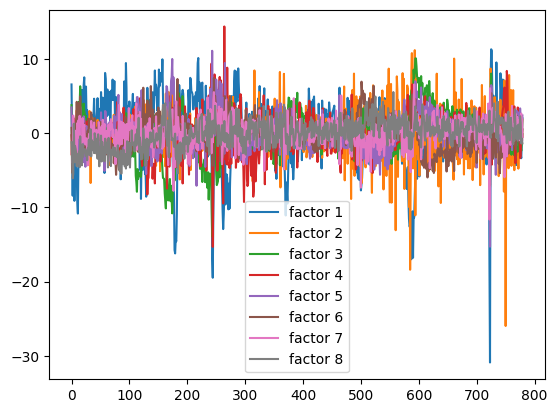

In [ ]:
# removing the first transformation row significantly improve the graphs!
import matplotlib.pyplot as plt
plt.plot(F[:,0], label='factor 1')
plt.plot(F[:,1], label='factor 2')
plt.plot(F[:,2], label='factor 3')
plt.plot(F[:,3], label='factor 4')
plt.plot(F[:,4], label='factor 5')
plt.plot(F[:,5], label='factor 6')
plt.plot(F[:,6], label='factor 7')
plt.plot(F[:,7], label='factor 8')
plt.legend();

In [ ]:
# Compute the cumulative R² for each series as factors are added.
R2_matrix = compute_R2_values(X_complete, F)

# Then compute the incremental R² (mR²) for each factor for each series and the average across series.
mR2_individual, mR2_average = compute_incremental_R2(R2_matrix)

series_names = df.columns.tolist()

# Optionally, create column labels for the factors
factor_labels = [f'Factor_{i+1}' for i in range(num_factors)]

# Create a DataFrame from the mR2_individual array with the desired indices and columns
mR2_df = pd.DataFrame(mR2_individual, index=series_names, columns=factor_labels)
mR2_df

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8,Factor_9,Factor_10
RPI,0.126225,0.059618,0.002124,0.023842,0.009810,0.000905,0.034278,0.037833,0.026213,0.015808
W875RX1,0.252562,0.084877,0.003126,0.019780,0.004642,0.015464,0.023909,0.024188,0.008268,0.014212
DPCERA3M086SBEA,0.126848,0.000108,0.021573,0.044493,0.000989,0.036314,0.097664,0.035764,0.026877,0.041665
CMRMTSPLX,0.272758,0.004061,0.039145,0.022044,0.029152,0.025327,0.057024,0.001997,0.020585,0.114527
RETAILX,0.165749,0.041427,0.006176,0.019123,0.012616,0.022609,0.091973,0.009899,0.028829,0.153121
...,...,...,...,...,...,...,...,...,...,...
UMCSENTX,0.000005,0.001280,0.025262,0.001602,0.025247,0.013784,0.246233,0.040395,0.000598,0.027624
DTCOLNVHFNM,0.001133,0.000009,0.000003,0.004809,0.000393,0.004579,0.000923,0.006322,0.022409,0.062390
DTCTHFNM,0.002012,0.000479,0.000123,0.006694,0.000063,0.001558,0.001651,0.000389,0.037875,0.117049
INVEST,0.000508,0.000019,0.000227,0.004587,0.002909,0.000843,0.000273,0.003376,0.004307,0.005485


In [ ]:
mR2_df.sort_values(by='Factor_1', ascending=False).head(10)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8,Factor_9,Factor_10
IPMANSICS,0.700810,0.002353,6.592616e-02,0.009718,0.110090,0.020236,1.660588e-02,0.001552,1.116562e-04,0.000011
INDPRO,0.676303,0.007298,6.646114e-02,0.004726,0.126413,0.022565,2.340392e-02,0.000005,2.261483e-07,0.006086
PAYEMS,0.674285,0.009154,1.904358e-02,0.008983,0.000949,0.117609,4.175110e-03,0.016763,1.281001e-03,0.021910
USGOOD,0.671588,0.013634,1.104071e-03,0.000226,0.000310,0.149917,3.094581e-08,0.000168,3.370668e-04,0.003900
IPFPNSS,0.637077,0.001505,5.298232e-02,0.011118,0.132483,0.035714,3.493154e-02,0.003075,5.439211e-05,0.022739
MANEMP,0.632657,0.014383,3.832678e-07,0.002175,0.002155,0.162416,1.229474e-03,0.001871,5.539825e-03,0.000136
CUMFNS,0.632495,0.003449,1.194432e-01,0.004139,0.104121,0.016894,1.355564e-02,0.016719,1.054865e-03,0.000015
DMANEMP,0.607058,0.014769,2.539297e-04,0.004077,0.001666,0.148092,2.199509e-03,0.000096,5.310572e-03,0.001759
IPDMAT,0.548028,0.003433,6.163013e-02,0.004374,0.067152,0.003611,1.007106e-02,0.024925,6.911986e-04,0.000048
IPFINAL,0.547749,0.001448,5.457316e-02,0.009775,0.161030,0.041035,4.991216e-02,0.002539,1.478429e-04,0.035967


In [ ]:
print(mR2_average)
sum(mR2_average)

[0.14917778 0.07249876 0.06804153 0.05350953 0.04395108 0.03662051
 0.02852412 0.02626373]


np.float64(0.47858705818591585)

## Factor Prediction

In [ ]:
# We create our factors dataframe for the forecasting below
factors_df = pd.DataFrame(F, columns=[f"Factor_{i+1}" for i in range(8)])
factors_df.index = df.index
factors_df.index = factors_df.index.to_period('M')
factors_df

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
1960-01,6.542131,-2.862292,3.754893,-0.294624,3.448691,0.702325,-2.817087,-1.241067
1960-02,-0.270067,0.103092,-1.927718,-1.300538,-3.332284,-5.339696,-1.506332,-3.377699
1960-03,-8.437872,0.383682,-1.338243,-2.002861,0.050022,0.036376,-4.015071,-6.101673
1960-04,0.099498,1.240578,-1.795652,-1.219958,-1.313087,-2.521932,2.355880,-5.519365
1960-05,-4.589942,-1.683024,-0.567478,1.992475,0.293575,1.428507,-2.918015,1.245611
...,...,...,...,...,...,...,...,...
2024-08,-1.418804,-0.306652,-0.840828,-3.387771,3.318519,-0.243527,-0.989052,2.266363
2024-09,-2.873685,1.302539,-1.862725,-3.071618,1.761139,-0.777712,2.283314,1.442554
2024-10,-3.389306,1.444160,-2.385335,2.010978,-0.053662,0.756406,2.634447,-1.387795
2024-11,-0.577906,0.383328,-1.040482,1.810630,0.316061,-0.171002,1.908490,-0.741627


In [ ]:
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error

# assume factors_df is your original DataFrame, indexed by a DatetimeIndex
# 1) TRAIN/TEST SPLIT (80/20 by time)
n = len(factors_df)
n_train = int(n * 0.8)
train_df = factors_df.iloc[:n_train]
test_df  = factors_df.iloc[n_train:]

# containers
rmse_dict = {}
models    = {}

# 2) FIT AR(1), FORECAST TEST, COMPUTE RMSE
for col in factors_df.columns:
    # fit on train
    y_train = train_df[col].dropna()
    model   = AutoReg(y_train, lags=1, old_names=False).fit()
    models[col] = model   # save for later

    # build one-step predictions on test:
    #  pred_t = intercept + phi * y_(t-1)
    # use the full series shifted by 1
    full = pd.concat([y_train, test_df[col]])
    preds = model.params['const'] + model.params[col + '.L1'] * full.shift(1)
    preds = preds.loc[test_df.index]

    # compute RMSE
    rmse = np.sqrt(mean_squared_error(test_df[col], preds))
    rmse_dict[col] = rmse

    coef_dict = {}
    for col, model in models.items():
        params = model.params
        coef_dict[col] = {
          'intercept': params['const'],
          'phi':        params[f'{col}.L1']
        }

coef_df = pd.DataFrame.from_dict(coef_dict, orient='index')
print("\nAR(1) Coefficients for each factor:\n")
print(coef_df)

# show test RMSEs
rmse_df = pd.Series(rmse_dict, name='AR1_test_RMSE')
print(rmse_df)

# 3) ONE-STEP FORECASTS FROM 1980-01 ONWARD USING TRAINED MODELS
start = '1980-01'
slice_df = factors_df.loc[start:]

forecast_df = pd.DataFrame(index=slice_df.index, columns=slice_df.columns)

for col, model in models.items():
    params = model.params
    phi    = params[col + '.L1']
    c      = params['const']

    # forecast[t] = c + phi * actual[t-1]
    forecast_df[col] = c + phi * slice_df[col].shift(1)

# 4) UNIFIED DATAFRAME
#    join the original factors and their forecasts side by side
#    suffix forecasts with '_AR1'
forecast_df = forecast_df.add_suffix('_AR1')
unified_df  = pd.concat([slice_df, forecast_df], axis=1)
unified_df


AR(1) Coefficients for each factor:

          intercept       phi
Factor_1  -0.020625  0.708132
Factor_2  -0.006444 -0.152304
Factor_3  -0.049273  0.854427
Factor_4  -0.132996  0.408515
Factor_5   0.071115  0.603867
Factor_6   0.137397  0.605411
Factor_7  -0.105977  0.178363
Factor_8  -0.110681  0.538430
Factor_1    4.038690
Factor_2    4.061771
Factor_3    1.752934
Factor_4    1.799556
Factor_5    2.432065
Factor_6    1.850003
Factor_7    2.053704
Factor_8    1.319741
Name: AR1_test_RMSE, dtype: float64


,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8,Factor_1_AR1,Factor_2_AR1,Factor_3_AR1,Factor_4_AR1,Factor_5_AR1,Factor_6_AR1,Factor_7_AR1,Factor_8_AR1
1980-01,0.700497,6.186407,-5.999279,0.391123,5.929801,1.407579,3.249707,-0.379019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-02,-0.700652,-0.040050,-5.494533,6.205812,2.469000,2.463597,2.745485,1.586737,0.475420,-0.948660,-5.175220,0.026784,3.651924,0.989562,0.473651,-0.314757
1980-03,-4.178398,2.296062,-9.274216,9.370467,5.367694,-0.510584,-2.728390,-0.575691,-0.516779,-0.000345,-4.743951,2.402173,1.562062,1.628887,0.383716,0.743666
1980-04,-16.978607,-2.503231,-13.927200,-2.320261,11.075221,-0.792013,0.337917,-0.255946,-2.979483,-0.356144,-7.973415,3.694983,3.312486,-0.171716,-0.592621,-0.420651
1980-05,-19.487478,3.309146,-1.796711,-15.334610,3.487455,-4.412355,-1.260340,1.337506,-12.043725,0.374808,-11.949051,-1.080858,6.759070,-0.342096,-0.045705,-0.248490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08,-1.418804,-0.306652,-0.840828,-3.387771,3.318519,-0.243527,-0.989052,2.266363,-2.151202,-0.442293,-1.825662,-0.314345,-0.011902,-0.655556,0.217880,-0.106410
2024-09,-2.873685,1.302539,-1.862725,-3.071618,1.761139,-0.777712,2.283314,1.442554,-1.025326,0.040260,-0.767699,-1.516952,2.075058,-0.010037,-0.282387,1.109598
2024-10,-3.389306,1.444160,-2.385335,2.010978,-0.053662,0.756406,2.634447,-1.387795,-2.055574,-0.204827,-1.640835,-1.387799,1.134608,-0.333438,0.301282,0.666034
2024-11,-0.577906,0.383328,-1.040482,1.810630,0.316061,-0.171002,1.908490,-0.741627,-2.420702,-0.226396,-2.087368,0.688519,0.038710,0.595334,0.363911,-0.857912


## Stock Market Data

In [ ]:
import yfinance as yf
# 1) Define the tickers
SPX_TICKER  = "^GSPC"   # S&P 500 index
TBILL_TICKER = "^IRX"   # CBOE 13‑Week T‑Bill (^IRX gives the annualized % yield)
WMT_TICKER = "WMT"
AAPL_TICKER = "AAPL"
# 2) Download history
#    Adjust start/end as needed
data = yf.download(
    [SPX_TICKER, TBILL_TICKER, WMT_TICKER, AAPL_TICKER],
    start="1981-01-01",
    end="2025-03-31",
    progress=False
)

# 3) Keep only the Adj Close columns
df_stocks = data["Close"].rename(columns={
    SPX_TICKER: "SPX_Close",
    WMT_TICKER: "WMT_Close",
    AAPL_TICKER: "AAPL_Close",
    TBILL_TICKER: "Tbill_Yield"
})

# 4) Convert T‑bill from % to daily log‐yield
#    IRX is quoted as a percent annual rate, so:
df_stocks["Tbill_Yield"] = df_stocks["Tbill_Yield"] / 100            # → decimal annual rate
df_stocks["rf_daily"]    = np.log1p(df_stocks["Tbill_Yield"] / 252)   # assume 252 trading days

# 5) Compute daily SPX log‐return and excess‐return
df_stocks["spx_ret"]     = np.log(df_stocks["SPX_Close"]).diff()
df_stocks["spx_exret"]   = df_stocks["spx_ret"] - df_stocks["rf_daily"]
# same fore walmart WMT
df_stocks["wmt_ret"]     = np.log(df_stocks["WMT_Close"]).diff()
df_stocks["wmt_exret"]   = df_stocks["wmt_ret"] - df_stocks["rf_daily"]
# same for AAPL
df_stocks["aapl_ret"]     = np.log(df_stocks["AAPL_Close"]).diff()
df_stocks["aapl_exret"]   = df_stocks["aapl_ret"] - df_stocks["rf_daily"]

# 6) Long Sample mean of daily excess return
Rbar = df_stocks["spx_exret"].mean()
Rbar_WMT = df_stocks["wmt_exret"].mean()
Rbar_AAPL = df_stocks["aapl_exret"].mean()

# 7) Squared Deviations will be the variance
df_stocks["sq_dev"] = (df_stocks["spx_exret"] - Rbar)**2
df_stocks["sq_dev_WMT"]= (df_stocks["wmt_exret"] - Rbar_WMT)**2
df_stocks["sq_dev_AAPL"]= (df_stocks["aapl_exret"] - Rbar_AAPL)**2

# 8) We aggregate to Monthly volatility from daily
# Sum daily numbers, then take the square-root
monthly_vol = (
    df_stocks["sq_dev"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)    # √[ Σ (…) ]
      .rename("VOL")
)
monthly_vol_wmt = (
    df_stocks["sq_dev_WMT"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)    # √[ Σ (…) ]
      .rename("VOL")
)
monthly_vol_aapl = (
    df_stocks["sq_dev_AAPL"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)
      .rename("VOL")
)

# 9) Monthly Panel
monthly = pd.DataFrame({
    "SPX_exret": df_stocks["spx_exret"].resample("ME").sum(),
    "WMT_exret": df_stocks["wmt_exret"].resample("ME").sum(),
    "AAPL_exret": df_stocks["aapl_exret"].resample("ME").sum(),
    "Tbill_Yield": df_stocks["Tbill_Yield"].resample("ME").mean(),
    "VOL": monthly_vol,
    "VOL_WMT": monthly_vol_wmt,
    "VOL_AAPL": monthly_vol_aapl
})

# remove day from date
monthly.index = monthly.index.to_period('M')
monthly

YF.download() has changed argument auto_adjust default to True


,SPX_exret,WMT_exret,AAPL_exret,Tbill_Yield,VOL,VOL_WMT,VOL_AAPL
Date,,,,,,,
1981-01,-0.063018,-0.064687,-0.211800,0.150219,0.041119,0.129371,0.143632
1981-02,0.008574,0.030716,-0.064972,0.147878,0.038550,0.126170,0.163224
1981-03,0.023739,0.133557,-0.090134,0.133586,0.044898,0.072064,0.154722
1981-04,-0.035143,0.045181,0.135428,0.136924,0.029663,0.083891,0.155536
1981-05,-0.014594,-0.009710,0.141842,0.163045,0.030678,0.066888,0.108160
...,...,...,...,...,...,...,...
2024-11,0.052223,0.117603,0.046918,0.044062,0.034813,0.052972,0.042157
2024-12,-0.028852,-0.024848,0.050144,0.042530,0.041090,0.053825,0.046668
2025-01,0.023325,0.079575,-0.062641,0.042001,0.038813,0.044633,0.085585


In [ ]:
# we merged our dataframes for the regressions below
# Reset the index of the original DataFrame to align with the factors
df_merged = pd.concat([monthly, unified_df], axis=1)
df_merged = df_merged.dropna(subset=['Factor_1', 'SPX_exret'])
# drop the first row due to not having a forecast
df_merged = df_merged.iloc[1:]
df_merged

,SPX_exret,WMT_exret,AAPL_exret,Tbill_Yield,VOL,VOL_WMT,VOL_AAPL,Factor_1,Factor_2,Factor_3,...,Factor_7,Factor_8,Factor_1_AR1,Factor_2_AR1,Factor_3_AR1,Factor_4_AR1,Factor_5_AR1,Factor_6_AR1,Factor_7_AR1,Factor_8_AR1
1981-02,0.008574,0.030716,-0.064972,0.147878,0.038550,0.126170,0.163224,-2.857581,1.917704,-6.474136,...,-0.350429,-1.764364,-2.924610,-0.629868,-5.834142,-2.201548,3.540534,-0.916124,0.104212,0.285328
1981-03,0.023739,0.133557,-0.090134,0.133586,0.044898,0.072064,0.154722,-1.364456,-2.613521,-2.407459,...,2.156246,1.050256,-2.044171,-0.298519,-5.580950,1.590724,2.069854,-0.510676,-0.168480,-1.060668
1981-04,-0.035143,0.045181,0.135428,0.136924,0.029663,0.083891,0.155536,1.126399,-1.772418,-5.814517,...,3.571966,1.029400,-0.986840,0.391606,-2.106271,-1.319734,2.926296,-0.386509,0.278618,0.454808
1981-05,-0.014594,-0.009710,0.141842,0.163045,0.030678,0.066888,0.108160,0.898061,1.491892,-5.973658,...,0.538611,-0.467369,0.777014,0.263502,-5.017354,2.026524,2.480021,0.573213,0.531130,0.443579
1981-06,-0.023322,-0.030737,-0.255052,0.147341,0.032022,0.070938,0.139279,-4.043321,0.439721,-0.410783,...,0.155543,-1.420014,0.615321,-0.233666,-5.153329,2.952431,4.275861,1.020399,-0.009908,-0.362327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08,0.018180,0.116361,0.027443,0.050385,0.056418,0.075518,0.066860,-1.418804,-0.306652,-0.840828,...,-0.989052,2.266363,-2.151202,-0.442293,-1.825662,-0.314345,-0.011902,-0.655556,0.217880,-0.106410
2024-09,0.016261,0.040835,0.013581,0.047066,0.038227,0.049642,0.064411,-2.873685,1.302539,-1.862725,...,2.283314,1.442554,-1.025326,0.040260,-0.767699,-1.516952,2.075058,-0.010037,-0.282387,1.109598
2024-10,-0.014053,0.010645,-0.035009,0.045000,0.032840,0.045884,0.062924,-3.389306,1.444160,-2.385335,...,2.634447,-1.387795,-2.055574,-0.204827,-1.640835,-1.387799,1.134608,-0.333438,0.301282,0.666034
2024-11,0.052223,0.117603,0.046918,0.044062,0.034813,0.052972,0.042157,-0.577906,0.383328,-1.040482,...,1.908490,-0.741627,-2.420702,-0.226396,-2.087368,0.688519,0.038710,0.595334,0.363911,-0.857912


## Regression

### Function code

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

def forecast_analysis(df_merged, ret_var, vol_var, factor_cols_pred,
                      max_ret_lags=1, max_fac=8, h=1):
    df = df_merged.copy()

    # 1) prepare leads and lags for Y
    df[f"{ret_var}_lead"] = df[ret_var].shift(-h)
    for lag in range(1, max_ret_lags+1):
        df[f"{ret_var}_lag{lag}"] = df[ret_var].shift(lag)
    df[f"{vol_var}_lead"] = df[vol_var].shift(-h)
    df["vol_t"] = df[vol_var]

    # 2) drop missing
    ret_cols = [f"{ret_var}_lead"] + [f"{ret_var}_lag{lag}" for lag in range(1, max_ret_lags+1)]
    df_ret = df[ret_cols + factor_cols_pred].dropna()
    df_vol = df[[f"{vol_var}_lead","vol_t"] + factor_cols_pred].dropna()

    # 3) train/test split
    split_ret = int(0.8 * len(df_ret))
    split_vol = int(0.8 * len(df_vol))
    train_ret, test_ret = df_ret.iloc[:split_ret], df_ret.iloc[split_ret:]
    train_vol, test_vol = df_vol.iloc[:split_vol], df_vol.iloc[split_vol:]

    y_tr_ret = train_ret[f"{ret_var}_lead"]
    y_te_ret = test_ret[f"{ret_var}_lead"]

    # 4) select ret‐lags & number of factors by BIC on the train set
    best_bic, best_cfg = np.inf, None
    for nl in range(1, max_ret_lags+1):
        ret_lag_cols = [f"{ret_var}_lag{lag}" for lag in range(1, nl+1)]
        for k in range(1, max_fac+1):
            Xtr = sm.add_constant(train_ret[ret_lag_cols + factor_cols_pred[:k]])
            m = sm.OLS(y_tr_ret, Xtr).fit()
            if m.bic < best_bic:
                best_bic, best_cfg = m.bic, (nl, k)

    nl_best, k_best = best_cfg

    # re‐fit return factor model
    ret_lag_cols = [f"{ret_var}_lag{lag}" for lag in range(1, nl_best+1)]
    fac_cols_ret = factor_cols_pred[:k_best]
    X_tr_fac = sm.add_constant(train_ret[ret_lag_cols + fac_cols_ret])
    X_te_fac = sm.add_constant(test_ret[ret_lag_cols + fac_cols_ret])
    fac_mod   = sm.OLS(y_tr_ret, X_tr_fac).fit()
    y_hat_fac = fac_mod.predict(X_te_fac)
    rmse_fac  = np.sqrt(((y_te_ret - y_hat_fac)**2).mean())

    # AR(1) benchmark for returns
    X_tr_ar1  = sm.add_constant(train_ret[[f"{ret_var}_lag1"]])
    X_te_ar1  = sm.add_constant(test_ret[[f"{ret_var}_lag1"]])
    ar1_mod   = sm.OLS(y_tr_ret, X_tr_ar1).fit()
    y_hat_ar1 = ar1_mod.predict(X_te_ar1)
    rmse_ar1  = np.sqrt(((y_te_ret - y_hat_ar1)**2).mean())

    # 5) volatility side: pick # factors by BIC
    yv_tr, yv_te = train_vol[f"{vol_var}_lead"], test_vol[f"{vol_var}_lead"]
    best_bic_v, best_k_v = np.inf, None
    for k in range(1, max_fac+1):
        Xv = sm.add_constant(train_vol[["vol_t"] + factor_cols_pred[:k]])
        mv = sm.OLS(yv_tr, Xv).fit()
        if mv.bic < best_bic_v:
            best_bic_v, best_k_v = mv.bic, k

    fac_cols_vol = factor_cols_pred[:best_k_v]
    Xv_tr_fac = sm.add_constant(train_vol[["vol_t"] + fac_cols_vol])
    Xv_te_fac = sm.add_constant(test_vol[["vol_t"] + fac_cols_vol])
    vfac_mod  = sm.OLS(yv_tr, Xv_tr_fac).fit()
    y_hat_vf  = vfac_mod.predict(Xv_te_fac)
    rmse_vf   = np.sqrt(((yv_te - y_hat_vf)**2).mean())

    # AR(1) benchmark for volatility
    Xv_tr_ar1 = sm.add_constant(train_vol[["vol_t"]])
    Xv_te_ar1 = sm.add_constant(test_vol[["vol_t"]])
    var1_mod  = sm.OLS(yv_tr, Xv_tr_ar1).fit()
    y_hat_v1  = var1_mod.predict(Xv_te_ar1)
    rmse_v1   = np.sqrt(((yv_te - y_hat_v1)**2).mean())

    # return everything in a dict
    return {
        "horizon":      h,
        "ret_lags":     nl_best,
        "ret_factors":  k_best,
        "rmse_fac_ret": rmse_fac,
        "rmse_ar1_ret": rmse_ar1,
        "vol_factors":  best_k_v,
        "rmse_fac_vol": rmse_vf,
        "rmse_ar1_vol": rmse_v1
    }

In [ ]:
# Raw factor names (omit any “_ARMA” columns)
factor_cols = [c for c in df_merged.columns
               if c.startswith("Factor_") and not c.endswith("_AR1")]

### Forecasts via BIC

In [ ]:
# --- now loop over assets & horizons ---
horizons = [1, 3, 6, 9, 12, 24]
assets   = [
    ("SPX_exret",   "VOL"),
    ("WMT_exret", "VOL_WMT"),
    ("AAPL_exret", "VOL_AAPL")
]

all_results = []
for ret_var, vol_var in assets:
    for h in horizons:
        res = forecast_analysis(
            df_merged=df_merged,              # or df_merged / df_wins
            ret_var=ret_var,
            vol_var=vol_var,
            factor_cols_pred=factor_cols,
            # max_ret_lags=4,
            max_fac=8,
            h=h
        )
        res["asset"] = ret_var.split("_")[0]
        all_results.append(res)

# build a DataFrame for easy comparison
summary = pd.DataFrame(all_results)
summary = summary.set_index(["asset","horizon"])
print(summary)

               ret_lags  ret_factors  rmse_fac_ret  rmse_ar1_ret  vol_factors  \
asset horizon                                                                   
SPX   1               1            1      0.045131      0.044924            1   
      3               1            1      0.045236      0.044992            1   
      6               1            1      0.045048      0.045053            1   
      9               1            1      0.045271      0.045164            3   
      12              1            1      0.045297      0.045259            5   
      24              1            1      0.046282      0.045721            3   
WMT   1               1            1      0.052693      0.052489            3   
      3               1            1      0.052175      0.052592            3   
      6               1            1      0.052606      0.052802            3   
      9               1            1      0.053475      0.052794            4   
      12              1     

### 3-factor model forecast

In [ ]:
import statsmodels.api as sm
import numpy as np

def forecast_analysis_manual(
    df,
    ret_var,
    vol_var,
    factor_cols,
    h,
    ret_factors,
    vol_factors
):
    # 1) copy & build leads and 1-lag
    df2 = df.copy().sort_index()
    df2[f"{ret_var}_lead"] = df2[ret_var].shift(-h)
    df2[f"{ret_var}_lag1"] = df2[ret_var].shift(1)
    df2[f"{vol_var}_lead"] = df2[vol_var].shift(-h)
    df2["vol_t"]           = df2[vol_var]

    # 2) drop NAs & split into train/test
    df_ret = df2[[f"{ret_var}_lead", f"{ret_var}_lag1"] + factor_cols].dropna()
    df_vol = df2[[f"{vol_var}_lead", "vol_t"] + factor_cols].dropna()

    split_ret = int(0.8 * len(df_ret))
    train_ret, test_ret = df_ret.iloc[:split_ret], df_ret.iloc[split_ret:]

    split_vol = int(0.8 * len(df_vol))
    train_vol, test_vol = df_vol.iloc[:split_vol], df_vol.iloc[split_vol:]

    results = {"horizon": h, "ret_factors": ret_factors, "vol_factors": vol_factors}

    # 3) Factor-augmented return forecast (no ret lags)
    y_tr_ret = train_ret[f"{ret_var}_lead"]
    y_te_ret = test_ret[f"{ret_var}_lead"]

    X_tr_fac = sm.add_constant(train_ret[factor_cols[:ret_factors]])
    X_te_fac = sm.add_constant(test_ret[factor_cols[:ret_factors]])

    fac_mod   = sm.OLS(y_tr_ret, X_tr_fac).fit()
    y_hat_fac = fac_mod.predict(X_te_fac)
    results["rmse_fac_ret"] = np.sqrt(((y_te_ret - y_hat_fac)**2).mean())
    results["coef_fac_ret"] = fac_mod.params.to_dict()

    # 4) AR(1) benchmark for returns
    X_tr_ar1 = sm.add_constant(train_ret[f"{ret_var}_lag1"])
    X_te_ar1 = sm.add_constant(test_ret[f"{ret_var}_lag1"])

    ar1_mod   = sm.OLS(y_tr_ret, X_tr_ar1).fit()
    y_hat_ar1 = ar1_mod.predict(X_te_ar1)
    results["rmse_ar1_ret"] = np.sqrt(((y_te_ret - y_hat_ar1)**2).mean())
    results["coef_ar1_ret"] = ar1_mod.params.to_dict()

    # 5) Factor-augmented volatility forecast
    y_tr_vol = train_vol[f"{vol_var}_lead"]
    y_te_vol = test_vol[f"{vol_var}_lead"]

    Xv_tr_fac = sm.add_constant(train_vol[["vol_t"] + factor_cols[:vol_factors]])
    Xv_te_fac = sm.add_constant(test_vol[["vol_t"] + factor_cols[:vol_factors]])

    vfac_mod  = sm.OLS(y_tr_vol, Xv_tr_fac).fit()
    y_hat_vf  = vfac_mod.predict(Xv_te_fac)
    results["rmse_fac_vol"] = np.sqrt(((y_te_vol - y_hat_vf)**2).mean())
    results["coef_fac_vol"] = vfac_mod.params.to_dict()

    # 6) AR(1) benchmark for volatility
    Xv_tr_ar1 = sm.add_constant(train_vol[["vol_t"]])
    Xv_te_ar1 = sm.add_constant(test_vol[["vol_t"]])

    var1_mod  = sm.OLS(y_tr_vol, Xv_tr_ar1).fit()
    y_hat_v1  = var1_mod.predict(Xv_te_ar1)
    results["rmse_ar1_vol"] = np.sqrt(((y_te_vol - y_hat_v1)**2).mean())
    results["coef_ar1_vol"] = var1_mod.params.to_dict()

    return results


In [ ]:
# ----------------------------------------------------------------
# YOUR MANUAL CONFIG: for each horizon, how many factors to use
manual_config = {
    1:  {"ret_factors": 3, "vol_factors": 3},
    3:  {"ret_factors": 3, "vol_factors": 3},
    6:  {"ret_factors": 3, "vol_factors": 3},
    9:  {"ret_factors": 3, "vol_factors": 3},
    12: {"ret_factors": 3, "vol_factors": 3},
    24: {"ret_factors": 3, "vol_factors": 3},
}

horizons = [1,3,6,9,12,24]
assets   = [
    ("SPX_exret","VOL"),
    ("WMT_exret","VOL_WMT"),
    ("AAPL_exret","VOL_AAPL")
]

all_results = []
coef_rows   = []

for ret_var, vol_var in assets:
    asset_name = ret_var.split("_")[0]
    for h in horizons:
        cfg = manual_config[h]
        res = forecast_analysis_manual(
            df=            df_merged,
            ret_var=       ret_var,
            vol_var=       vol_var,
            factor_cols=   factor_cols,
            h=             h,
            ret_factors=   cfg["ret_factors"],
            vol_factors=   cfg["vol_factors"],
        )
        # add identifying info
        res["asset"]   = asset_name
        all_results.append(res)

        # pull out each of the 4 sets of coefficients
        for model_key, model_name in [
            ("coef_fac_ret", "FactorOnlyRet"),
            ("coef_ar1_ret", "AR1Ret"),
            ("coef_fac_vol", "FactorOnlyVol"),
            ("coef_ar1_vol", "AR1Vol")
        ]:
            coefs = res[model_key]
            for param, value in coefs.items():
                coef_rows.append({
                    "asset":    asset_name,
                    "horizon":  h,
                    "model":    model_name,
                    "parameter":param,
                    "value":    value
                })

#  Build summary RMSE table
summary_factors = (
    pd.DataFrame(all_results)
      .set_index(["asset","horizon"])
      .loc[:, ["ret_factors","rmse_fac_ret","rmse_ar1_ret",
                "vol_factors","rmse_fac_vol","rmse_ar1_vol"]]
)
print("\nForecast RMSE / Configuration:\n", summary_factors)

#  Build long‐form coefficients table
summary_coefs = pd.DataFrame(coef_rows).set_index(
    ["asset","horizon","model","parameter"]
)
print("\nModel Coefficients:\n", summary_coefs)



Forecast RMSE / Configuration:
                ret_factors  rmse_fac_ret  rmse_ar1_ret  vol_factors  \
asset horizon                                                         
SPX   1                  3      0.045604      0.044924            3   
      3                  3      0.047279      0.044992            3   
      6                  3      0.045228      0.045053            3   
      9                  3      0.045771      0.045164            3   
      12                 3      0.045254      0.045259            3   
      24                 3      0.045918      0.045721            3   
WMT   1                  3      0.053194      0.052489            3   
      3                  3      0.052656      0.052592            3   
      6                  3      0.052509      0.052802            3   
      9                  3      0.054084      0.052794            3   
      12                 3      0.053172      0.053299            3   
      24                 3      0.052983    

In [ ]:
print(summary_coefs.to_string())


                                                value
asset horizon model         parameter                
SPX   1       FactorOnlyRet const            0.002086
                            Factor_1         0.000625
                            Factor_2        -0.000800
                            Factor_3         0.001222
              AR1Ret        const            0.002604
                            SPX_exret_lag1  -0.026036
              FactorOnlyVol const            0.018546
                            vol_t            0.564669
                            Factor_1        -0.000885
                            Factor_2        -0.000002
                            Factor_3        -0.000009
              AR1Vol        const            0.017183
                            vol_t            0.612113
      3       FactorOnlyRet const            0.002308
                            Factor_1         0.000666
                            Factor_2         0.001078
                            

In [ ]:
import statsmodels.api as sm
import numpy as np
import pandas as pd

def forecast_analysis_manual(
    df,
    ret_var,
    vol_var,
    factor_cols,
    h,
    ret_factors,
    vol_factors
):
    # 1) copy & build leads and 1-lag
    df2 = df.copy().sort_index()
    df2[f"{ret_var}_lead"] = df2[ret_var].shift(-h)
    df2[f"{ret_var}_lag1"]  = df2[ret_var].shift(1)
    df2[f"{vol_var}_lead"]  = df2[vol_var].shift(-h)
    df2["vol_t"]            = df2[vol_var]

    # 2) drop NAs & split into train/test
    df_ret = df2[[f"{ret_var}_lead", f"{ret_var}_lag1"] + factor_cols].dropna()
    df_vol = df2[[f"{vol_var}_lead", "vol_t"] + factor_cols].dropna()

    split_ret = int(0.8 * len(df_ret))
    train_ret, test_ret = df_ret.iloc[:split_ret], df_ret.iloc[split_ret:]

    split_vol = int(0.8 * len(df_vol))
    train_vol, test_vol = df_vol.iloc[:split_vol], df_vol.iloc[split_vol:]

    results = {
        "horizon":      h,
        "ret_factors":  ret_factors,
        "vol_factors":  vol_factors
    }

    # 3) Factor‐augmented return forecast
    y_tr_ret    = train_ret[f"{ret_var}_lead"]
    y_te_ret    = test_ret [f"{ret_var}_lead"]
    X_tr_fac    = sm.add_constant(train_ret[factor_cols[:ret_factors]])
    X_te_fac    = sm.add_constant(test_ret [factor_cols[:ret_factors]])
    fac_mod     = sm.OLS(y_tr_ret, X_tr_fac).fit()
    y_hat_fac   = fac_mod.predict(X_te_fac)
    results["rmse_fac_ret"]  = np.sqrt(((y_te_ret - y_hat_fac)**2).mean())
    results["coef_fac_ret"]  = fac_mod.params .to_dict()
    results["p_fac_ret"]     = fac_mod.pvalues.to_dict()

    # 4) AR(1) benchmark for returns
    X_tr_ar1 = sm.add_constant(train_ret[[f"{ret_var}_lag1"]])
    X_te_ar1 = sm.add_constant(test_ret [[f"{ret_var}_lag1"]])
    ar1_mod  = sm.OLS(y_tr_ret, X_tr_ar1).fit()
    y_hat_ar1= ar1_mod.predict(X_te_ar1)
    results["rmse_ar1_ret"]  = np.sqrt(((y_te_ret - y_hat_ar1)**2).mean())
    results["coef_ar1_ret"]  = ar1_mod.params .to_dict()
    results["p_ar1_ret"]     = ar1_mod.pvalues.to_dict()

    # 5) Factor‐augmented volatility forecast
    y_tr_vol    = train_vol[f"{vol_var}_lead"]
    y_te_vol    = test_vol [f"{vol_var}_lead"]
    Xv_tr_fac   = sm.add_constant(train_vol[["vol_t"] + factor_cols[:vol_factors]])
    Xv_te_fac   = sm.add_constant(test_vol [ ["vol_t"] + factor_cols[:vol_factors]])
    vfac_mod    = sm.OLS(y_tr_vol, Xv_tr_fac).fit()
    y_hat_vf    = vfac_mod.predict(Xv_te_fac)
    results["rmse_fac_vol"]  = np.sqrt(((y_te_vol - y_hat_vf)**2).mean())
    results["coef_fac_vol"]  = vfac_mod.params .to_dict()
    results["p_fac_vol"]     = vfac_mod.pvalues.to_dict()

    # 6) AR(1) benchmark for volatility
    Xv_tr_ar1 = sm.add_constant(train_vol[["vol_t"]])
    Xv_te_ar1 = sm.add_constant(test_vol [["vol_t"]])
    var1_mod  = sm.OLS(y_tr_vol, Xv_tr_ar1).fit()
    y_hat_v1  = var1_mod.predict(Xv_te_ar1)
    results["rmse_ar1_vol"]  = np.sqrt(((y_te_vol - y_hat_v1)**2).mean())
    results["coef_ar1_vol"]  = var1_mod.params .to_dict()
    results["p_ar1_vol"]     = var1_mod.pvalues.to_dict()

    return results

# ----------------------------------------------------------------
# Build results and coefficients tables as before, but now also including p-values:

all_results = []
coef_rows   = []

for ret_var, vol_var in assets:
    asset_name = ret_var.split("_")[0]
    for h in horizons:
        cfg = manual_config[h]
        res = forecast_analysis_manual(
            df=            df_merged,
            ret_var=       ret_var,
            vol_var=       vol_var,
            factor_cols=   factor_cols,
            h=             h,
            ret_factors=   cfg["ret_factors"],
            vol_factors=   cfg["vol_factors"],
        )
        res["asset"], res["horizon"] = asset_name, h
        all_results.append(res)

        # For each model, emit rows for both coef and pvalue
        for model_key, model_name in [
            ("coef_fac_ret", "FactorAug_AR1_RET"),
            ("coef_ar1_ret", "AR1_RET"),
            ("coef_fac_vol", "FactorAug_AR1_VOL"),
            ("coef_ar1_vol", "AR1_VOL")
        ]:
            coefs  = res[ model_key ]
            pvals  = res[ model_key.replace("coef_", "p_") ]
            for param in coefs:
                coef_rows.append({
                    "asset":     asset_name,
                    "horizon":   h,
                    "model":     model_name,
                    "parameter": param,
                    "estimate":  coefs[param],
                    "p_value":   pvals[param]
                })

summary_factors = (
    pd.DataFrame(all_results)
      .set_index(["asset","horizon"])
      .loc[:, ["ret_factors","rmse_fac_ret","rmse_ar1_ret",
               "vol_factors","rmse_fac_vol","rmse_ar1_vol"]]
)

summary_coefs = (
    pd.DataFrame(coef_rows)
      .set_index(["asset","horizon","model","parameter"])
)


In [ ]:
print(summary_coefs.to_string())

                                                 estimate       p_value
asset horizon model             parameter                              
SPX   1       FactorAug_AR1_RET const            0.002086  3.494557e-01
                                Factor_1         0.000625  2.498740e-01
                                Factor_2        -0.000800  1.844442e-01
                                Factor_3         0.001222  1.291274e-01
              AR1_RET           const            0.002604  2.211206e-01
                                SPX_exret_lag1  -0.026036  5.954346e-01
              FactorAug_AR1_VOL const            0.018546  3.459455e-18
                                vol_t            0.564669  1.892347e-35
                                Factor_1        -0.000885  1.699347e-03
                                Factor_2        -0.000002  9.941362e-01
                                Factor_3        -0.000009  9.819030e-01
              AR1_VOL           const            0.017183  1.675

In [ ]:
summary_coefs

estimate       p_value
asset horizon model             parameter                        
SPX   1       FactorAug_AR1_RET const      0.002086  3.494557e-01
                                Factor_1   0.000625  2.498740e-01
                                Factor_2  -0.000800  1.844442e-01
                                Factor_3   0.001222  1.291274e-01
              AR1_RET           const      0.002604  2.211206e-01
...                                             ...           ...
AAPL  24      FactorAug_AR1_VOL Factor_1   0.000826  2.681891e-01
                                Factor_2   0.000486  5.670102e-01
                                Factor_3  -0.006379  2.511361e-08
              AR1_VOL           const      0.101061  2.233547e-38
                                vol_t      0.157183  1.779439e-03

[234 rows x 2 columns]

## 8-factor model forecasts

In [ ]:
manual_config = {
    1:  {"ret_factors": 8, "vol_factors": 8},
    3:  {"ret_factors": 8, "vol_factors": 8},
    6:  {"ret_factors": 8, "vol_factors": 8},
    9:  {"ret_factors": 8, "vol_factors": 8},
    12: {"ret_factors": 8, "vol_factors": 8},
    24: {"ret_factors": 8, "vol_factors": 8},
}

all_results = []
for ret_var, vol_var in assets:
    for h in horizons:
        cfg = manual_config[h]
        res = forecast_analysis_manual(
            df=            df_merged,           # or your winsorized df
            ret_var=       ret_var,
            vol_var=       vol_var,
            factor_cols=   factor_pred_cols,
            h=             h,
            ret_factors=   cfg["ret_factors"],
            vol_factors=   cfg["vol_factors"],
        )
        res["asset"] = ret_var.split("_")[0]
        all_results.append(res)

# Build summary table
summary_factors = pd.DataFrame(all_results).set_index(["asset","horizon"])
print(summary_factors)

# Ridge and Lasso on Winsorized data

In [ ]:
import warnings
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.metrics import mean_squared_error
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import TimeSeriesSplit

In [ ]:
# We merged our Macrovariables dataframe with our stock market dataframe
# remove day from date for df as we did for stock market data "monthly"
df.index = df.index.to_period('M')
df_regu = pd.concat([monthly, df], axis=1)
df_regu = df_regu.dropna(subset=['RPI', 'SPX_exret'])
df_regu

,SPX_exret,WMT_exret,AAPL_exret,Tbill_Yield,VOL,VOL_WMT,VOL_AAPL,RPI,W875RX1,DPCERA3M086SBEA,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,DTCOLNVHFNM,DTCTHFNM,INVEST,VIXCLSX
1981-01,-0.063018,-0.064687,-0.211801,0.150219,0.041119,0.129371,0.143632,-0.003229,-0.002738,0.000262,...,0.002637,0.003650,0.001178,0.003016,0.001276,6.9,0.001905,-0.007714,0.001435,20.3014
1981-02,0.008574,0.030717,-0.064972,0.147878,0.038550,0.126170,0.163223,-0.002796,-0.002934,-0.002510,...,0.005345,-0.002337,-0.004976,-0.004120,-0.002684,-4.5,0.002485,0.001825,-0.000457,20.9195
1981-03,0.023739,0.133557,-0.090135,0.133586,0.044898,0.072064,0.154722,0.003161,0.002878,0.002918,...,-0.005803,-0.001499,0.006088,-0.000026,0.002580,-0.4,0.024537,0.010775,-0.001522,21.8588
1981-04,-0.035143,0.045182,0.135427,0.136924,0.029663,0.083892,0.155536,-0.001845,-0.000827,-0.003590,...,-0.009569,-0.000694,-0.003716,-0.000025,0.002520,5.9,-0.022149,-0.006131,0.001353,16.5479
1981-05,-0.014594,-0.009711,0.141842,0.163045,0.030678,0.066889,0.108161,0.002989,0.003190,0.000468,...,-0.000431,0.000570,-0.001239,0.001965,-0.003940,3.9,-0.005676,-0.001102,-0.001913,17.2474
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08,0.018180,0.116361,0.027443,0.050385,0.056418,0.075518,0.066860,0.000066,-0.000117,0.000711,...,-0.002222,-0.000061,-0.002580,0.001376,-0.006110,1.5,-0.001974,-0.000766,0.001457,19.6750
2024-09,0.016261,0.040835,0.013581,0.047066,0.038227,0.049642,0.064411,0.001458,0.000240,0.005257,...,-0.002598,0.000553,0.004137,0.001906,0.004652,2.2,-0.002368,-0.001586,-0.001713,17.6597
2024-10,-0.014053,0.010645,-0.035009,0.045000,0.032840,0.045883,0.062924,0.003077,0.003231,0.001322,...,0.003609,0.000727,-0.003839,-0.005006,-0.002154,0.4,-0.000203,0.001703,-0.000679,19.9478
2024-11,0.052223,0.117603,0.046918,0.044062,0.034813,0.052972,0.042157,0.001798,0.002507,0.004463,...,0.000117,-0.002130,-0.000639,-0.002760,0.003190,1.3,-0.000872,-0.001684,-0.011910,15.9822


we look at nas and fill them using the EM-algorithm

In [ ]:
df_regu.isna().sum().sum()

np.int64(828)

In [ ]:
def em_pca_impute(df, num_factors=5, tol=1e-4, max_iter=100):
    """
    Impute missing values via iterative PCA (EM‐style).
    df           : DataFrame with NaNs to impute
    num_factors  : number of principal components to keep
    tol          : convergence tolerance on imputed entries
    max_iter     : max number of EM iterations
    """
    X = df.values.astype(float)
    mask = ~np.isnan(X)         # True where observed
    # 1) initial fill: column means
    col_means = np.nanmean(X, axis=0)
    X_imp = np.where(mask, X, col_means)

    for it in range(max_iter):
        # 2) SVD on current fill
        U, s, Vt = svd(X_imp, full_matrices=False)
        # keep top k components
        Uk = U[:, :num_factors]
        sk = s[:num_factors]
        Vk = Vt[:num_factors, :]
        # reconstruct
        X_hat = (Uk * sk).dot(Vk)
        # 3) update only the missing entries
        X_new = X.copy()
        X_new[~mask] = X_hat[~mask]
        # 4) check convergence on missing entries
        diff = norm(X_new[~mask] - X_imp[~mask])
        denom = norm(X_imp[~mask])
        if denom == 0 or diff/denom < tol:
            print(f"EM‐PCA converged in {it+1} iterations.")
            X_imp = X_new
            break
        X_imp = X_new

    return pd.DataFrame(X_imp, index=df.index, columns=df.columns)

# 1) Impute
df_imputed = em_pca_impute(df_regu, num_factors=10, tol=1e-4, max_iter=100)

## Summary Statistics if needed

In [ ]:
!pip install stargazer

## Predictions

In [ ]:
# --- 1) SETTINGS ---
warnings.filterwarnings("ignore", category=ConvergenceWarning)

targets    = ['SPX_exret','WMT_exret','AAPL_exret','VOL','VOL_WMT','VOL_AAPL']
predictors = [c for c in df_imputed.columns if c not in targets]
horizons   = [1,3,6,9,12,24]
alphas     = np.logspace(-4,4,100)

# Use a time-series split for CV
tscv = TimeSeriesSplit(n_splits=5)

# --- 2) SPLIT DATA ---
split = int(0.8 * len(df_imputed))
train, test = df_imputed.iloc[:split], df_imputed.iloc[split:]

# --- 3) CONTAINERS ---
forecast_store = {t: {'lasso': {}, 'ridge': {}} for t in targets}
results_list   = []

# --- 4) FIT & FORECAST ---
for t in targets:
    X_tr, y_tr = train[predictors], train[t]
    X_te, y_te = test[predictors],  test[t]

    # Pipelines with time-series CV
    lasso_pipe = make_pipeline(
        StandardScaler(),
        LassoCV(alphas=alphas, cv=tscv, max_iter=5000)
    )
    ridge_pipe = make_pipeline(
        StandardScaler(),
        RidgeCV(alphas=alphas, cv=tscv)
    )

    # Fit
    lasso_pipe.fit(X_tr, y_tr)
    ridge_pipe.fit(X_tr, y_tr)

    # Forecast on test set
    yhat_l = pd.Series(lasso_pipe.predict(X_te), index=test.index)
    yhat_r = pd.Series(ridge_pipe.predict(X_te), index=test.index)

    # Evaluate each horizon
    for h in horizons:
        actual     = y_te.shift(-h+1).dropna()
        pred_lasso = yhat_l.shift(h-1).dropna()
        pred_ridge = yhat_r.shift(h-1).dropna()

        actual, pred_lasso = actual.align(pred_lasso, join='inner')
        actual, pred_ridge = actual.align(pred_ridge, join='inner')

        rmse_l = np.sqrt(mean_squared_error(actual, pred_lasso))
        rmse_r = np.sqrt(mean_squared_error(actual, pred_ridge))

        forecast_store[t]['lasso'][h] = (pred_lasso, actual)
        forecast_store[t]['ridge'][h] = (pred_ridge, actual)

        results_list.append({
            'target':          t,
            'horizon':         h,
            'rmse_lasso':      rmse_l,
            'rmse_ridge':      rmse_r,
            'n_nonzero_lasso': np.sum(lasso_pipe.named_steps['lassocv'].coef_ != 0),
            'alpha_lasso':     lasso_pipe.named_steps['lassocv'].alpha_,
            'alpha_ridge':     ridge_pipe.named_steps['ridgecv'].alpha_
        })

# --- 5) SUMMARY TABLE ---
summary_lasso = pd.DataFrame(results_list).set_index(['target','horizon'])
print(summary_lasso)

                    rmse_lasso  rmse_ridge  n_nonzero_lasso  alpha_lasso  \
target     horizon                                                         
SPX_exret  1          0.037109    0.040345                4     0.004977   
           3          0.046539    0.047060                4     0.004977   
           6          0.049037    0.053166                4     0.004977   
           9          0.046308    0.047774                4     0.004977   
           12         0.054143    0.057526                4     0.004977   
           24         0.053346    0.055364                4     0.004977   
WMT_exret  1          0.052732    0.052460                2     0.015199   
           3          0.052337    0.053482                2     0.015199   
           6          0.053982    0.055583                2     0.015199   
           9          0.053767    0.056002                2     0.015199   
           12         0.056758    0.060327                2     0.015199   
           2

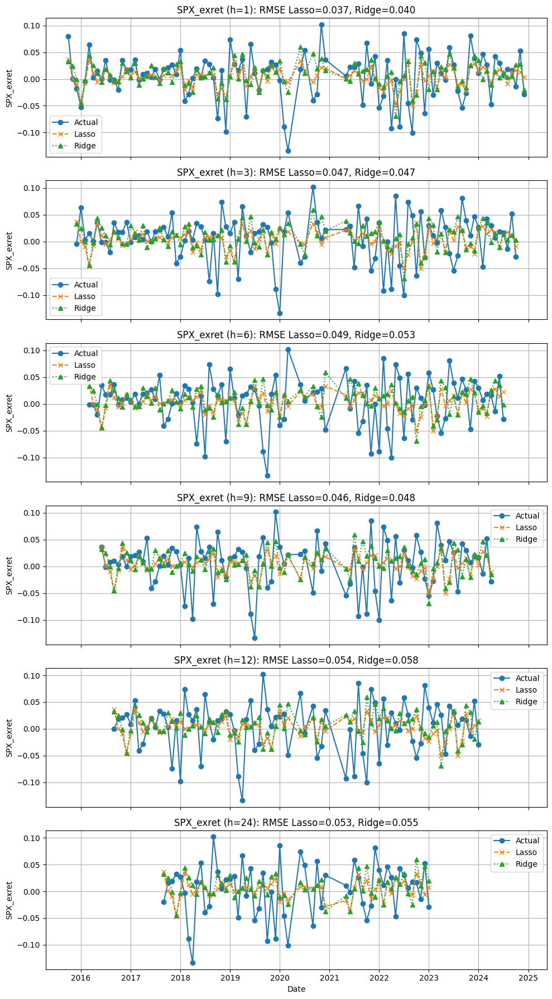

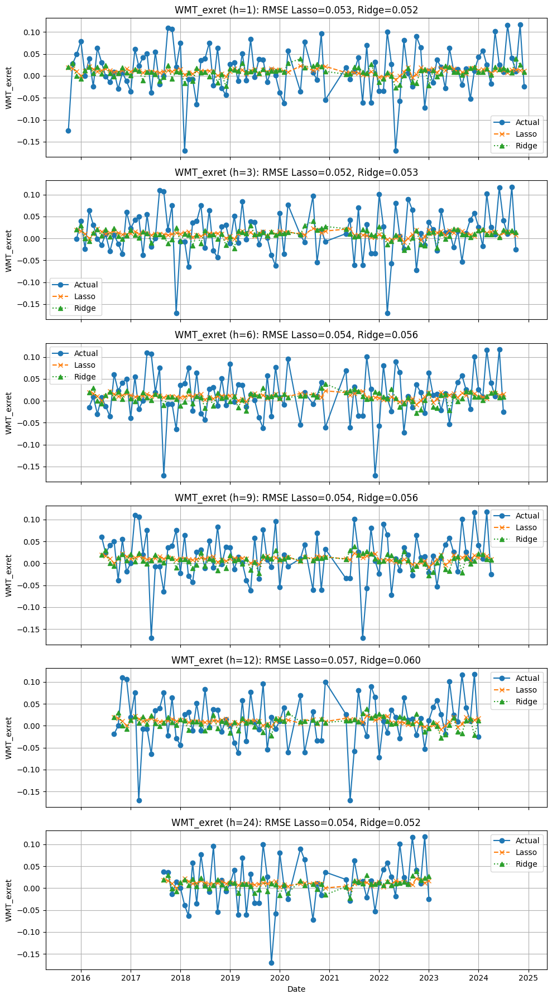

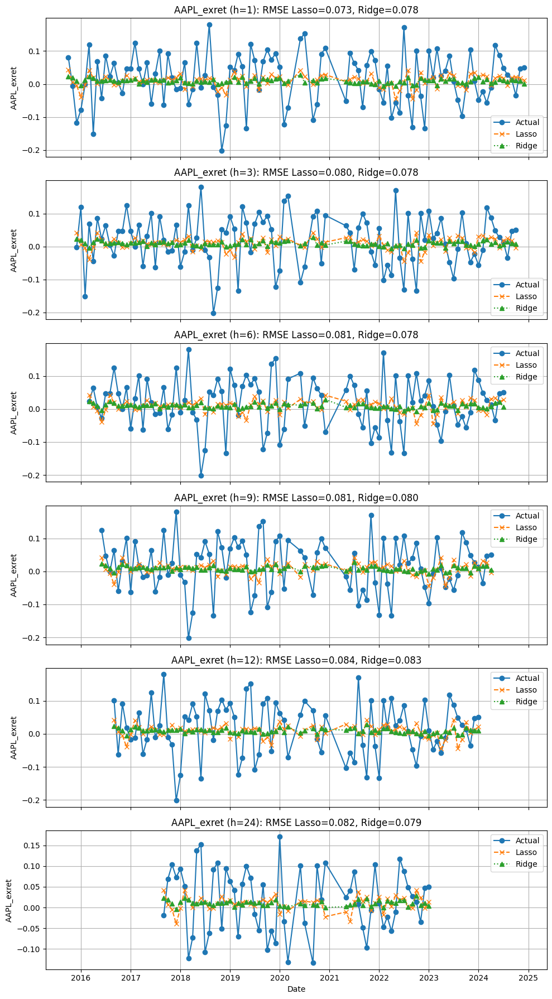

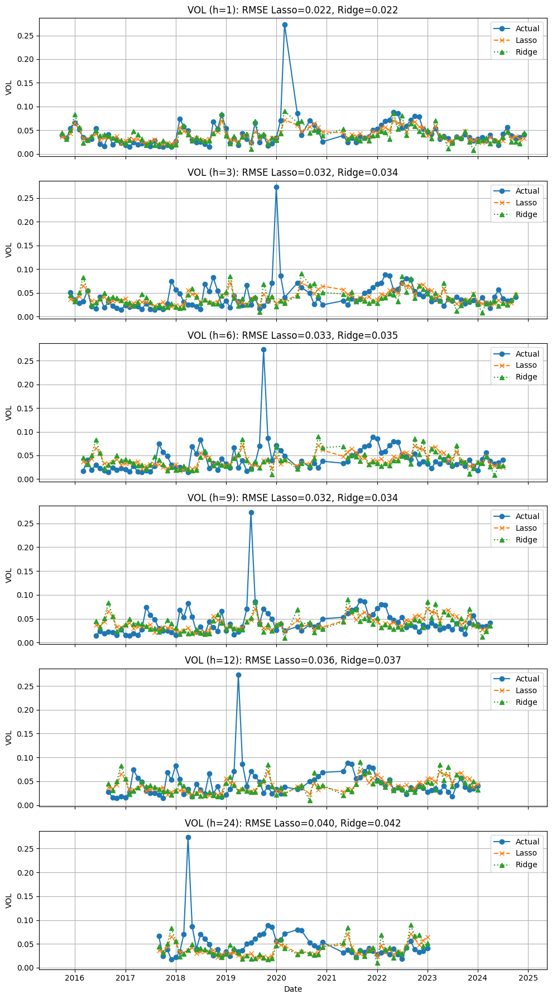

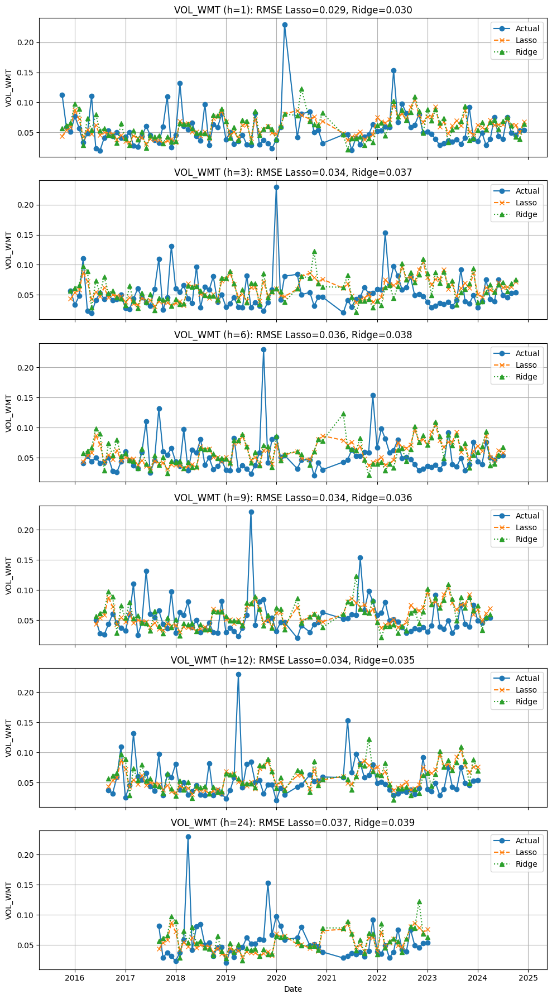

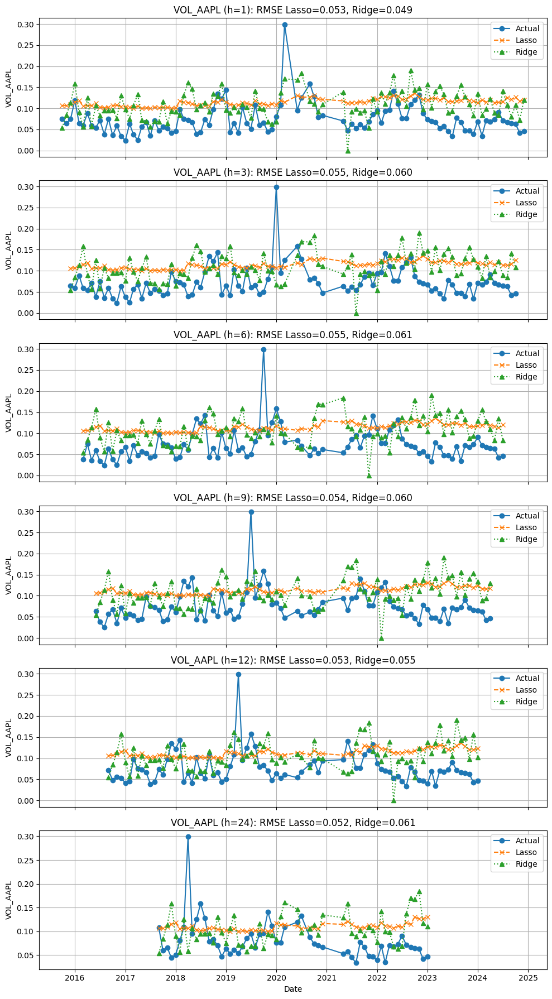

In [ ]:
def plot_comparison(forecasts, target, horizons):
    n = len(horizons)
    fig, axes = plt.subplots(n, 1, figsize=(10, 3*n), sharex=True)
    if n == 1:
        axes = [axes]
    for ax, h in zip(axes, horizons):
        pl, ac = forecasts[target]['lasso'][h]
        pr, _  = forecasts[target]['ridge'][h]

        # convert PeriodIndex to TimestampIndex for plotting
        time = ac.index.to_timestamp()

        ax.plot(time, ac.values,    'o-', label='Actual')
        ax.plot(time, pl.values,    'x--', label='Lasso')
        ax.plot(time, pr.values,    '^:',  label='Ridge')

        rmse_l = summary_lasso.loc[(target, h), 'rmse_lasso']
        rmse_r = summary_lasso.loc[(target, h), 'rmse_ridge']
        ax.set_title(f"{target} (h={h}): RMSE Lasso={rmse_l:.3f}, Ridge={rmse_r:.3f}")
        ax.legend(loc='best')
        ax.grid(True)
        ax.set_ylabel(target)

    axes[-1].set_xlabel('Date')
    plt.tight_layout()
    plt.show()

# --- 7) MAKE PLOTS ---
for t in targets:
    plot_comparison(forecast_store, t, horizons)

## Table to compare Lasso and Ridge to Factors

In [ ]:
print(summary_factors)

In [ ]:
print(summary_lasso)

In [ ]:
import pandas as pd

# Assuming summary_factors and summary_lasso are already defined DataFrames

# --- Prepare summary_factors ---
# Reset index to manipulate easier
factors = summary_factors.reset_index()

# --- Prepare summary_lasso ---
# Split into excess return and volatility forecasts
lasso = summary_lasso.reset_index()
lasso_exret = lasso[lasso['target'].str.endswith('_exret')].copy()
lasso_vol = lasso[lasso['target'].str.startswith('VOL')].copy()

# Parse asset names
lasso_exret['asset'] = lasso_exret['target'].str.replace('_exret', '')
lasso_vol['asset'] = lasso_vol['target'].str.replace('VOL_', '')
lasso_vol['asset'] = lasso_vol['asset'].replace({'VOL': 'SPX'})  # Normalize SPX naming

# --- Merge excess return forecasts ---
exret_merged = pd.merge(
    factors[['asset', 'horizon', 'ret_factors', 'rmse_fac_ret', 'rmse_ar1_ret']],
    lasso_exret[['asset', 'horizon', 'rmse_lasso', 'rmse_ridge', 'n_nonzero_lasso', 'alpha_lasso', 'alpha_ridge']],
    on=['asset', 'horizon'],
    how='inner'
)
exret_merged = exret_merged.set_index(['asset', 'horizon'])

# --- Merge volatility forecasts ---
vol_merged = pd.merge(
    factors[['asset', 'horizon', 'vol_factors', 'rmse_fac_vol', 'rmse_ar1_vol']],
    lasso_vol[['asset', 'horizon', 'rmse_lasso', 'rmse_ridge', 'n_nonzero_lasso', 'alpha_lasso', 'alpha_ridge']],
    on=['asset', 'horizon'],
    how='inner'
)
vol_merged = vol_merged.set_index(['asset', 'horizon'])

# Drop the specified columns
cols_to_drop = ['ret_factors', 'vol_factors', 'n_nonzero_lasso', 'alpha_lasso', 'alpha_ridge']

# Drop only the columns that exist in each DataFrame
excess_ret_cleaned = exret_merged.drop(columns=[col for col in cols_to_drop if col in exret_merged.columns])
vol_cleaned = vol_merged.drop(columns=[col for col in cols_to_drop if col in vol_merged.columns])

# Resulting tables
print("Cleaned Excess Return Forecasts Table:")
print(excess_ret_cleaned)

print("\nCleaned Volatility Forecasts Table:")
print(vol_cleaned)

In [ ]:
print(excess_ret_cleaned.to_latex(
    index=True,
    float_format="%.6f",
    caption="Forecast Accuracy for Excess Returns",
    label="tab:excess_return_forecasts",
    multicolumn=True,
    multirow=True
))

print(vol_cleaned.to_latex(
    index=True,
    float_format="%.6f",
    caption="Forecast Accuracy for Volatility",
    label="tab:volatility_forecasts",
    multicolumn=True,
    multirow=True
))

# Re-estimation with Shorter Vintage

We repeat the analysis excluding the volatile COVID 19 pandemic

In [ ]:
import pandas as pd
import numpy as np
# Remove the first -- second in data frame -- row (which held the tcodes)
# df = get_data("FE_projects/2025-03.csv",transform=True)
# df = get_data('/content/drive/MyDrive/FE_projects/2025-03.csv',transform=True)
df = get_data('2025-03.csv',transform=True)

# make 1980:1 the start to 2019:12
df=df.iloc[252:-62,:]
df

In [ ]:
# Check for optimal amount of factors via BIC
optimal_components, bic_values = select_optimal_components(standardized_df, max_components=10)
print(f"Optimal number of components: {optimal_components}")

In [ ]:
bic_values

In [ ]:
standardized_df, stats = standardize_dataframe(df)
num_factors = 8
F, Lambda, X_complete = em_dynamic_factor_balanced_init(standardized_df, num_factors)

In [ ]:
# removing the first transformation row significantly improve the graphs!
import matplotlib.pyplot as plt
plt.plot(F[:,0], label='factor 1')
plt.plot(F[:,1], label='factor 2')
plt.plot(F[:,2], label='factor 3')
plt.plot(F[:,3], label='factor 4')
plt.plot(F[:,4], label='factor 5')
plt.plot(F[:,5], label='factor 6')
plt.plot(F[:,6], label='factor 7')
plt.plot(F[:,7], label='factor 8')
# plt.plot(F[:,8], label='factor 9')
# plt.plot(F[:,9], label='factor 10')
plt.legend();

In [ ]:
# Compute the cumulative R² for each series as factors are added.
R2_matrix = compute_R2_values(X_complete, F)

# Then compute the incremental R² (mR²) for each factor for each series and the average across series.
mR2_individual, mR2_average = compute_incremental_R2(R2_matrix)

series_names = df.columns.tolist()

# Optionally, create column labels for the factors
factor_labels = [f'Factor_{i+1}' for i in range(num_factors)]

# Create a DataFrame from the mR2_individual array with the desired indices and columns
mR2_df = pd.DataFrame(mR2_individual, index=series_names, columns=factor_labels)
mR2_df

In [ ]:
mR2_df.sort_values(by='Factor_1', ascending=False).head(10)

In [ ]:
print(mR2_average)
sum(mR2_average)

The factors explain more when using data starting the 1980s rather than 1960s

## Factor Prediction

In [ ]:
# We create our factors dataframe for the forecasting below
factors_df = pd.DataFrame(F, columns=[f"Factor_{i+1}" for i in range(8)])
factors_df.index = df.index
factors_df.index = factors_df.index.to_period('M')
factors_df

Change to forecasting using an ARMA(p,q) selected via BIC to see if we get better model performance

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

# 1) TRAIN/TEST SPLIT (80/20 by time)
n        = len(factors_df)
n_train  = int(0.8 * n)
train_df = factors_df.iloc[:n_train]
test_df  = factors_df.iloc[n_train:]

# 2) SELECT BEST ARMA(p,q) BY BIC, FORECAST & RMSE
max_p = 3
max_q = 3

arma_models = {}
rmse_arma   = {}
arma_params = {}

for col in factors_df.columns:
    y_tr = train_df[col].dropna()
    best_bic, best_order, best_mod = np.inf, None, None

    # grid search p=0..max_p, q=0..max_q
    for p in range(max_p+1):
        for q in range(max_q+1):
            try:
                mod = ARIMA(y_tr, order=(p,0,q)).fit(method_kwargs={"warn_convergence":False})
                if mod.bic < best_bic:
                    best_bic, best_order, best_mod = mod.bic, (p,0,q), mod
            except Exception:
                continue

    arma_models[col]   = best_mod
    arma_params[col]   = {"order":best_order, **best_mod.params.to_dict()}

    # one‐step‐ahead on test set:
    # supply forecast length = len(test_df)
    y_pred = best_mod.forecast(steps=len(test_df))
    y_true = test_df[col]
    rmse_arma[col] = np.sqrt(mean_squared_error(y_true, y_pred))

# 3) COEFFICIENTS AND RMSE TABLES
coef_df = (pd.DataFrame(arma_params)
            .T
            .rename(columns=lambda x: x if x!="order" else "arma_order"))
rmse_df = pd.Series(rmse_arma, name="ARMA_test_RMSE")

print("ARMA(p,q) Coefficients & Orders\n")
print(coef_df)
print("\nTest RMSEs\n")
print(rmse_df)

# 4) ONE‐STEP FORECASTS FROM 1980‐01 ONWARD
start      = "1980-01"
slice_df   = factors_df.loc[start:]
forecast_df = pd.DataFrame(index=slice_df.index)

for col, mod in arma_models.items():
    # merge train + slice so dynamic=False uses actual y(t−1) at each step
    full = pd.concat([train_df[col], slice_df[col]])
    preds_full = mod.predict(start=full.index[0], end=full.index[-1], dynamic=False)
    forecast_df[col] = preds_full.loc[slice_df.index]

# 5) UNIFIED DATAFRAME
forecast_df   = forecast_df.add_suffix("_ARMA")
unified_df    = pd.concat([slice_df, forecast_df], axis=1)
print("\nUnified forecasts (first 5 rows):\n")
print(unified_df.head())

## Stock Market Data

In [ ]:
# 1) Define the tickers
SPX_TICKER  = "^GSPC"   # S&P 500 index
TBILL_TICKER = "^IRX"   # CBOE 13‑Week T‑Bill (^IRX gives the annualized % yield)
WMT_TICKER = "WMT"
AAPL_TICKER = "AAPL"
# 2) Download history
#    Adjust start/end as needed
data = yf.download(
    [SPX_TICKER, TBILL_TICKER, WMT_TICKER, AAPL_TICKER],
    start="1981-01-01",
    end="2025-03-31",
    progress=False
)

# 3) Keep only the Adj Close columns
df_stocks = data["Close"].rename(columns={
    SPX_TICKER: "SPX_Close",
    WMT_TICKER: "WMT_Close",
    AAPL_TICKER: "AAPL_Close",
    TBILL_TICKER: "Tbill_Yield"
})

# 4) Convert T‑bill from % to daily log‐yield
#    IRX is quoted as a percent annual rate, so:
df_stocks["Tbill_Yield"] = df_stocks["Tbill_Yield"] / 100            # → decimal annual rate
df_stocks["rf_daily"]    = np.log1p(df_stocks["Tbill_Yield"] / 252)   # assume 252 trading days

# 5) Compute daily SPX log‐return and excess‐return
df_stocks["spx_ret"]     = np.log(df_stocks["SPX_Close"]).diff()
df_stocks["spx_exret"]   = df_stocks["spx_ret"] - df_stocks["rf_daily"]
# same fore walmart WMT
df_stocks["wmt_ret"]     = np.log(df_stocks["WMT_Close"]).diff()
df_stocks["wmt_exret"]   = df_stocks["wmt_ret"] - df_stocks["rf_daily"]
# same for AAPL
df_stocks["aapl_ret"]     = np.log(df_stocks["AAPL_Close"]).diff()
df_stocks["aapl_exret"]   = df_stocks["aapl_ret"] - df_stocks["rf_daily"]

# 6) Long Sample mean of daily excess return
Rbar = df_stocks["spx_exret"].mean()
Rbar_WMT = df_stocks["wmt_exret"].mean()
Rbar_AAPL = df_stocks["aapl_exret"].mean()

# 7) Squared Deviations will be the variance
df_stocks["sq_dev"] = (df_stocks["spx_exret"] - Rbar)**2
df_stocks["sq_dev_WMT"]= (df_stocks["wmt_exret"] - Rbar_WMT)**2
df_stocks["sq_dev_AAPL"]= (df_stocks["aapl_exret"] - Rbar_AAPL)**2

# 8) We aggregate to Monthly volatility from daily
# Sum daily numbers, then take the square-root
monthly_vol = (
    df_stocks["sq_dev"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)    # √[ Σ (…) ]
      .rename("VOL")
)
monthly_vol_wmt = (
    df_stocks["sq_dev_WMT"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)    # √[ Σ (…) ]
      .rename("VOL")
)
monthly_vol_aapl = (
    df_stocks["sq_dev_AAPL"]
      .resample("ME")    # monthly groups instead of quarterly
      .sum()            # Σ (R_sk – R̄_s)^2 for k in month m
      .pipe(np.sqrt)
      .rename("VOL")
)

# 9) Monthly Panel
monthly = pd.DataFrame({
    "SPX_exret": df_stocks["spx_exret"].resample("ME").sum(),
    "WMT_exret": df_stocks["wmt_exret"].resample("ME").sum(),
    "AAPL_exret": df_stocks["aapl_exret"].resample("ME").sum(),
    "Tbill_Yield": df_stocks["Tbill_Yield"].resample("ME").mean(),
    "VOL": monthly_vol,
    "VOL_WMT": monthly_vol_wmt,
    "VOL_AAPL": monthly_vol_aapl
})

# remove day from date
monthly.index = monthly.index.to_period('M')
monthly

In [ ]:
# we merged our dataframes for the regressions below
# Reset the index of the original DataFrame to align with the factors
df_merged = pd.concat([monthly, unified_df], axis=1)
df_merged = df_merged.dropna(subset=['Factor_1', 'SPX_exret'])
# drop the first row due to not having a forecast
df_merged = df_merged.iloc[1:]
print(df_merged)

## Regression

### Function code

### 3-factor model forecast

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA

def forecast_analysis(
    df,
    ret_var,
    vol_var,
    factor_cols,
    h,
    ret_factors,
    vol_factors,
    max_ret_ar=3,
    max_ret_ma=3
):
    # 0) copy, sort, and rescale for numerical stability
    df2 = df.copy().sort_index()
    df2[ret_var] *= 100
    df2[vol_var] *= 100

    # 1) build h-step leads and one-lag return (for ARMA benchmark)
    df2[f"{ret_var}_lead"] = df2[ret_var].shift(-h)
    df2[f"{vol_var}_lead"] = df2[vol_var].shift(-h)
    df2["vol_t"]           = df2[vol_var]
    df2[f"{ret_var}_lag1"] = df2[ret_var].shift(1)

    # 2) drop missing, split train/test
    df_ret = df2[[f"{ret_var}_lead", f"{ret_var}_lag1"] + factor_cols].dropna()
    df_vol = df2[[f"{vol_var}_lead", "vol_t"] + factor_cols].dropna()

    split_ret = int(0.8 * len(df_ret))
    split_vol = int(0.8 * len(df_vol))

    train_ret, test_ret = df_ret.iloc[:split_ret], df_ret.iloc[split_ret:]
    train_vol, test_vol = df_vol.iloc[:split_vol], df_vol.iloc[split_vol:]

    # 3) Factor-augmented return forecast (no lagged returns)
    y_tr_ret = train_ret[f"{ret_var}_lead"]
    y_te_ret = test_ret[f"{ret_var}_lead"]

    X_tr_fac = sm.add_constant(train_ret[factor_cols[:ret_factors]])
    X_te_fac = sm.add_constant(test_ret[factor_cols[:ret_factors]])

    fac_mod   = sm.OLS(y_tr_ret, X_tr_fac).fit()
    y_hat_fac = fac_mod.predict(X_te_fac)
    rmse_fac  = np.sqrt(((y_te_ret - y_hat_fac)**2).mean())

    # 4) ARMA(p,q) benchmark for returns (select by BIC)
    best_bic_ret, best_arma_ret = np.inf, None
    for p in range(max_ret_ar+1):
        for q in range(max_ret_ma+1):
            try:
                m = ARIMA(
                    y_tr_ret,
                    order=(p,0,q),
                    enforce_stationarity=False,
                    enforce_invertibility=False
                ).fit()
                if m.bic < best_bic_ret:
                    best_bic_ret, best_arma_ret = m.bic, m
            except:
                continue

    y_hat_arma_ret = best_arma_ret.predict(
        start=test_ret.index[0],
        end=test_ret.index[-1]
    )
    rmse_arma_ret = np.sqrt(((y_te_ret - y_hat_arma_ret)**2).mean())

    # 5) Factor-augmented volatility forecast
    y_tr_vol = train_vol[f"{vol_var}_lead"]
    y_te_vol = test_vol[f"{vol_var}_lead"]

    X_tr_vf = sm.add_constant(train_vol[["vol_t"] + factor_cols[:vol_factors]])
    X_te_vf = sm.add_constant(test_vol[["vol_t"] + factor_cols[:vol_factors]])

    vfac_mod  = sm.OLS(y_tr_vol, X_tr_vf).fit()
    y_hat_vf  = vfac_mod.predict(X_te_vf)
    rmse_vf   = np.sqrt(((y_te_vol - y_hat_vf)**2).mean())

    # 6) ARMA(p,q) benchmark for volatility (select by BIC)
    best_bic_vol, best_arma_vol = np.inf, None
    for p in range(max_ret_ar+1):
        for q in range(max_ret_ma+1):
            try:
                m = ARIMA(
                    y_tr_vol,
                    order=(p,0,q),
                    enforce_stationarity=False,
                    enforce_invertibility=False
                ).fit()
                if m.bic < best_bic_vol:
                    best_bic_vol, best_arma_vol = m.bic, m
            except:
                continue

    y_hat_arma_vol = best_arma_vol.predict(
        start=test_vol.index[0],
        end=test_vol.index[-1]
    )
    rmse_arma_vol = np.sqrt(((y_te_vol - y_hat_arma_vol)**2).mean())

    return {
        "horizon":        h,
        "ret_factors":    ret_factors,
        "rmse_fac_ret":   rmse_fac,
        "rmse_arma_ret":  rmse_arma_ret,
        "vol_factors":    vol_factors,
        "rmse_fac_vol":   rmse_vf,
        "rmse_arma_vol":  rmse_arma_vol
    }

In [ ]:
# ------------------------
# CONFIGURATION & RUN
manual_config = {h: {"ret_factors": 3, "vol_factors": 3} for h in [1,3,6,9,12,24]}
horizons      = [1,3,6,9,12,24]
assets        = [
    ("SPX_exret", "VOL"),
    ("WMT_exret","VOL_WMT"),
    ("AAPL_exret","VOL_AAPL")
]

# Raw factor names (omit any “_ARMA” columns)
factor_cols = [c for c in df_merged.columns
               if c.startswith("Factor_") and not c.endswith("_ARMA")]

all_results = []
for ret_var, vol_var in assets:
    for h in horizons:
        cfg = manual_config[h]
        res = forecast_analysis(
            df=            df_merged,
            ret_var=       ret_var,
            vol_var=       vol_var,
            factor_cols=   factor_cols,
            h=             h,
            ret_factors=   cfg["ret_factors"],
            vol_factors=   cfg["vol_factors"],
            max_ret_ar=    3,
            max_ret_ma=    3
        )
        res["asset"] = ret_var.split("_")[0]
        all_results.append(res)

summary_factors = pd.DataFrame(all_results).set_index(["asset","horizon"])
print(summary_factors)

### 8-Factor model

In [ ]:
# ----------------------------------------------------------------
# YOUR MANUAL CONFIG: for each horizon, how many factors to use
manual_config = {
    1:  {"ret_factors": 8, "vol_factors": 8},
    3:  {"ret_factors": 8, "vol_factors": 8},
    6:  {"ret_factors": 8, "vol_factors": 8},
    9:  {"ret_factors": 8, "vol_factors": 8},
    12: {"ret_factors": 8, "vol_factors": 8},
    24: {"ret_factors": 8, "vol_factors": 8},
}

horizons = [1,3,6,9,12,24]
assets   = [
    ("SPX_exret","VOL"),
    ("WMT_exret","VOL_WMT"),
    ("AAPL_exret","VOL_AAPL")
]

all_results = []
for ret_var, vol_var in assets:
    for h in horizons:
        cfg = manual_config[h]
        res = forecast_analysis_manual(
            df=            df_merged,           # or your winsorized df
            ret_var=       ret_var,
            vol_var=       vol_var,
            factor_cols=   factor_pred_cols,
            h=             h,
            ret_factors=   cfg["ret_factors"],
            vol_factors=   cfg["vol_factors"],
        )
        res["asset"] = ret_var.split("_")[0]
        all_results.append(res)

# Build summary table
summary_factors = pd.DataFrame(all_results).set_index(["asset","horizon"])
print(summary_factors)